In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
from sklearn.metrics import f1_score, precision_score, recall_score,accuracy_score

# Dataset Loading

In [2]:

train_dir = os.path.join('../../models/train')
validation_dir = os.path.join('../../models/val')
test_dir = os.path.join('../../models/test')
BATCH_SIZE = 16
IMG_SIZE = (224, 224)
train_dataset = tf.keras.utils.image_dataset_from_directory(train_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)


Found 21998 files belonging to 6 classes.


In [3]:
validation_dataset = tf.keras.utils.image_dataset_from_directory(validation_dir,
                                                                 shuffle=True,
                                                                 batch_size=BATCH_SIZE,
                                                                 image_size=IMG_SIZE)

Found 2442 files belonging to 6 classes.


In [4]:
test_dataset = tf.keras.utils.image_dataset_from_directory(test_dir,
                                                           shuffle=False,
                                                           batch_size=BATCH_SIZE,
                                                           image_size=IMG_SIZE)

Found 600 files belonging to 1 classes.


Show the first nine images and labels from the training set:

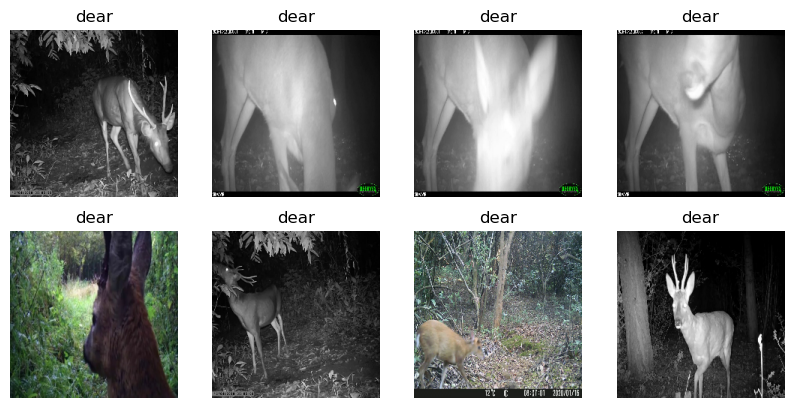

In [5]:
class_labels = ['dear', 'fox','leopard cat','porcupine','sumatran serow', 'wild boar']

plt.figure(figsize=(10, 10))
for images, labels in test_dataset.take(1):
    for i in range(8):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_labels[labels[i]])
        plt.axis("off")

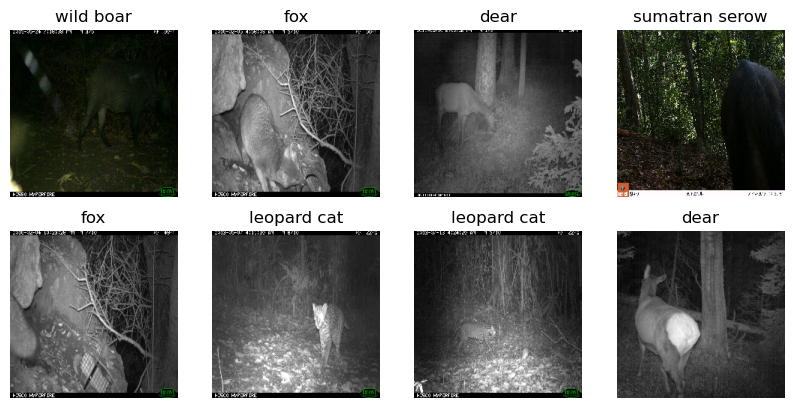

In [6]:
class_labels = ['dear', 'fox','leopard cat','porcupine','sumatran serow', 'wild boar']

plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
    for i in range(8):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_labels[labels[i]])
        plt.axis("off")

In [7]:
val_batches = tf.data.experimental.cardinality(validation_dataset)
# Calculate the cardinality of the validation dataset to determine the number of batches.


In [8]:
print('Number of validation batches: %d' % tf.data.experimental.cardinality(validation_dataset))
print('Number of test batches: %d' % tf.data.experimental.cardinality(test_dataset))

Number of validation batches: 153
Number of test batches: 38


### Configure the dataset for performance

Use buffered prefetching to load images from disk without having I/O become blocking. 

In [9]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

# Data Preprocessing Pipeline

## Experimental Data Augmentation Mechanism

In [10]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomCrop(224, 224, seed=None, name=None),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.2, fill_mode='nearest'),
    
])

Here we're using the staratergy of applying the data augmnetation layers to the  dataset
Benefits of applying data augmentation to the dataset:
1. Faster Training: Augmenting data within the dataset preprocessing phase can speed up the training process.
2. Reduced Model Complexity: Keeping data augmentation separate from the model architecture leads to simpler models.
3. Improved Generalization: Exposing the model to a wider variety of examples during training helps improve its ability to generalize.
4. Ease of Experimentation: It's easier to experiment with different augmentation techniques and parameters.
5. Resource Efficiency: Augmenting data within the dataset preprocessing phase allows for better utilization of computational resources.

Let's repeatedly apply these layers to the same image and see the result first before applying to the entire dataset.

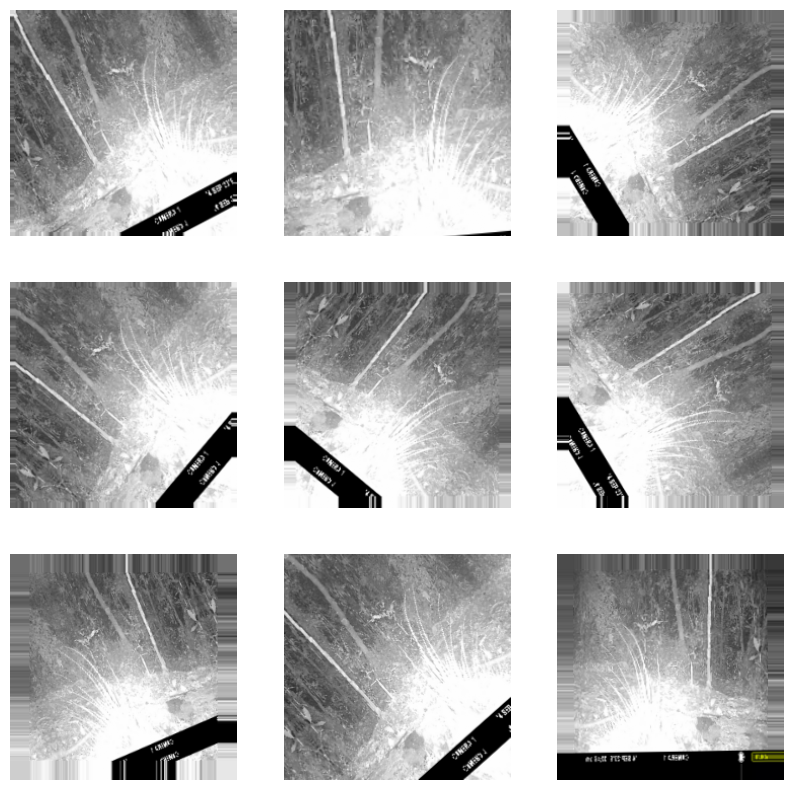

In [11]:
for image, _ in train_dataset.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

## Use Image Resizing

In [12]:
resize_fn = tf.keras.layers.Resizing(224, 224)

train_dataset= train_dataset.map(lambda x, y: (resize_fn(x), y))
validation_dataset = validation_dataset.map(lambda x, y: (resize_fn(x), y))
test_dataset = test_dataset.map(lambda x, y: (resize_fn(x), y))

## Apply Data Augmentation for the Train Dataset

In [13]:
augmentation_layers = [
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomCrop(224, 224, seed=None, name=None),
    tf.keras.layers.RandomZoom(0.2, fill_mode='nearest'),
]


def data_augmentation(x):
    for layer in augmentation_layers:
        x = layer(x)
    return x


train_dataset = train_dataset.map(lambda x, y: (data_augmentation(x), y))

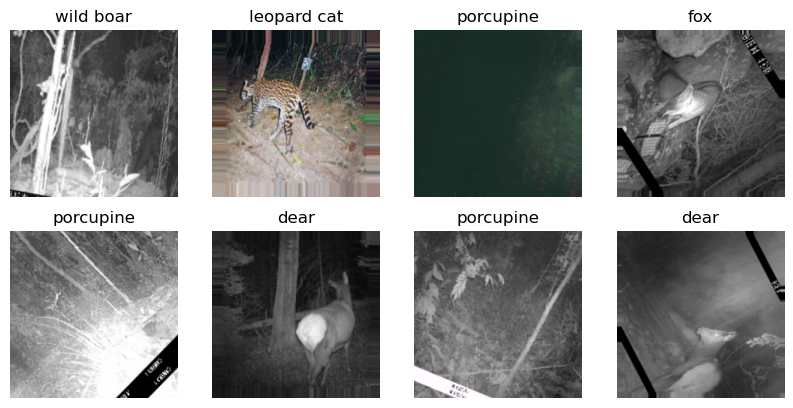

In [14]:
class_labels = ['dear', 'fox','leopard cat','porcupine','sumatran serow', 'wild boar']

plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
    for i in range(8):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_labels[labels[i]])
        plt.axis("off")

In [15]:
def preprocess(images, labels):
  return tf.keras.applications.mobilenet_v2.preprocess_input(images), labels

train_dataset = train_dataset.map(preprocess)
validation_dataset = validation_dataset.map(preprocess)
test_dataset = test_dataset.map(preprocess)


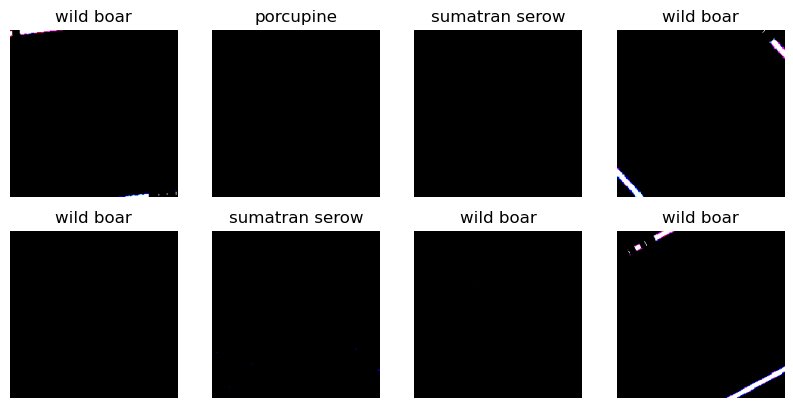

In [16]:
class_labels = ['dear', 'fox','leopard cat','porcupine','sumatran serow', 'wild boar']

plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
    for i in range(8):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_labels[labels[i]])
        plt.axis("off")

In [17]:
true_labels = []
for _, labels in test_dataset:
    true_labels.extend(labels.numpy())

# Print the true labels
print('True Labels:\n', true_labels)

True Labels:
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

# Create the base model from the pre-trained convnets

In [18]:
# Create the base model from the pre-trained model MobileNet V2
IMG_SHAPE = IMG_SIZE + (3,)
inputs = tf.keras.Input(shape=(224, 224, 3))

base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

## Feature extraction
In this step, will freeze the convolutional base created from the previous step and to use as a feature extractor. Additionally,add a classifier on top of it and train the top-level classifier.

### Freeze the convolutional base

It is important to freeze the convolutional base before you compile and train the model. Freezing (by setting layer.trainable = False) prevents the weights in a given layer from being updated during training. MobileNet V2 has many layers, so setting the entire model's `trainable` flag to False will freeze all of them.

In [19]:
base_model.trainable = False

## Convert the Features to a Single Element

To generate predictions from the block of features, average over the spatial `5x5` spatial locations, using a `tf.keras.layers.GlobalAveragePooling2D` layer to convert the features to  a single 1280-element vector per image.

In [20]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

### Add a classification head

Apply a `tf.keras.layers.Dense` layer to convert these features into a single prediction per image. You don't need an activation function here because this prediction will be treated as a `logit`, or a raw prediction value. Positive numbers predict class 1, negative numbers predict class 0.

In [21]:
prediction_layer = tf.keras.layers.Dense(6,activation='softmax',name='prediction',kernel_regularizer=tf.keras.regularizers.l2(0.01))

## Setting up Model 

Build a model by chaining together the data augmentation, rescaling, `base_model` and feature extractor layers using the [Keras Functional API](https://www.tensorflow.org/guide/keras/functional). As previously mentioned, use `training=False` as our model contains a `BatchNormalization` layer.

In [22]:
inputs = tf.keras.Input(shape=(224, 224, 3))
x = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
x = tf.keras.layers.Dropout(0.5)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(base_model.input,outputs)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']        

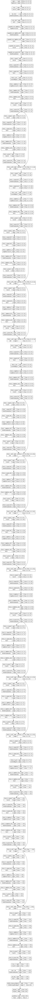

In [23]:
from tensorflow.keras.utils import plot_model
tf.keras.utils.plot_model(
model, to_file='model.png', show_shapes=True, show_dtype=False,
show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96
)

In [24]:
wdgffhdhdhdhdhdhdh

NameError: name 'wdgffhdhdhdhdhdhdh' is not defined

In [ ]:

rgasfgs

NameError: name 'rgasfgs' is not defined

In [ ]:
layer_names = [layer.name for layer in model.layers]
print(layer_names)

['input_2', 'Conv1', 'bn_Conv1', 'Conv1_relu', 'expanded_conv_depthwise', 'expanded_conv_depthwise_BN', 'expanded_conv_depthwise_relu', 'expanded_conv_project', 'expanded_conv_project_BN', 'block_1_expand', 'block_1_expand_BN', 'block_1_expand_relu', 'block_1_pad', 'block_1_depthwise', 'block_1_depthwise_BN', 'block_1_depthwise_relu', 'block_1_project', 'block_1_project_BN', 'block_2_expand', 'block_2_expand_BN', 'block_2_expand_relu', 'block_2_depthwise', 'block_2_depthwise_BN', 'block_2_depthwise_relu', 'block_2_project', 'block_2_project_BN', 'block_2_add', 'block_3_expand', 'block_3_expand_BN', 'block_3_expand_relu', 'block_3_pad', 'block_3_depthwise', 'block_3_depthwise_BN', 'block_3_depthwise_relu', 'block_3_project', 'block_3_project_BN', 'block_4_expand', 'block_4_expand_BN', 'block_4_expand_relu', 'block_4_depthwise', 'block_4_depthwise_BN', 'block_4_depthwise_relu', 'block_4_project', 'block_4_project_BN', 'block_4_add', 'block_5_expand', 'block_5_expand_BN', 'block_5_expand_

In [ ]:
# Print layer index and name
for layer_index, layer in enumerate(model.layers):
    print(model.layers)
    print(f"Layer {layer_index}: {layer.name}")

[<keras.engine.input_layer.InputLayer object at 0x000001648DEECC40>, <keras.layers.convolutional.conv2d.Conv2D object at 0x00000164853025C0>, <keras.layers.normalization.batch_normalization.BatchNormalization object at 0x000001648DF0B250>, <keras.layers.activation.relu.ReLU object at 0x000001648DECD8D0>, <keras.layers.convolutional.depthwise_conv2d.DepthwiseConv2D object at 0x0000016485303A90>, <keras.layers.normalization.batch_normalization.BatchNormalization object at 0x0000016485302380>, <keras.layers.activation.relu.ReLU object at 0x0000016485303A30>, <keras.layers.convolutional.conv2d.Conv2D object at 0x000001648E175930>, <keras.layers.normalization.batch_normalization.BatchNormalization object at 0x000001648E175EA0>, <keras.layers.convolutional.conv2d.Conv2D object at 0x000001648E1769E0>, <keras.layers.normalization.batch_normalization.BatchNormalization object at 0x000001648E176EC0>, <keras.layers.activation.relu.ReLU object at 0x000001648E1760E0>, <keras.layers.reshaping.zero_p

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

In [ ]:
base_model.input

<KerasTensor: shape=(None, 224, 224, 3) dtype=float32 (created by layer 'input_2')>

In [ ]:

import tensorflow as tf
import os
import tensorflow.python.keras.backend as K


# Set the number of parallel execution units
NUM_PARALLEL_EXEC_UNITS = 8

# Configuring TensorFlow Session
config = tf.compat.v1.ConfigProto(
    intra_op_parallelism_threads=NUM_PARALLEL_EXEC_UNITS,
    inter_op_parallelism_threads=1
)
sess=tf.compat.v1.Session(config=config)
K.set_session(sess)


# MKL and OpenMP
os.environ["OMP_NUM_THREADS"] = str(NUM_PARALLEL_EXEC_UNITS)
os.environ["KMP_BLOCKTIME"] = "1"
os.environ["KMP_SETTINGS"] = "1"
os.environ["KMP_AFFINITY"] = "granularity=fine,verbose,compact,1"

In [ ]:

# # Save the model with best weights
# top_layers_file_path = os.path.join(model_save_dir, model_name + "_top_layers.h5")

# # Save the model after every epoch.
# checkpoint = tf.keras.callbacks.ModelCheckpoint(top_layers_file_path, monitor='loss', verbose=1, save_best_only=True, mode='min')
# # Save the TensorBoard logs.
# tb = tf.keras.callbacks.TensorBoard(log_dir='./logs', write_graph=True, update_freq='batch')
# # Stop training when a monitored metric has stopped improving.
# early = tf.keras.callbacks.EarlyStopping(monitor="loss", mode="min", patience=5)
# # Save the CSV logger
# csv_logger = tf.keras.callbacks.CSVLogger('./logs/mobilenetv2-optimized-log.csv', append=True)

In [ ]:
# Check if GPU is available
import tensorflow as tf

devices = tf.config.list_physical_devices('GPU')
print("GPU Devices:", devices)

GPU Devices: []


### Compile the model

In [ ]:
base_learning_rate = 0.0001

model. compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate), metrics=['accuracy', 'top_k_categorical_accuracy'], loss='sparse_categorical_crossentropy')


### Train the model


In [ ]:
initial_epochs = 20
history = model.fit(train_dataset,
                    epochs=initial_epochs,
                    validation_data=validation_dataset)

Epoch 1/3
1375/1375 [==============================] - 1537s 1s/step - loss: 1.3703 - accuracy: 0.5434 - top_k_categorical_accuracy: 0.8634 - val_loss: 0.7576 - val_accuracy: 0.7912 - val_top_k_categorical_accuracy: 0.9267
Epoch 2/3
1375/1375 [==============================] - 1625s 1s/step - loss: 0.7937 - accuracy: 0.7611 - top_k_categorical_accuracy: 0.8349 - val_loss: 0.5789 - val_accuracy: 0.8501 - val_top_k_categorical_accuracy: 0.8948
Epoch 3/3
1375/1375 [==============================] - 1044s 755ms/step - loss: 0.6425 - accuracy: 0.8201 - top_k_categorical_accuracy: 0.8110 - val_loss: 0.5169 - val_accuracy: 0.8702 - val_top_k_categorical_accuracy: 0.9083


In [ ]:
model_name = "MobileNetV2_WithoutfineTune_Custom_Classification"


In [ ]:
import os
import matplotlib.pyplot as plt
from datetime import datetime

def accuracy_loss_plot(history, model_name, model_config, font_size=18):
    epochs = history.epoch
    tr_acc = history.history['accuracy']
    tr_loss = history.history['loss']
    val_acc = history.history['val_accuracy']
    val_loss = history.history['val_loss']
    run_epochs = len(epochs)

    f = 1
    save_epochs = [epochs[i] for i in range(0, run_epochs, f)]
    save_tr_acc = [tr_acc[i] for i in range(0, run_epochs, f)]
    save_tr_loss = [tr_loss[i] for i in range(0, run_epochs, f)]
    save_val_acc = [val_acc[i] for i in range(0, run_epochs, f)]
    save_val_loss = [val_loss[i] for i in range(0, run_epochs, f)]

    # Create a figure and axis with larger size
    fig, ax1 = plt.subplots(figsize=(20, 10))

    # Plot accuracy lines
    ax1.set_xlabel('Epochs', fontsize=font_size)
    ax1.set_ylabel('Accuracy', color='black', fontsize=font_size)
    ax1.tick_params(axis='both', which='major', labelsize=font_size - 2)
    ax1.plot(save_epochs, save_tr_acc, color='#A81414', marker='o', label='Training Accuracy')
    ax1.plot(save_epochs, save_val_acc, color='#2622A7', marker='x', label='Validation Accuracy')

    # Create a second y-axis for loss lines
    ax2 = ax1.twinx()  # Share the same x-axis
    ax2.set_ylabel('Loss', color='black', fontsize=font_size)
    ax2.tick_params(axis='both', which='major', labelsize=font_size - 2)
    ax2.plot(save_epochs, save_tr_loss, color='#3cb44b', marker='s', label='Training Loss')
    ax2.plot(save_epochs, save_val_loss, color='#f58231', marker='^', label='Validation Loss')

    # Add a legend with larger font size
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc='best', fontsize=font_size)

    # Set a title with larger font size
    plt.title('Accuracy and Loss Over Epochs', fontsize=font_size + 2)

    accuracy_matrices_path = os.path.join(os.getcwd(), './metrics/optimized_models_accuracy_matrices')

    curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
    filename = f'{model_name.lower()}-{model_config}-training_metrics_plot-{curr_datetime}.png'

    if not os.path.exists(accuracy_matrices_path):
        os.makedirs(accuracy_matrices_path)

    # Save the plot to the specified folder
    destination = os.path.join(accuracy_matrices_path, filename)
    plt.savefig(destination, bbox_inches='tight')


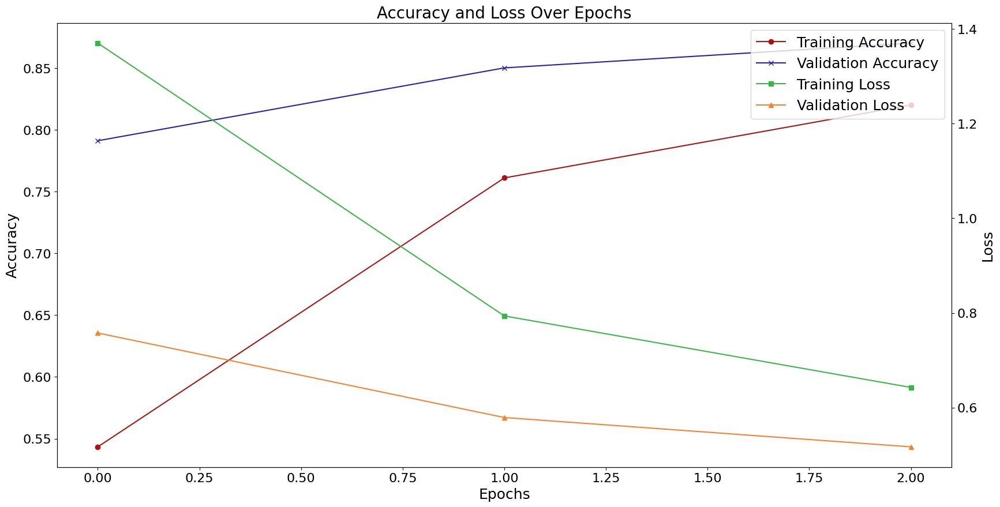

In [ ]:
accuracy_loss_plot(history, 'Feature Extraction with basemodel layers without tuning', model_config='initial_config')

In [ ]:
accu = history.history['accuracy']
val_acc = history.history['val_accuracy']

print(accu)
print(val_acc)


[0.5433675646781921, 0.7610691785812378, 0.8201200366020203]
[0.7911548018455505, 0.85012286901474, 0.8701883554458618]


In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']
print(loss)
print(val_loss)


[1.3703498840332031, 0.7936537265777588, 0.642543613910675]
[0.7576056718826294, 0.5789093971252441, 0.5168979167938232]


In [ ]:
#evaluating the model
accuracy = model.evaluate(validation_dataset)

153/153 [==============================] - 83s 518ms/step - loss: 0.5169 - accuracy: 0.8702 - top_k_categorical_accuracy: 0.9083


In [ ]:
accuracy = model.evaluate(test_dataset)

38/38 [==============================] - 15s 377ms/step - loss: 1.1355 - accuracy: 0.6567 - top_k_categorical_accuracy: 0.8917


In [ ]:

print("initial accuracy: {:.2f}".format(accuracy[1]))

initial accuracy: 0.66


### Learning curves

In [ ]:
def learning_curves(history, figsize=(10, 10), title_fontsize=14, label_fontsize=12):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    plt.figure(figsize=figsize)

    plt.subplot(2, 1, 1)
    plt.plot(acc, label='Training Accuracy', linewidth=2)
    plt.plot(val_acc, label='Validation Accuracy', linewidth=2)
    plt.legend(loc='lower right', fontsize=label_fontsize)
    plt.ylabel('Accuracy', fontsize=label_fontsize)
    plt.ylim([min(min(acc), min(val_acc)), 1])
    plt.title('Training and Validation Accuracy', fontsize=title_fontsize)

    plt.subplot(2, 1, 2)
    plt.plot(loss, label='Training Loss', linewidth=2)
    plt.plot(val_loss, label='Validation Loss', linewidth=2)
    plt.legend(loc='upper right', fontsize=label_fontsize)
    plt.ylabel('Cross Entropy', fontsize=label_fontsize)
    plt.ylim([0, 1.0])
    plt.title('Training and Validation Loss', fontsize=title_fontsize)
    plt.xlabel('Epoch', fontsize=label_fontsize)

    plt.tight_layout()
    plt.show()


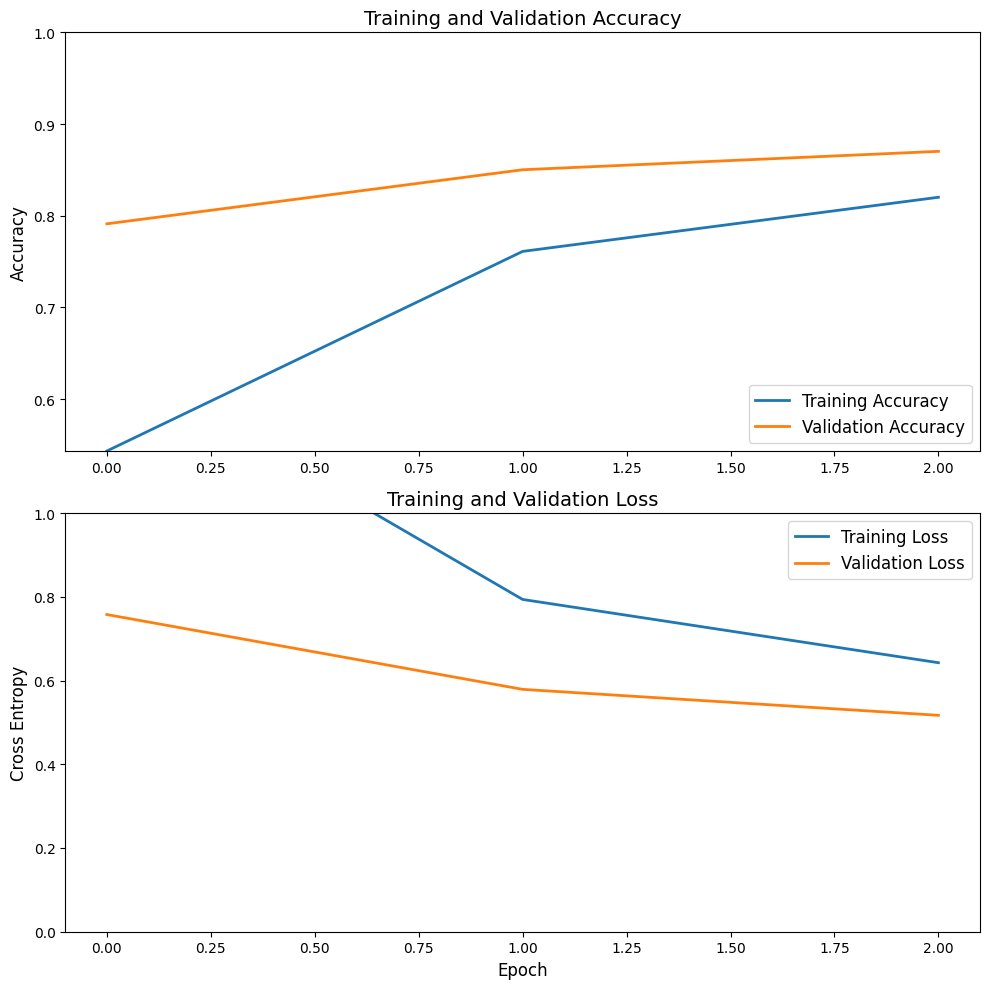

In [ ]:
learning_curves(history)

In [ ]:
def save_model(model,model_name):
    # Create a directory for optimized saved models if it doesn't exist
    os.makedirs("optimized_saved_models", exist_ok=True)
    
    # Save the entire model as a SavedModel with the specified name
    model.save(f'optimized_saved_models/{model_name}')

# Example usage:
# Assuming you have already created and trained a model named 'model'
save_model(model, model_name)

INFO:tensorflow:Assets written to: optimized_saved_models/MobileNetV2_WithoutfineTune_Custom_Classification\assets


INFO:tensorflow:Assets written to: optimized_saved_models/MobileNetV2_WithoutfineTune_Custom_Classification\assets


In [ ]:
from typing import Optional, Union
from tensorflow.python.framework.convert_to_constants import (
    convert_variables_to_constants_v2_as_graph,
)

from tensorflow.keras import Sequential, Model

import keras_flops.flops_registory


def get_flops(model: Union[Model, Sequential], batch_size: Optional[int] = None) -> int:
    """
    Calculate FLOPS for tf.keras.Model or tf.keras.Sequential .
    Ignore operations used in only training mode such as Initialization.
    Use tf.profiler of tensorflow v1 api.
    """
    if not isinstance(model, (Sequential, Model)):
        raise KeyError(
            "model arguments must be tf.keras.Model or tf.keras.Sequential instanse"
        )

    if batch_size is None:
        batch_size = 8

    # convert tf.keras model into frozen graph to count FLOPS about operations used at inference
    # FLOPS depends on batch size
    inputs = [
        tf.TensorSpec([batch_size] + inp.shape[1:], inp.dtype) for inp in model.inputs
    ]
    real_model = tf.function(model).get_concrete_function(inputs)
    frozen_func, _ = convert_variables_to_constants_v2_as_graph(real_model)

    # Calculate FLOPS with tf.profiler
    run_meta = tf.compat.v1.RunMetadata()
    opts = tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()
    flops = tf.compat.v1.profiler.profile(
        graph=frozen_func.graph, run_meta=run_meta, cmd="scope", options=opts
    )
    # print(frozen_func.graph.get_operations())
    # TODO: show each FLOPS
    return flops.total_float_ops

In [ ]:
get_flops(model,BATCH_SIZE) 

Instructions for updating:
Use `tf.compat.v1.graph_util.tensor_shape_from_node_def_name`


Instructions for updating:
Use `tf.compat.v1.graph_util.tensor_shape_from_node_def_name`


9802330624

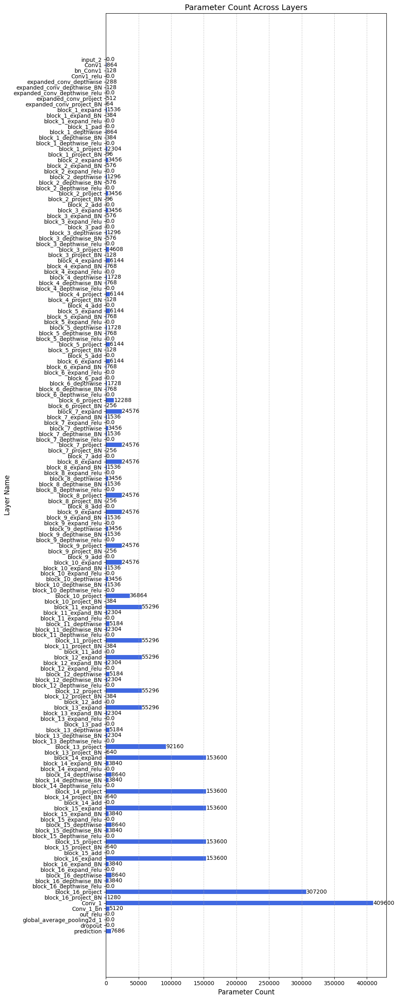

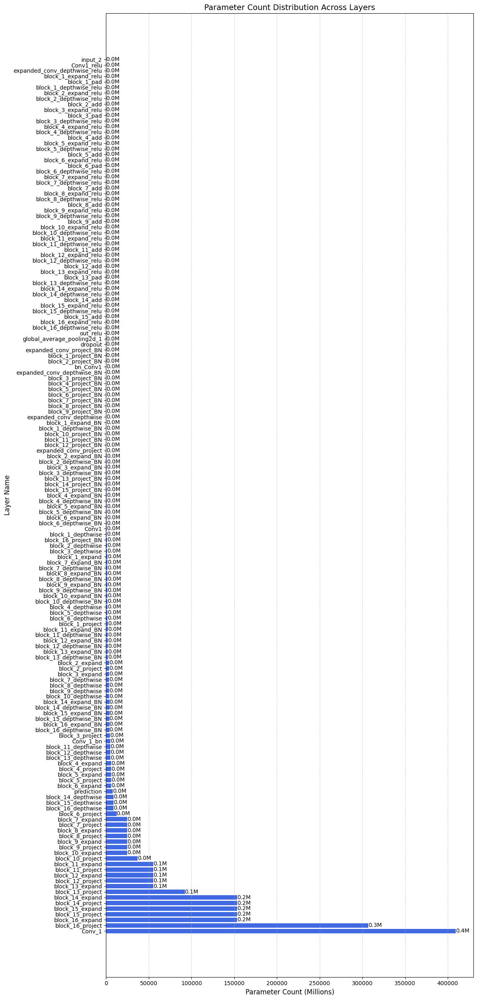

Total Parameters: 2265670.0


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras  # Assuming you're using TensorFlow 2.x

def count_parameters(layer):
    """Count the number of parameters in a layer."""
    return np.sum([np.prod(w.shape) for w in layer.get_weights()])

def plot_parameter_count(model):
    """Plot the parameter count for each layer in a TensorFlow Keras model."""
    layer_names = [layer.name for layer in model.layers]
    parameter_counts = [count_parameters(layer) for layer in model.layers]

    # Sort layers by parameter count for better visualization
    sorted_layers, sorted_counts = zip(*sorted(zip(layer_names, parameter_counts), key=lambda x: x[1]))

    # Assign colors to different types of layers
    colors = ['lightgreen' if 'activation' in name else 'lightblue' if 'conv' in name else 'royalblue' for name in sorted_layers]

    # Create a more visually appealing and informative plot
    plt.figure(figsize=(12, 25))
    bars = plt.barh(sorted_layers, sorted_counts, color=colors)
    plt.xlabel('Parameter Count (Millions)', fontsize=12)
    plt.ylabel('Layer Name', fontsize=12)
    plt.title('Parameter Count Distribution Across Layers', fontsize=14)
    plt.gca().invert_yaxis()  # Arrange layers from top (most parameters) to bottom
    plt.grid(axis='x', linestyle='--', alpha=0.6)  # Subtle grid for readability

    # Add informative annotations for each bar
    for bar, count in zip(bars, sorted_counts):
        plt.text(count, bar.get_y() + bar.get_height()/2, f'{count/1e6:.1f}M', va='center', fontsize=10, color='black')

    plt.tight_layout()

    plt.show()
def plot_parameter_table(model):
    """Plot the parameter count table for each layer in a TensorFlow Keras model without sorting."""
    layer_names = [layer.name for layer in model.layers]
    parameter_counts = [count_parameters(layer) for layer in model.layers]

    plt.figure(figsize=(10, 25))
    plt.barh(layer_names, parameter_counts, color='royalblue')
    plt.xlabel('Parameter Count', fontsize=12)
    plt.ylabel('Layer Name', fontsize=12)
    plt.title('Parameter Count Across Layers', fontsize=14)
    plt.gca().invert_yaxis()  # Arrange layers from top (most parameters) to bottom
    plt.grid(axis='x', linestyle='--', alpha=0.6)  # Subtle grid for readability

    # Add informative annotations for each bar
    for i, count in enumerate(parameter_counts):
        plt.text(count, i, f'{count}', va='center', fontsize=10, color='black')

    plt.tight_layout()

    plt.show()

# Assuming you have your trained TensorFlow Keras model (`model`)
# Print the table
plot_parameter_table(model)

# Plot the parameter count distribution
plot_parameter_count(model)

def print_total_parameter_count(model):
    """Print the total parameter count for a TensorFlow Keras model."""
    total_parameters = np.sum([np.sum([np.prod(w.shape) for w in layer.get_weights()]) for layer in model.layers])
    print(f"Total Parameters: {total_parameters}")

# Assuming you have your trained TensorFlow Keras model (`model`)
# Print the total parameter count
print_total_parameter_count(model)



## Fine tuning


### Un-freeze the top layers of the model


Unfreeze the `base_model` and set the bottom layers to be un-trainable. Then, you should recompile the model (necessary for these changes to take effect), and resume training.

In [ ]:
# model = tf.keras.models.load_model('optimized_saved_models/MobileNetV2_WithoutfineTune_Custom_Classification')

# # Show the model architecture

# model.summary()

In [ ]:
# Print all weights of the layers with layer name and number
for i, layer in enumerate(model.layers):
    print(f"Layer {i + 1} - Name: {layer.name}")
    weights = layer.get_weights()
    if weights:
        print("Weights:")
        for w in weights:
            print(w)
    else:
        print("No weights")
    print()

Layer 1 - Name: input_2
No weights

Layer 2 - Name: Conv1
Weights:
[[[[-1.71659231e-01 -3.33731920e-01  5.30122258e-02 -5.93232973e-21
     2.08742931e-01 -1.20433941e-01  1.75700430e-02 -3.10708203e-22
    -9.62498877e-03  1.90229788e-01 -3.67278278e-01  3.95997976e-22
    -2.36236629e-22  3.36706383e-22  8.83555040e-02 -7.75416642e-02
     3.95842289e-05 -3.63377742e-02  5.99925742e-02  5.53736472e-21
    -4.68022423e-04 -1.23387486e-01 -1.34351701e-01  8.75968020e-03
    -2.47503355e-01  1.58492010e-02 -2.43145856e-04 -1.09811597e-01
     5.55126644e-22 -2.03368161e-03  2.83311605e-01  7.66634047e-02]
   [-3.18941772e-01 -6.09864295e-01 -1.70770675e-01 -6.76705635e-21
    -5.82342505e-01 -2.56068230e-01 -4.18974347e-02  1.32427304e-22
     2.00757684e-04  3.29488933e-01 -4.01886106e-01  3.63034420e-22
     1.64733595e-22  1.97648923e-22  9.94425565e-02 -1.17755957e-01
     5.50664954e-05 -5.31860851e-02 -2.15648204e-01  3.16011650e-21
     8.09127018e-02  7.85512850e-02 -2.84253448e

Weights:
[[[[ 0.23778036  0.08405744 -0.13160889 ... -0.03161273 -0.04974229
     0.08601758]
   [ 0.04018248 -0.02010903 -0.03059621 ...  0.03697279 -0.00725018
     0.00949636]
   [-0.09624457  0.02792002  0.00067752 ...  0.08295016  0.04177038
     0.01349401]
   ...
   [-0.12269899 -0.02425427 -0.07780512 ... -0.06191783  0.02650036
     0.04415557]
   [-0.03141155  0.03129718 -0.08516859 ... -0.07098518  0.1234588
     0.0206528 ]
   [-0.04041928 -0.04478601 -0.09146898 ... -0.00775089 -0.15082549
     0.03088791]]]]

Layer 63 - Name: block_6_project_BN
Weights:
[4.0982475 2.6223056 3.9401543 5.1786604 3.3606637 4.4122667 2.3413754
 3.3707764 2.3662772 3.7215233 2.6107657 2.6127534 4.3884974 3.2399178
 1.9422883 2.332683  6.0744705 3.577533  2.3551826 0.9689256 3.5297136
 3.381432  3.016991  4.775879  3.9420304 2.8458152 1.6518267 2.9342694
 2.7447214 3.759234  1.8438852 2.1507792 3.5534482 4.9730186 2.3466833
 1.3270133 4.173577  3.1403928 4.573911  2.4245272 2.4398243 0.8708956


In transfer learning, setting the trainable parameter of the last half of the model to True allows for fine-tuning of these layers during training.
This approach is beneficial because it enables the model to adapt to the specific features of the new dataset while leveraging the pre-trained weights from the first half of the model.
By keeping the earlier layers frozen (trainable=False), we retain the knowledge learned from the original task and prevent overfitting on the new data.
Fine-tuning the latter layers (trainable=True) allows the model to specialize and refine its representations to better suit the nuances of the target dataset.
This strategy is particularly effective when the new dataset is similar to the original dataset but may have some domain-specific differences or additional features.
Fine-tuning the latter layers helps in extracting higher-level features relevant to the new task, ultimately improving the model's performance.


In [ ]:
base_model.trainable = True

In [ ]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = len(base_model.layers)//2

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False
model.summary()
  

Number of layers in the base model:  154
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                    

### Compile the model to fine tune

In [ ]:

model.compile(loss='sparse_categorical_crossentropy',
              optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate/10),
              metrics=['accuracy', 'top_k_categorical_accuracy'])


In [ ]:
len(model.trainable_variables)

80

### Continue training the model to fine tune

In [ ]:
fine_tune_epochs = 10
total_epochs =  initial_epochs + fine_tune_epochs

history_fine = model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=validation_dataset)

Epoch 3/5
1375/1375 [==============================] - 1333s 960ms/step - loss: 0.5623 - accuracy: 0.8445 - top_k_categorical_accuracy: 0.8757 - val_loss: 0.3431 - val_accuracy: 0.9201 - val_top_k_categorical_accuracy: 0.7539
Epoch 4/5
1375/1375 [==============================] - 1596s 1s/step - loss: 0.3381 - accuracy: 0.9218 - top_k_categorical_accuracy: 0.8041 - val_loss: 0.2513 - val_accuracy: 0.9541 - val_top_k_categorical_accuracy: 0.7813
Epoch 5/5
1375/1375 [==============================] - 1266s 918ms/step - loss: 0.2684 - accuracy: 0.9450 - top_k_categorical_accuracy: 0.7660 - val_loss: 0.2272 - val_accuracy: 0.9578 - val_top_k_categorical_accuracy: 0.7776


In [ ]:
model_name = "MobileNetV2_With_fineTune_Custom_Classification"


Let's take a look at the learning curves of the training and validation accuracy/loss when fine-tuning the last few layers of the MobileNetV2 base model and training the classifier on top of it. The validation loss is much higher than the training loss, so you may get some overfitting.

You may also get some overfitting as the new training set is relatively small and similar to the original MobileNetV2 datasets.


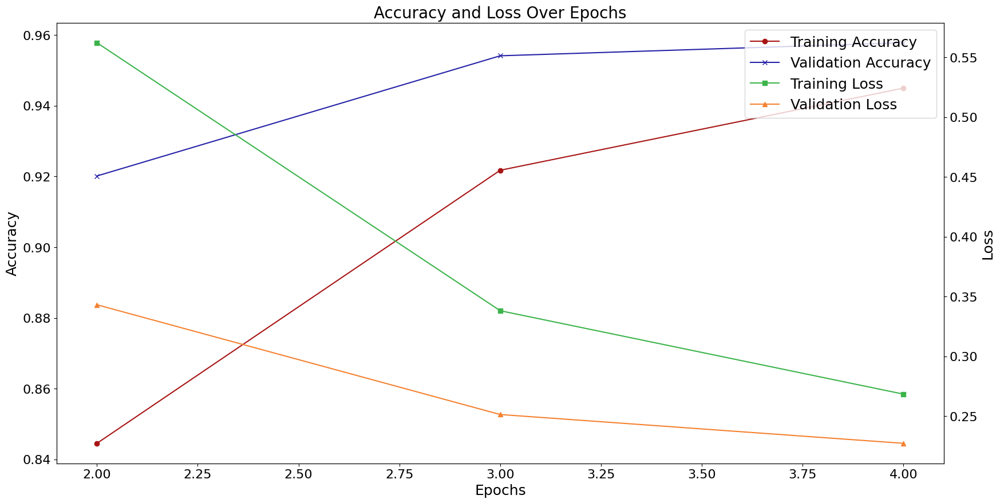

In [ ]:
accuracy_loss_plot(history_fine, 'with_model_tuning',model_config="fine_tune")

In [ ]:
accu += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

In [ ]:
print(history_fine.epoch)

[2, 3, 4]


In [ ]:
import matplotlib.pyplot as plt

def plot_training_history(acc, val_acc, loss, val_loss, initial_epochs, figsize=(10, 8), title_fontsize=14, label_fontsize=12):
    plt.figure(figsize=figsize)
    
    plt.subplot(2, 1, 1)
    plt.plot(acc, label='Training Accuracy', linewidth=2)
    plt.plot(val_acc, label='Validation Accuracy', linewidth=2)
    plt.ylim([0.8, 1])
    plt.plot([initial_epochs, initial_epochs], plt.ylim(), label='Start Fine Tuning', linestyle='--', color='green')
    plt.legend(loc='lower right', fontsize=label_fontsize)
    plt.title('Training and Validation Accuracy', fontsize=title_fontsize)
    plt.xlabel('Epoch', fontsize=label_fontsize)
    plt.ylabel('Accuracy', fontsize=label_fontsize)
    
    plt.subplot(2, 1, 2)
    plt.plot(loss, label='Training Loss', linewidth=2)
    plt.plot(val_loss, label='Validation Loss', linewidth=2)
    plt.ylim([0, 1.0])
    plt.plot([initial_epochs, initial_epochs], plt.ylim(), label='Start Fine Tuning', linestyle='--', color='green')
    plt.legend(loc='upper right', fontsize=label_fontsize)
    plt.title('Training and Validation Loss', fontsize=title_fontsize)
    plt.xlabel('Epoch', fontsize=label_fontsize)
    plt.ylabel('Loss', fontsize=label_fontsize)
    
    plt.tight_layout()
    plt.show()


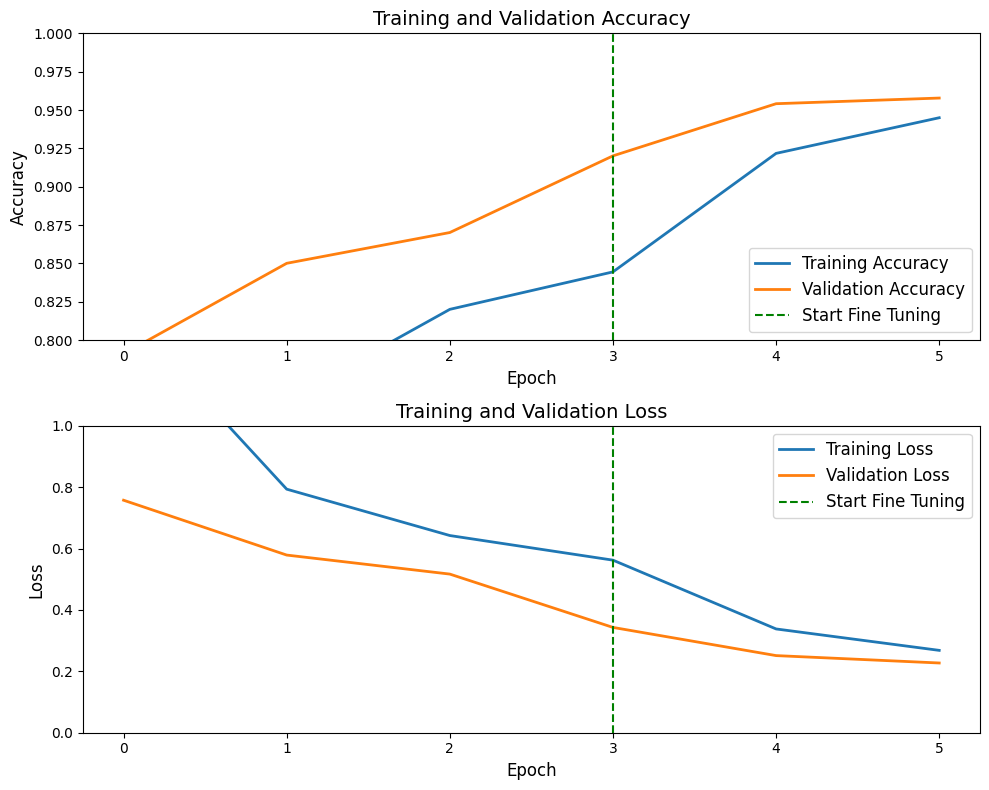

In [ ]:
plot_training_history(accu, val_acc, loss, val_loss, initial_epochs)

### Evaluation and prediction

Finally you can verify the performance of the model on new data using test set.

In [ ]:
accuracy = model.evaluate(test_dataset)
print('Test accuracy :', accuracy[1])

38/38 [==============================] - 18s 470ms/step - loss: 1.2366 - accuracy: 0.6583 - top_k_categorical_accuracy: 0.8100
Test accuracy : 0.6583333611488342


In [ ]:
# Get the predictions for the test data
predictions = model.predict(test_dataset)

38/38 [==============================] - 21s 433ms/step


Predicted Classes:
 [0 4 4 4 4 4 4 4 4 4 0 4 4 1 4 3 3 3 3 3 4 4 0 4 0 0 4 0 4 4 4 4 4 1 0 4 0
 5 1 4 4 0 0 0 4 0 4 4 4 4 4 4 0 0 4 4 0 0 0 5 5 4 4 0 5 4 0 0 0 3 0 0 0 0
 0 0 0 0 4 0 0 5 5 0 4 4 4 0 4 4 0 4 5 0 4 4 4 4 4 4 4 5 5 5 5 4 5 4 4 0 4
 4 4 4 4 4 4 4 4 4 4 4 5 0 4 0 5 2 0 0 0 0 0 5 3 0 0 3 1 5 4 4 0 0 4 4 4 4
 4 4 4 0 5 3 4 0 5 0 4 0 0 5 4 4 0 0 0 4 0 2 0 0 0 4 0 5 4 3 5 5 5 1 5 1 5
 5 4 2 4 0 1 4 1 3 1 4 5 5 5 4 2 2 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2 2 2 2 2 2
 0 0 2 3 1 0 2 3 2 1 2 3 2 2 2 2 2 2 1 5 3 3 0 0 5 5 0 0 2 3 2 2 3 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 2 4 4 2 2 4 4 3 3 3 3 2 4 3 2 3 3 2 2 2 2 2
 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 3 4 4 4 4 0 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 5 4 4 4 4
 4 4 

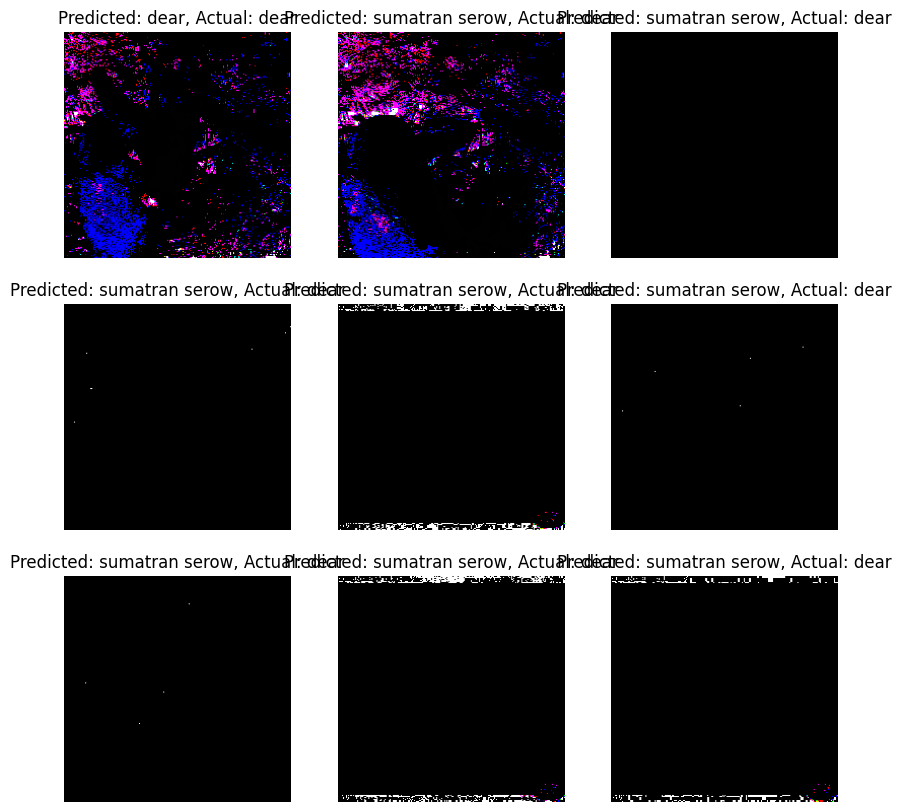

In [ ]:

# Apply argmax to get the predicted class
predicted_classes = tf.argmax(predictions, axis=1)


print('Predicted Classes:\n', predicted_classes.numpy())
print('True Classes:\n', np.array(true_labels))

plt.figure(figsize=(10, 10))
for images, labels in test_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(f'Predicted: {class_labels[predicted_classes[i]]}, Actual: {class_labels[labels[i]]}')
    plt.axis("off")


In [ ]:

from sklearn.metrics import f1_score, precision_score, recall_score,accuracy_score


acc = accuracy_score(true_labels, predicted_classes)
precision = precision_score(true_labels, predicted_classes, average='macro')
recall = recall_score(true_labels, predicted_classes, average='macro')
f1 = f1_score(true_labels, predicted_classes, average='macro')

metrics_path = os.path.join(os.getcwd(), './metrics/metric_values')
curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
filename = f'{model_name}-metrics-{format(curr_datetime)}.txt'

if not os.path.exists(metrics_path):
    os.makedirs(metrics_path)

file_path = os.path.join(metrics_path, filename)
with open(file_path, 'w') as file:
    file.write(f'Accuracy: {acc:.3f}\n')
    file.write(f'Precision: {precision:.3f}\n')
    file.write(f'Recall: {recall:.3f}\n')
    file.write(f'F1 Score: {f1:.3f}\n')
  
print(f'Accuracy: {acc:.3f}')
print(f'Precision: {precision:.3f}')
print(f'Recall: {recall:.3f}')
print(f'F1 Score: {f1:.3f}')

Accuracy: 0.658
Precision: 0.661
Recall: 0.658
F1 Score: 0.607


In [ ]:

from sklearn.metrics import confusion_matrix
import seaborn as sns

def getting_confusion_matrix(base_model_name, model_name):
    confusion_matrix_res = confusion_matrix(true_labels, predicted_classes)
    plt.figure(figsize=(12, 10))  # Adjust the figure size for better visualization
    sns.heatmap(confusion_matrix_res, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels, annot_kws={"size": 12}, cbar=False)  # Increase font size for annotations and remove color bar

    plt.xlabel('Predicted', fontsize=14)  # Increase font size for x-axis label
    plt.ylabel('True', fontsize=14)  # Increase font size for y-axis label
    plt.title('Confusion Matrix', fontsize=16)  # Increase font size for title

    # Increase font size for class labels
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    confusion_matrix_path = os.path.join(os.getcwd(), f'./confusion_matrices/{model_name}/{base_model_name}')
    curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
    filename = f'{model_name}-confusion_matrix-{curr_datetime}.png'  # Removed unnecessary format() function

    if not os.path.exists(confusion_matrix_path):
        os.makedirs(confusion_matrix_path)

    # Save the plot to the specified folder
    save_path = os.path.join(confusion_matrix_path, filename)
    plt.savefig(save_path, bbox_inches='tight')




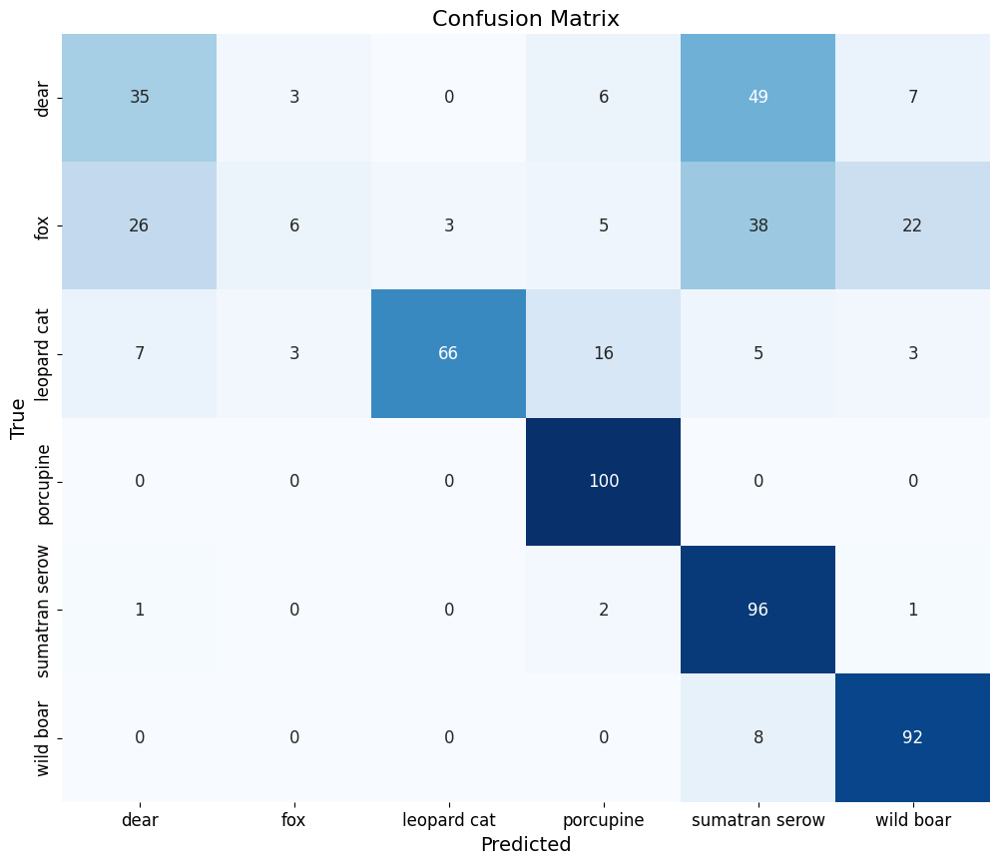

In [ ]:
base_model_name="MobilenetV2"
getting_confusion_matrix(base_model_name,model_name)

In [ ]:
from datetime import datetime
from itertools import cycle
from sklearn.calibration import label_binarize
from sklearn.metrics import auc, roc_curve

num_labels = 6

def get_ROC_AUC(y_pred, y_target):
    # Binarize the labels
    n_classes = num_labels
    true_labels_bin = label_binarize(y_target, classes=range(n_classes))
    predicted_labels_bin = label_binarize(y_pred, classes=range(n_classes))

    # Compute ROC curve and AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(true_labels_bin[:, i], predicted_labels_bin[:, i], drop_intermediate=True)
        roc_auc[i] = auc(fpr[i], tpr[i])

    return fpr, tpr, roc_auc

def save_ROC_AUC(fpr, tpr, roc_auc):
    n_classes = num_labels

    # Plot ROC curves for each class
    plt.figure(figsize=(12, 12))

    hex_colors = ['#FF0000', '#00FF00', '#0000FF', '#FFFF00', '#FF00FF', '#00FFFF']
    colors = cycle(hex_colors)

    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'{class_labels[i]} (AUC = {roc_auc[i]:.3f})')

    plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--')  # Diagonal line for reference
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=14)
    plt.ylabel('True Positive Rate', fontsize=14)
    plt.title('Receiver Operating Characteristic (ROC) Curve and AUC', fontsize=16)
    plt.legend(loc='lower right', fontsize=12)
    plt.xticks(fontsize=12)  # Increase font size of x-axis ticks
    plt.yticks(fontsize=12)  # Increase font size of y-axis ticks

    roc_auc_path = os.path.join(os.getcwd(), f'./ROC_Curves/{base_model_name}')
    curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
    filename = f'{model_name.lower()}-roc_auc-{curr_datetime}.png'

    if not os.path.exists(roc_auc_path):
        os.makedirs(roc_auc_path)

    # Save the plot to the specified folder
    save_path = os.path.join(roc_auc_path, filename)
    plt.savefig(save_path, bbox_inches='tight')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(true_labels, predicted_classes.numpy(),target_names = class_labels))

                precision    recall  f1-score   support

          dear       0.51      0.35      0.41       100
           fox       0.50      0.06      0.11       100
   leopard cat       0.96      0.66      0.78       100
     porcupine       0.78      1.00      0.87       100
sumatran serow       0.49      0.96      0.65       100
     wild boar       0.74      0.92      0.82       100

      accuracy                           0.66       600
     macro avg       0.66      0.66      0.61       600
  weighted avg       0.66      0.66      0.61       600



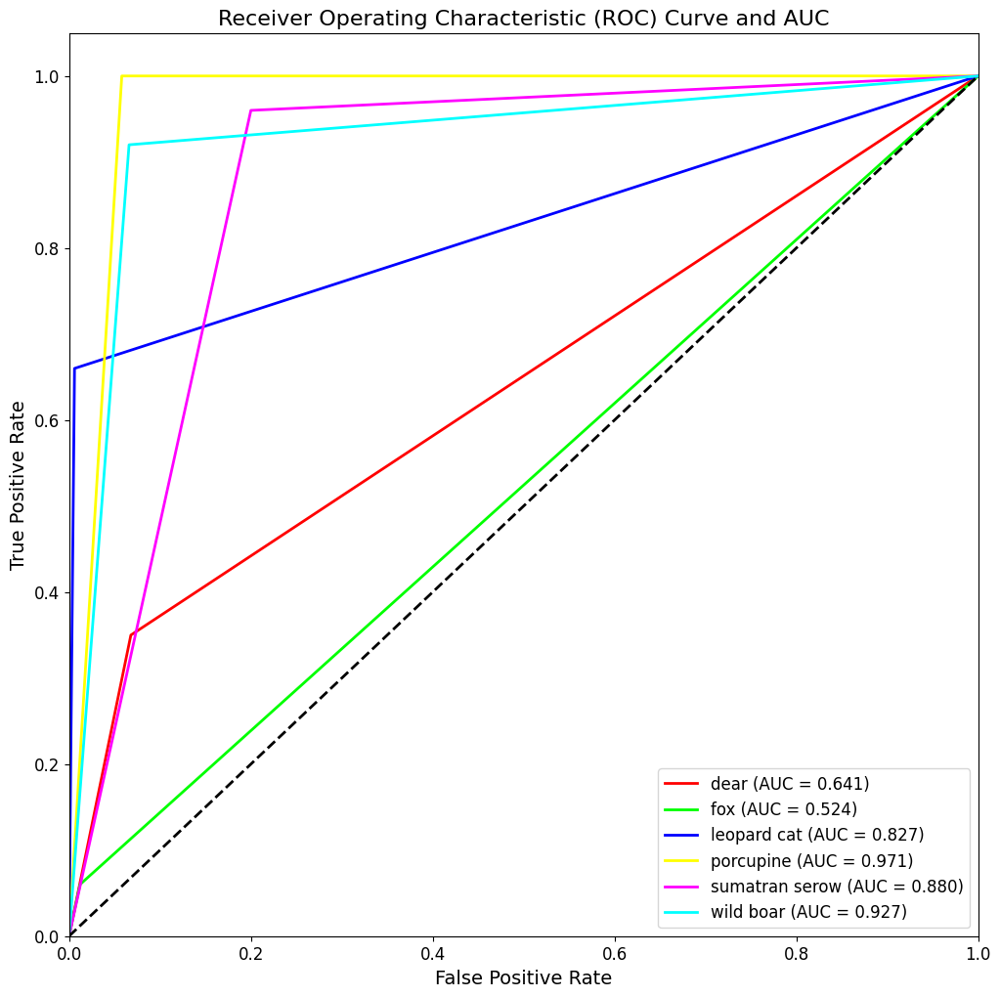

In [ ]:
fpr, tpr, roc_auc = get_ROC_AUC(predicted_classes, true_labels)
save_ROC_AUC(fpr, tpr, roc_auc)

In [ ]:
#save weights of the trained model to the specified folder


models_dir = os.path.join( f'./Saved_OPTIMIZED_MODELS/{base_model_name}')
model_dir = os.path.join(models_dir, model_name)
model_save_dir = os.path.join(model_dir, model_name)
model_save_path = os.path.join(model_save_dir, model_name + "_base.h5")


if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)
model.save_weights(os.path.join(model_save_dir, model_name + "_weights.h5"))

In [ ]:
#save model to the specified folder
model_file_path = os.path.join(model_save_dir, model_name + ".h5")
model.save(model_file_path)
model_size_bytes = os.path.getsize(model_file_path)
model_size_megabytes = model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes

print("Model size: {:.2f} megabytes".format(model_size_megabytes))

Model size: 17.16 megabytes


In [ ]:
def save_model(model,model_name):
    # Create a directory for optimized saved models if it doesn't exist
    os.makedirs("optimized_saved_models", exist_ok=True)
    
    # Save the entire model as a SavedModel with the specified name
    model.save(f'optimized_saved_models/{model_name}')

save_model(model, model_name)

INFO:tensorflow:Assets written to: optimized_saved_models/MobileNetV2_With_fineTune_Custom_Classification\assets


INFO:tensorflow:Assets written to: optimized_saved_models/MobileNetV2_With_fineTune_Custom_Classification\assets


In [ ]:
get_flops(model,BATCH_SIZE)
9802330624

9802330624

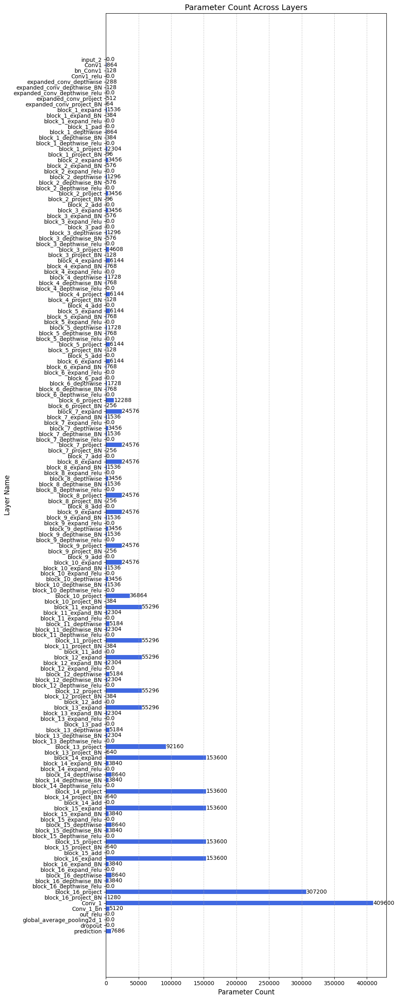

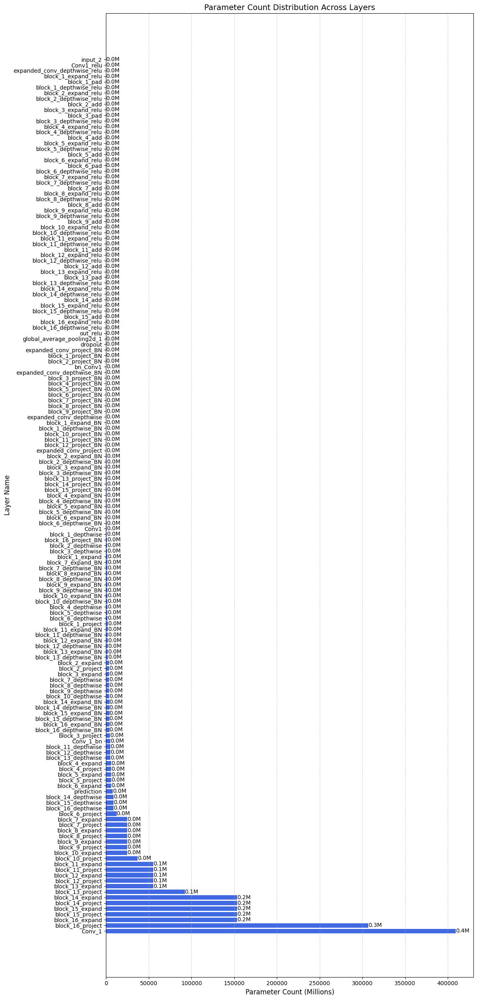

Total Parameters: 2265670.0


In [ ]:
plot_parameter_table(model)
plot_parameter_count(model)
print_total_parameter_count(model)



## Prune and fine-tune the model to 50% sparsity

Apply the prune_low_magnitude() API to achieve the pruned model that is to be clustered in the next step.

In [ ]:
# Print layer index and name
for layer_index, layer in enumerate(model.layers):
    print(f"Layer {layer_index}: {layer.name}")

Layer 0: input_2
Layer 1: Conv1
Layer 2: bn_Conv1
Layer 3: Conv1_relu
Layer 4: expanded_conv_depthwise
Layer 5: expanded_conv_depthwise_BN
Layer 6: expanded_conv_depthwise_relu
Layer 7: expanded_conv_project
Layer 8: expanded_conv_project_BN
Layer 9: block_1_expand
Layer 10: block_1_expand_BN
Layer 11: block_1_expand_relu
Layer 12: block_1_pad
Layer 13: block_1_depthwise
Layer 14: block_1_depthwise_BN
Layer 15: block_1_depthwise_relu
Layer 16: block_1_project
Layer 17: block_1_project_BN
Layer 18: block_2_expand
Layer 19: block_2_expand_BN
Layer 20: block_2_expand_relu
Layer 21: block_2_depthwise
Layer 22: block_2_depthwise_BN
Layer 23: block_2_depthwise_relu
Layer 24: block_2_project
Layer 25: block_2_project_BN
Layer 26: block_2_add
Layer 27: block_3_expand
Layer 28: block_3_expand_BN
Layer 29: block_3_expand_relu
Layer 30: block_3_pad
Layer 31: block_3_depthwise
Layer 32: block_3_depthwise_BN
Layer 33: block_3_depthwise_relu
Layer 34: block_3_project
Layer 35: block_3_project_BN
Lay

In [ ]:
pruning_last_layers=[
    "block_10_project",
    "block_10_expand",
    "block_11_project",
    "block_11_expand",
    "block_12_expand",
    "block_12_project",
    "block_13_expand",
    "block_13_project",
    "block_14_expand",
    "block_14_project",
    "block_15_expand",
    "block_15_project",
    "block_16_expand",
    "block_16_project",
    "Conv_1",
    "prediction"
]

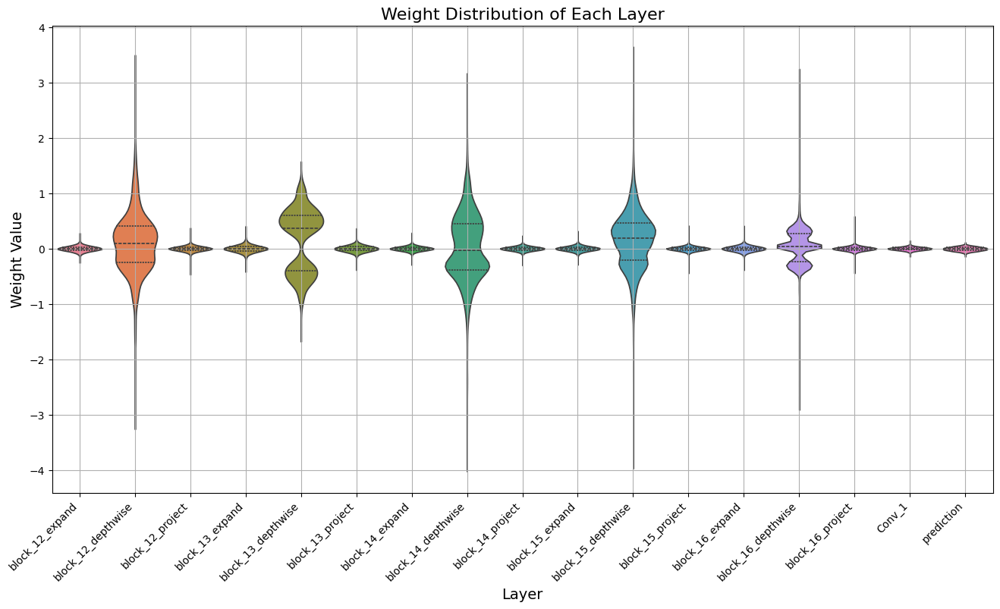

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_weight_distribution(pruning_last_layers, model):
    # Dictionary to store weight distributions for each layer
    weight_distributions = {}

    # Sample weights (replace with actual weights from your model)
    for layer_name in pruning_last_layers:
        # Assuming you have access to the weights of each layer in your model
        layer_weights = model.get_layer(layer_name).get_weights()[0]
        weight_distributions[layer_name] = layer_weights.flatten()

    # Custom color palette
    custom_palette = sns.color_palette("husl", n_colors=len(pruning_last_layers))

    # Plot weight distribution of selected layers
    plt.figure(figsize=(16, 8))
    data = []
    labels = []
    for i, (layer_name, weights) in enumerate(weight_distributions.items()):
        data.append(weights)
        labels.append(layer_name)

    sns.violinplot(data=data, palette=custom_palette, inner="quartile")
    plt.title('Weight Distribution of Each Layer', fontsize=16)
    plt.xlabel('Layer', fontsize=14)
    plt.ylabel('Weight Value', fontsize=14)
    plt.xticks(range(len(labels)), labels, rotation=45, ha='right')
    plt.grid(True)
    plt.show()

plot_weight_distribution(pruning_last_layers, model)


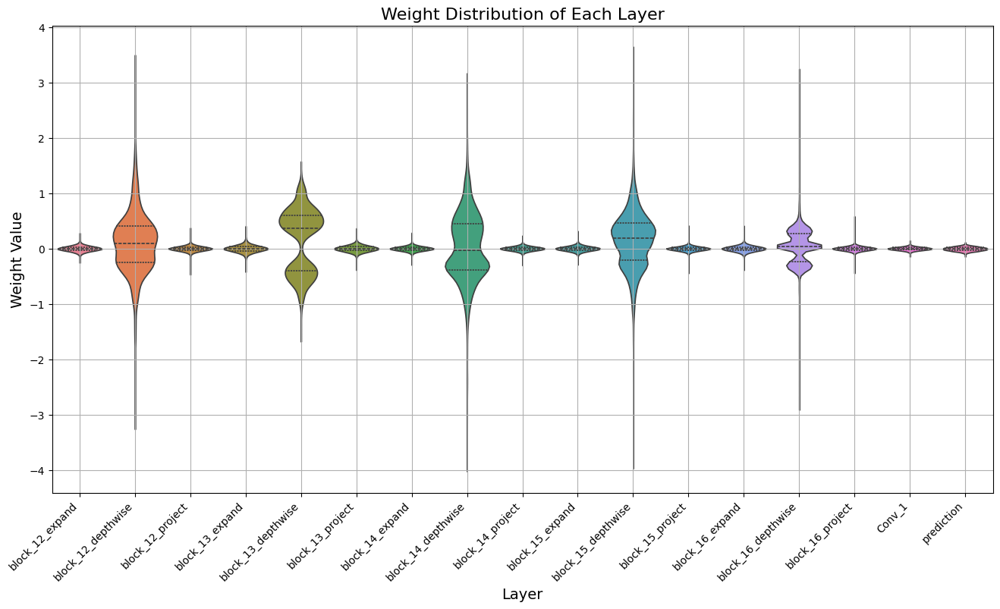

In [ ]:
plot_weight_distribution(pruning_last_layers, model)


## Benefits of Iterative Low Magnitude Pruning Approach

1. **Performance Retention**: 
   - Gradual sparsity increase allows the model to adapt progressively.
   - Helps mitigate abrupt accuracy degradation typical of aggressive pruning.

2. **Convergence Improvement**:
   - Incremental pruning fosters smoother training trajectories.
   - Enables faster convergence by adapting weights gradually.

3. **Reduced Overhead**:
   - Distribution of computational resources more evenly.
   - Lower initial sparsity eases computational burden.

4. **Flexibility and Control**:
   - Fine-grained control over pruning process.
   - Tailorable sparsity schedule and update frequency for optimization.


In [ ]:
num_iterations_per_epoch = len(train_dataset)
print(num_iterations_per_epoch)
end_epoch = 8
end_step =  (num_iterations_per_epoch) * end_epoch
print(end_step)

1375
4125


In [ ]:
# Helper function uses `prune_low_magnitude` to make only the 
# Dense layers train with pruning.
import tensorflow_model_optimization as tfmot
prune_low_magnitude = tfmot.sparsity.keras.prune_low_magnitude

pruning_params = {
      'pruning_schedule': tfmot.sparsity.keras.PolynomialDecay(initial_sparsity=0.10,
                                                               final_sparsity=0.50,
                                                               begin_step=0,
                                                               end_step=end_step)
}

def apply_pruning_to_last_layers(layer):
    if layer.name in pruning_last_layers :
      print(layer.name)
      return tfmot.sparsity.keras.prune_low_magnitude(layer,**pruning_params)
    return layer

# Use `keras.models.clone_model` to apply `apply_pruning_to_selected layers` 
# to the layers of the model.
pruned_model = tf.keras.models.clone_model(
    model,
    clone_function=apply_pruning_to_last_layers,
)
callbacks = [
  tfmot.sparsity.keras.UpdatePruningStep()
]

block_12_expand
block_12_depthwise
block_12_project
block_13_expand
block_13_depthwise
block_13_project
block_14_expand
block_14_depthwise
block_14_project
block_15_expand
block_15_depthwise
block_15_project
block_16_expand
block_16_depthwise
block_16_project
Conv_1
prediction


In [ ]:
pruned_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[1][0]']                  
                                )                                                             

In [ ]:

prune_low_magnitude = tfmot.sparsity.keras.prune_low_magnitude



In [ ]:
pruned_model.compile(loss='sparse_categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
              metrics=['accuracy', 'top_k_categorical_accuracy'])

In [ ]:
fine_tune_pruning_epochs = end_epoch
total_epochs =  initial_epochs + fine_tune_epochs + fine_tune_pruning_epochs
history_fine_tune_pruning_ = pruned_model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch=history_fine.epoch[-1],
                         validation_data=validation_dataset,callbacks=callbacks)


Epoch 5/8
1375/1375 [==============================] - 1420s 1s/step - loss: 0.2308 - accuracy: 0.9567 - top_k_categorical_accuracy: 0.7557 - val_loss: 0.3027 - val_accuracy: 0.9230 - val_top_k_categorical_accuracy: 0.8620
Epoch 6/8
1375/1375 [==============================] - 1161s 841ms/step - loss: 0.2127 - accuracy: 0.9615 - top_k_categorical_accuracy: 0.7593 - val_loss: 0.3873 - val_accuracy: 0.8972 - val_top_k_categorical_accuracy: 0.9799
Epoch 7/8
1375/1375 [==============================] - 1732s 1s/step - loss: 0.1951 - accuracy: 0.9662 - top_k_categorical_accuracy: 0.7725 - val_loss: 0.1980 - val_accuracy: 0.9631 - val_top_k_categorical_accuracy: 0.8530
Epoch 8/8
1375/1375 [==============================] - 1108s 802ms/step - loss: 0.1751 - accuracy: 0.9709 - top_k_categorical_accuracy: 0.7733 - val_loss: 0.1782 - val_accuracy: 0.9652 - val_top_k_categorical_accuracy: 0.8333


In [ ]:
accuracy = pruned_model.evaluate(test_dataset)
print('Test accuracy :', accuracy[1])

38/38 [==============================] - 18s 441ms/step - loss: 1.1321 - accuracy: 0.6867 - top_k_categorical_accuracy: 0.8367
Test accuracy : 0.6866666674613953


In [ ]:
accuracy = pruned_model.evaluate(validation_dataset)

153/153 [==============================] - 62s 388ms/step - loss: 0.1782 - accuracy: 0.9652 - top_k_categorical_accuracy: 0.8333


In [ ]:
print("initial accuracy: {:.2f}".format(accuracy[1]))


initial accuracy: 0.97


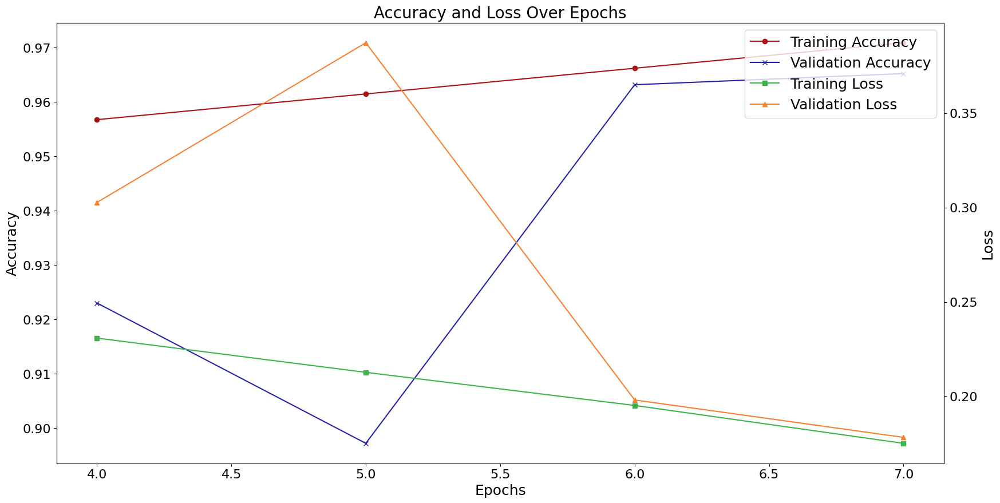

In [ ]:
accuracy_loss_plot(history_fine_tune_pruning_, 'Magnitude based Pruning','Magnitude based Pruning')

In [ ]:
accu += history_fine_tune_pruning_.history['accuracy']
val_acc += history_fine_tune_pruning_.history['val_accuracy']

loss += history_fine_tune_pruning_.history['loss']
val_loss += history_fine_tune_pruning_.history['val_loss']

In [ ]:

def plot_training_history(acc, val_acc, loss, val_loss, initial_epochs, fine_tune_epochs, figsize=(10, 8), title_fontsize=14, label_fontsize=12):
    plt.figure(figsize=figsize)  
    plt.subplot(2, 1, 1)
    plt.plot(acc, label='Training Accuracy', linewidth=2)
    plt.plot(val_acc, label='Validation Accuracy', linewidth=2)
    plt.ylim([0.8, 1])
    plt.plot([initial_epochs-1, initial_epochs-1], plt.ylim(), label='Start Fine Tuning', linestyle='--', color='green')
    plt.plot([fine_tune_epochs+initial_epochs-1, fine_tune_epochs+initial_epochs-1], plt.ylim(), label='Start Low Magnitude Pruning', linestyle='--', color='purple')
    plt.legend(loc='lower right', fontsize=label_fontsize)
    plt.title('Training and Validation Accuracy', fontsize=title_fontsize)
    plt.xlabel('Epoch', fontsize=label_fontsize)
    plt.ylabel('Accuracy', fontsize=label_fontsize)
    
    plt.subplot(2, 1, 2)
    plt.plot(loss, label='Training Loss', linewidth=2)
    plt.plot(val_loss, label='Validation Loss', linewidth=2)
    plt.ylim([0, max(max(loss), max(val_loss))])
    plt.plot([initial_epochs-1, initial_epochs-1], plt.ylim(), label='Start Fine Tuning', linestyle='--', color='green')
    plt.plot([fine_tune_epochs+initial_epochs-1, fine_tune_epochs+initial_epochs], plt.ylim(), label='Start Low Magnitude Pruning', linestyle='--', color='purple')
    plt.legend(loc='upper right', fontsize=label_fontsize)
    plt.title('Training and Validation Loss', fontsize=title_fontsize)
    plt.xlabel('Epoch', fontsize=label_fontsize)
    plt.ylabel('Loss', fontsize=label_fontsize)
    
    plt.tight_layout()
    plt.show()


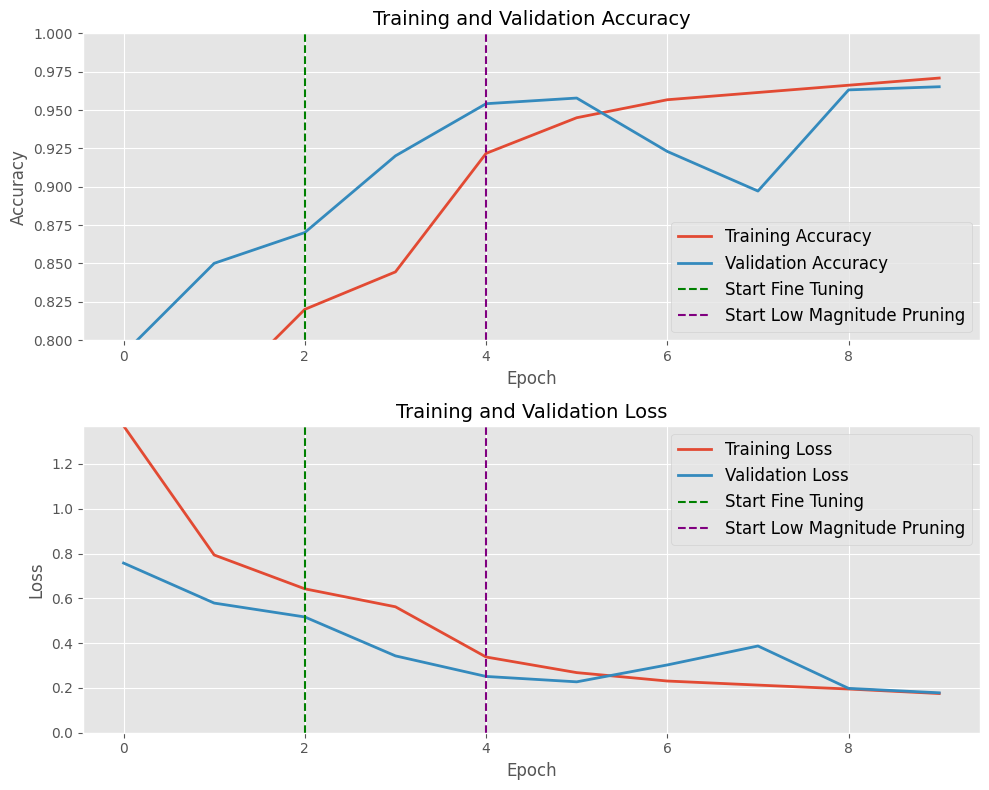

In [ ]:
plot_training_history(accu, val_acc, loss, val_loss, initial_epochs,fine_tune_epochs)

In [ ]:
model_name="Pruned_Model"
def save_model(model,model_name):
    # Create a directory for optimized saved models if it doesn't exist
    os.makedirs("optimized_saved_models", exist_ok=True)
    
    # Save the entire model as a SavedModel with the specified name
    model.save(f'optimized_saved_models/{model_name}')

save_model(pruned_model, model_name)

INFO:tensorflow:Assets written to: optimized_saved_models/Pruned_Model\assets


INFO:tensorflow:Assets written to: optimized_saved_models/Pruned_Model\assets


In [ ]:
#save weights of the trained model to the specified folder


models_dir = os.path.join( f'./Saved_OPTIMIZED_MODELS/{base_model_name}')
model_dir = os.path.join(models_dir, model_name)
model_save_dir = os.path.join(model_dir, model_name)
model_save_path = os.path.join(model_save_dir, model_name + "_base.h5")


if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)
pruned_model.save_weights(os.path.join(model_save_dir, model_name + "_weights.h5"))

In [ ]:
#save model to the specified folder
model_file_path = os.path.join(model_save_dir, model_name + ".h5")
pruned_model.save(model_file_path)
model_size_bytes = os.path.getsize(model_file_path)
model_size_megabytes = model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes

print("Model size: {:.2f} megabytes".format(model_size_megabytes))

Model size: 31.81 megabytes


Evaluation and Prediction

In [ ]:
accuracy = pruned_model.evaluate(test_dataset)
print('Test accuracy :', accuracy[1])

38/38 [==============================] - 41s 1s/step - loss: 1.1321 - accuracy: 0.6867 - top_k_categorical_accuracy: 0.8367
Test accuracy : 0.6866666674613953


In [ ]:
predictions = pruned_model.predict(test_dataset)


38/38 [==============================] - 48s 1s/step


Predicted Classes:
 [0 4 4 4 4 4 4 4 4 4 0 4 4 1 4 1 1 3 4 3 0 4 0 0 0 0 4 0 1 4 1 1 1 1 0 4 0
 4 1 4 1 0 4 0 4 0 4 4 4 4 4 4 0 4 4 0 0 0 4 4 5 4 4 0 4 4 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 4 0 0 0 4 4 4 5 4 4 0 4 5 5 4 4 4 4 4 4 4 5 4 5 5 4 5 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 0 0 1 5 2 0 0 1 4 0 5 4 2 0 1 2 5 1 0 0 0 4 1 4 4
 4 1 1 0 4 4 4 4 4 0 4 0 0 0 4 4 0 0 0 0 0 0 0 0 0 4 0 0 4 4 5 5 1 1 4 1 4
 4 4 2 4 0 1 4 1 1 1 4 5 5 1 4 2 2 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2 2 2 2 2 2
 0 2 2 2 0 0 2 3 2 2 2 3 2 2 2 2 2 2 0 5 3 3 5 5 5 5 5 5 2 3 2 2 3 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 5 2 2 2 4 3 3 3 2 2 0 2 2 2 2 2 2 3 2 2
 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 

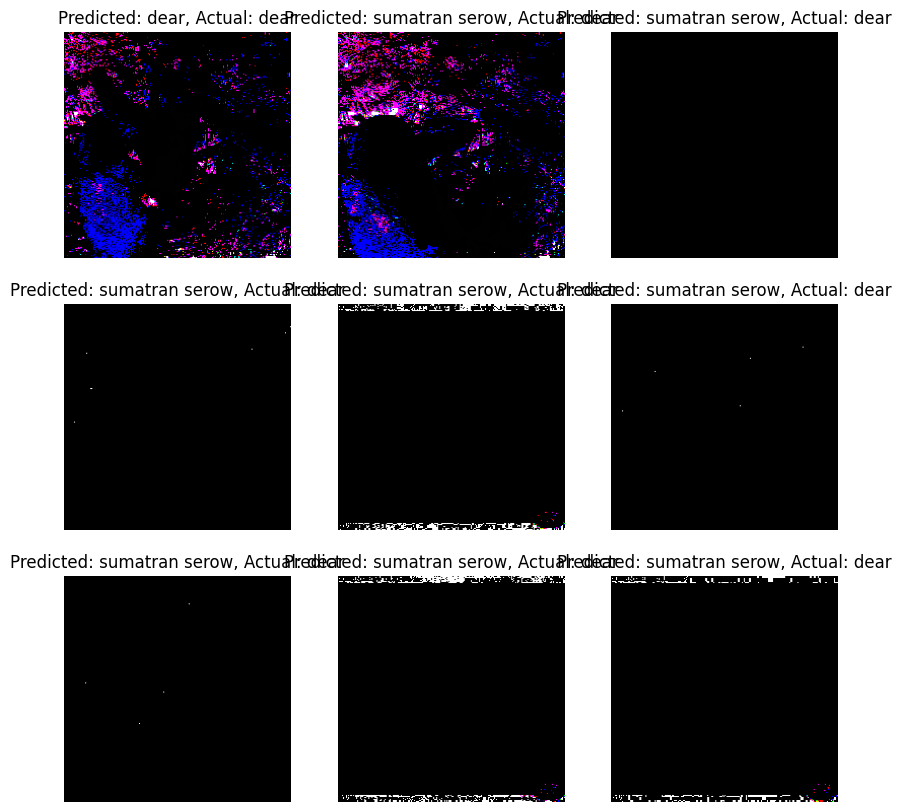

In [ ]:

# Apply argmax to get the predicted class
predicted_classes = tf.argmax(predictions, axis=1)


print('Predicted Classes:\n', predicted_classes.numpy())
print('True Classes:\n', np.array(true_labels))

plt.figure(figsize=(10, 10))
for images, labels in test_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(f'Predicted: {class_labels[predicted_classes[i]]}, Actual: {class_labels[labels[i]]}')
    plt.axis("off")


In [ ]:

from sklearn.metrics import f1_score, precision_score, recall_score,accuracy_score


acc = accuracy_score(true_labels, predicted_classes)
precision = precision_score(true_labels, predicted_classes, average='macro')
recall = recall_score(true_labels, predicted_classes, average='macro')
f1 = f1_score(true_labels, predicted_classes, average='macro')

metrics_path = os.path.join(os.getcwd(), './metrics/metric_values')
curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
filename = f'{model_name}-metrics-{format(curr_datetime)}.txt'

if not os.path.exists(metrics_path):
    os.makedirs(metrics_path)

file_path = os.path.join(metrics_path, filename)
with open(file_path, 'w') as file:
    file.write(f'Accuracy: {acc:.3f}\n')
    file.write(f'Precision: {precision:.3f}\n')
    file.write(f'Recall: {recall:.3f}\n')
    file.write(f'F1 Score: {f1:.3f}\n')
  
print(f'Accuracy: {acc:.3f}')
print(f'Precision: {precision:.3f}')
print(f'Recall: {recall:.3f}')
print(f'F1 Score: {f1:.3f}')

Accuracy: 0.687
Precision: 0.706
Recall: 0.687
F1 Score: 0.653


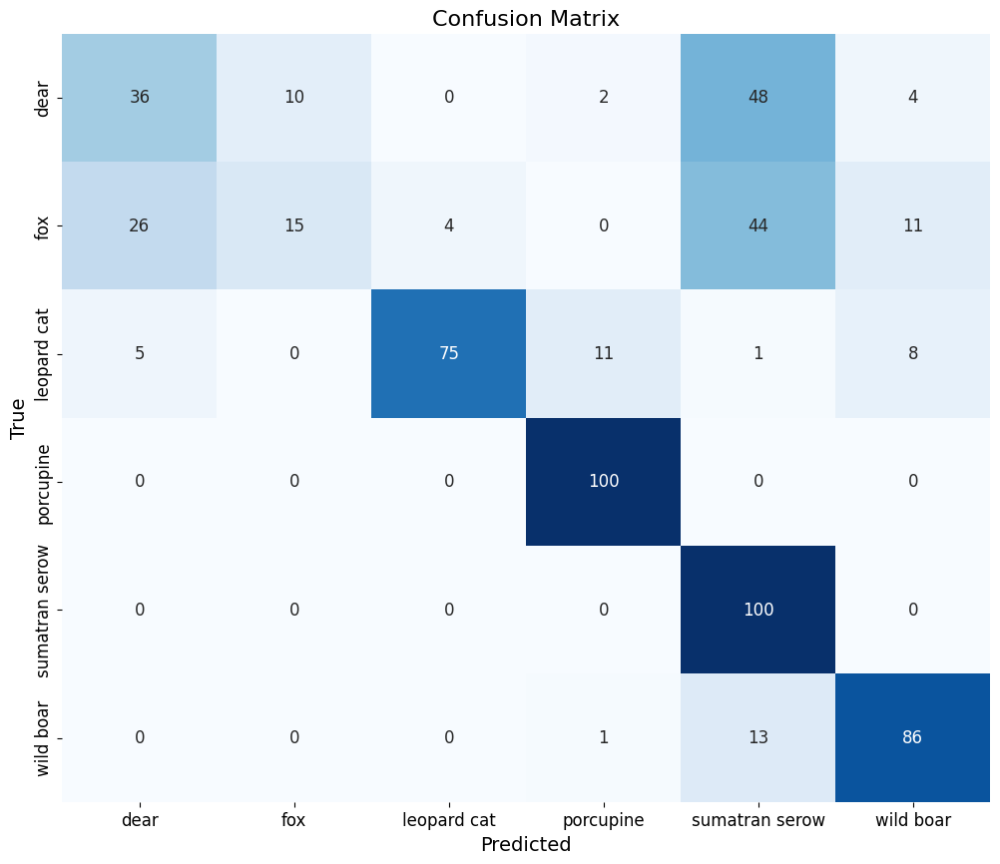

In [ ]:
base_model_name="MobilenetV2"
getting_confusion_matrix(base_model_name,model_name)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(true_labels, predicted_classes.numpy(),target_names = class_labels))

                precision    recall  f1-score   support

          dear       0.54      0.36      0.43       100
           fox       0.60      0.15      0.24       100
   leopard cat       0.95      0.75      0.84       100
     porcupine       0.88      1.00      0.93       100
sumatran serow       0.49      1.00      0.65       100
     wild boar       0.79      0.86      0.82       100

      accuracy                           0.69       600
     macro avg       0.71      0.69      0.65       600
  weighted avg       0.71      0.69      0.65       600



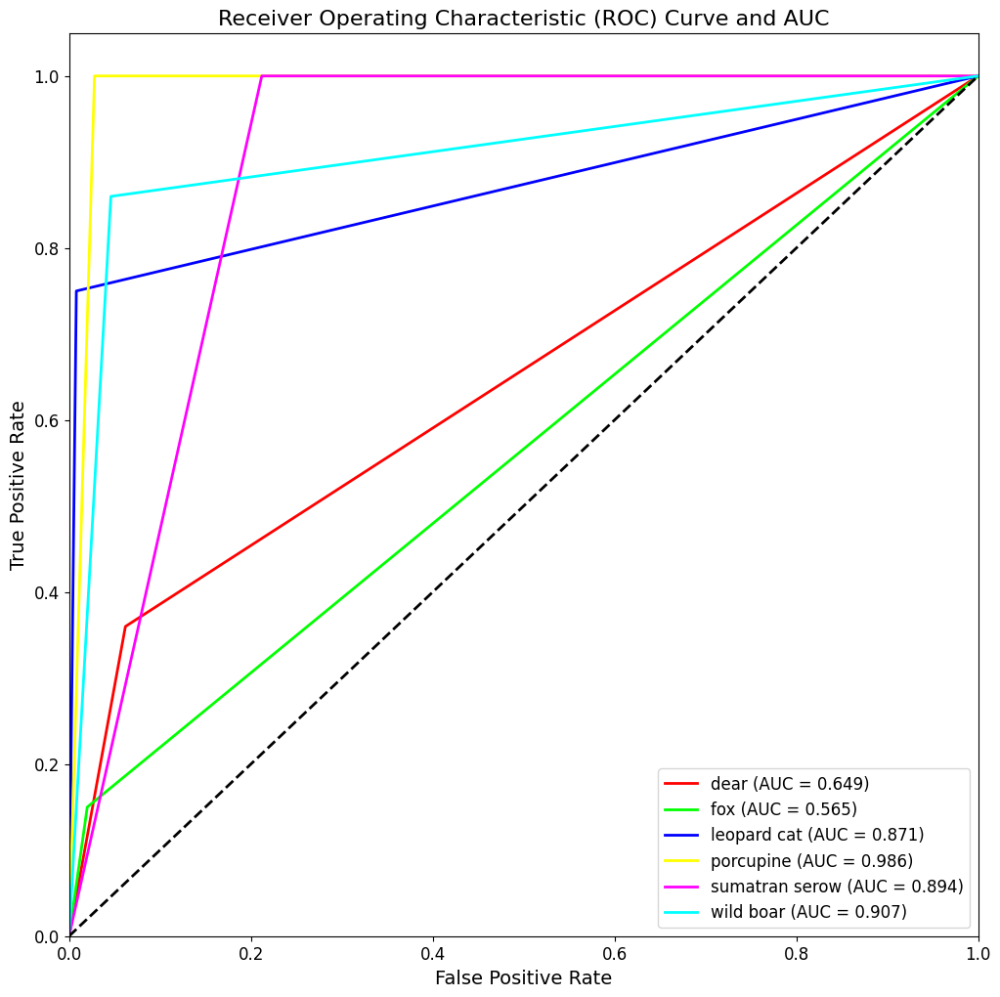

In [ ]:
fpr, tpr, roc_auc = get_ROC_AUC(predicted_classes, true_labels)
save_ROC_AUC(fpr, tpr, roc_auc)

Clustering Helper Functions:Before applying Sparsity Preserving Clustering

In [ ]:
def print_model_weights_sparsity(model):
    for layer in model.layers:
        if isinstance(layer, tf.keras.layers.Wrapper):
            weights = layer.trainable_weights
        else:
            weights = layer.weights
        for weight in weights:
            if "kernel" not in weight.name or "centroid" in weight.name:
                continue
            weight_size = weight.numpy().size
            zero_num = np.count_nonzero(weight == 0)
            print(
                f"{weight.name}: {zero_num/weight_size:.2%} sparsity ",
                f"({zero_num}/{weight_size})",
            )

def print_model_weight_clusters(model):
    for layer in model.layers:
        if isinstance(layer, tf.keras.layers.Wrapper):
            weights = layer.trainable_weights
        else:
            weights = layer.weights #returns a list containing all the weight tensors associated with that particular layer.
        for weight in weights:
            # ignore auxiliary quantization weights
            if "quantize_layer" in weight.name:
                continue
            if "kernel" in weight.name:
                unique_count = len(np.unique(weight))
                print(
                    f"{layer.name}/{weight.name}: {unique_count} clusters "
                )

Let's strip the pruning wrapper first, then check that the model kernels were correctly pruned.

In [ ]:
stripped_pruned_model = tfmot.sparsity.keras.strip_pruning(pruned_model)

print_model_weights_sparsity(stripped_pruned_model)

Conv1/kernel:0: 0.00% sparsity  (0/864)
expanded_conv_depthwise/depthwise_kernel:0: 0.00% sparsity  (0/288)
expanded_conv_project/kernel:0: 0.00% sparsity  (0/512)
block_1_expand/kernel:0: 0.00% sparsity  (0/1536)
block_1_depthwise/depthwise_kernel:0: 0.00% sparsity  (0/864)
block_1_project/kernel:0: 0.00% sparsity  (0/2304)
block_2_expand/kernel:0: 0.00% sparsity  (0/3456)
block_2_depthwise/depthwise_kernel:0: 0.00% sparsity  (0/1296)
block_2_project/kernel:0: 0.00% sparsity  (0/3456)
block_3_expand/kernel:0: 0.00% sparsity  (0/3456)
block_3_depthwise/depthwise_kernel:0: 0.00% sparsity  (0/1296)
block_3_project/kernel:0: 0.00% sparsity  (0/4608)
block_4_expand/kernel:0: 0.00% sparsity  (0/6144)
block_4_depthwise/depthwise_kernel:0: 0.00% sparsity  (0/1728)
block_4_project/kernel:0: 0.00% sparsity  (0/6144)
block_5_expand/kernel:0: 0.00% sparsity  (0/6144)
block_5_depthwise/depthwise_kernel:0: 0.00% sparsity  (0/1728)
block_5_project/kernel:0: 0.00% sparsity  (0/6144)
block_6_expand/ke

In [ ]:
model_name="Stripped_Pruned_Model"
def save_model(model,model_name):
    # Create a directory for optimized saved models if it doesn't exist
    os.makedirs("optimized_saved_models", exist_ok=True)
    # Save the entire model as a SavedModel with the specified name
    model.save(f'optimized_saved_models/{model_name}')

save_model(stripped_pruned_model, model_name)

INFO:tensorflow:Assets written to: optimized_saved_models/Stripped_Pruned_Model\assets


INFO:tensorflow:Assets written to: optimized_saved_models/Stripped_Pruned_Model\assets


In [ ]:
get_flops(stripped_pruned_model,BATCH_SIZE)

9802330624

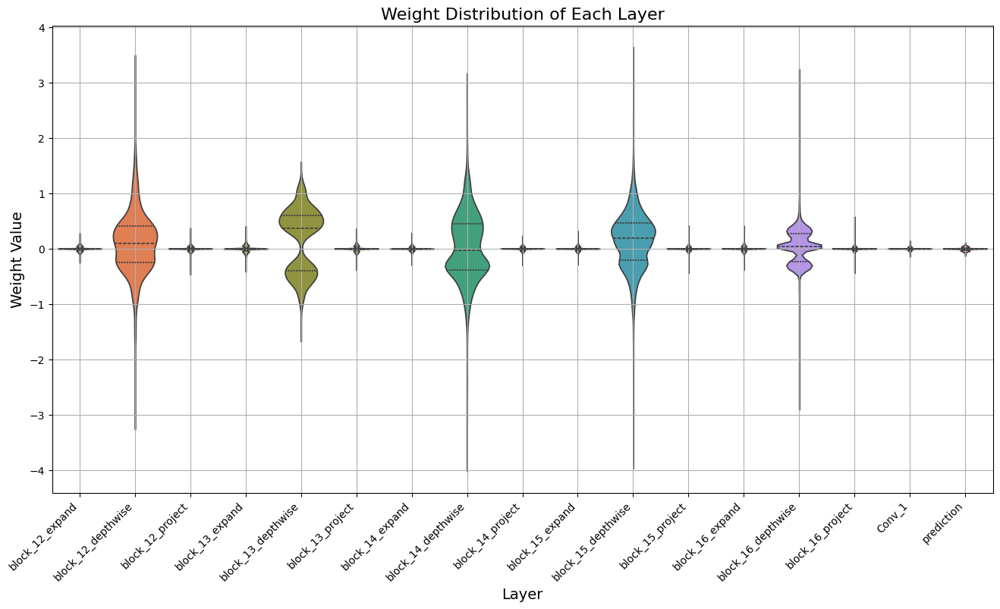

In [ ]:
plot_weight_distribution(pruning_last_layers, stripped_pruned_model)

In [ ]:
def net_flops(model, table=True):
    if (table == True):
        print('%25s | %16s | %16s | %16s | %16s | %6s | %6s' % (
            'Layer Name', 'Input Shape', 'Output Shape', 'Kernel Size', 'Filters', 'Strides', 'FLOPS'))
        print('-' * 170)

    t_flops = 0
    t_macc = 0

    for l in model.layers:

        o_shape, i_shape, strides, ks, filters = ['', '', ''], ['', '', ''], [1, 1], [0, 0], [0, 0]
        flops = 0
        macc = 0
        name = l.name

        factor = 1000000

        if ('InputLayer' in str(l)):
            i_shape = l.input.get_shape()[1:4].as_list()
            o_shape = i_shape

        if ('Reshape' in str(l)):
            i_shape = l.input.get_shape()[1:4].as_list()
            o_shape = l.output.get_shape()[1:4].as_list()

        if ('Add' in str(l) or 'Maximum' in str(l) or 'Concatenate' in str(l)):
            i_shape = l.input[0].get_shape()[1:4].as_list() + [len(l.input)]
            o_shape = l.output.get_shape()[1:4].as_list()
            flops = (len(l.input) - 1) * i_shape[0] * i_shape[1] * i_shape[2]

        if ('Average' in str(l) and 'pool' not in str(l)):
            i_shape = l.input[0].get_shape()[1:4].as_list() + [len(l.input)]
            o_shape = l.output.get_shape()[1:4].as_list()
            flops = len(l.input) * i_shape[0] * i_shape[1] * i_shape[2]

        if ('BatchNormalization' in str(l)):
            i_shape = l.input.get_shape()[1:4].as_list()
            o_shape = l.output.get_shape()[1:4].as_list()

            bflops = 1
            for i in range(len(i_shape)):
                bflops *= i_shape[i]
            flops /= factor

        if ('Activation' in str(l) or 'activation' in str(l)):
            i_shape = l.input.get_shape()[1:4].as_list()
            o_shape = l.output.get_shape()[1:4].as_list()
            bflops = 1
            for i in range(len(i_shape)):
                bflops *= i_shape[i]
            flops /= factor

        if ('pool' in str(l) and ('Global' not in str(l))):
            i_shape = l.input.get_shape()[1:4].as_list()
            strides = l.strides
            ks = l.pool_size
            flops = ((i_shape[0] / strides[0]) * (i_shape[1] / strides[1]) * (ks[0] * ks[1] * i_shape[2]))

        if ('Flatten' in str(l)):
            i_shape = l.input.shape[1:4].as_list()
            flops = 1
            out_vec = 1
            for i in range(len(i_shape)):
                flops *= i_shape[i]
                out_vec *= i_shape[i]
            o_shape = flops
            flops = 0

        if ('Dense' in str(l)):
            print(l.input)
            i_shape = l.input.shape[1:4].as_list()[0]
            if (i_shape == None):
                i_shape = out_vec

            o_shape = l.output.shape[1:4].as_list()
            flops = 2 * (o_shape[0] * i_shape)
            macc = flops / 2

        if ('Padding' in str(l)):
            flops = 0

        if (('Global' in str(l))):
            i_shape = l.input.get_shape()[1:4].as_list()
            flops = ((i_shape[0]) * (i_shape[1]) * (i_shape[2]))
            o_shape = [l.output.get_shape()[1:4].as_list(), 1, 1]
            out_vec = o_shape

        if ('Conv2D ' in str(l) and 'DepthwiseConv2D' not in str(l) and 'SeparableConv2D' not in str(l)):
            strides = l.strides
            ks = l.kernel_size
            filters = l.filters
            i_shape = l.input.get_shape()[1:4].as_list()
            o_shape = l.output.get_shape()[1:4].as_list()

            if (filters == None):
                filters = i_shape[2]

            flops = 2 * ((filters * ks[0] * ks[1] * i_shape[2]) * (
                    (i_shape[0] / strides[0]) * (i_shape[1] / strides[1])))
            macc = flops / 2

        if ('Conv2D ' in str(l) and 'DepthwiseConv2D' in str(l) and 'SeparableConv2D' not in str(l)):
            strides = l.strides
            ks = l.kernel_size
            filters = l.filters
            i_shape = l.input.get_shape()[1:4].as_list()
            o_shape = l.output.get_shape()[1:4].as_list()

            if (filters == None):
                filters = i_shape[2]

            flops = 2 * (
                    (ks[0] * ks[1] * i_shape[2]) * ((i_shape[0] / strides[0]) * (i_shape[1] / strides[1]))) 
            macc = flops / 2

        t_macc += macc

        t_flops += flops

        if (table == True):
            print('%25s | %16s | %16s | %16s | %16s | %6s | %5.4f' % (
                name, str(i_shape), str(o_shape), str(ks), str(filters), str(strides), flops))
    t_flops = t_flops / factor

    print('\nTotal FLOPS (x 10^6): %10.8f\n' % (t_flops))
    print('\nTotal MACCs: %10.8f\n' % (t_macc))

    return

In [ ]:
net_flops(model)

               Layer Name |      Input Shape |     Output Shape |      Kernel Size |          Filters | Strides |  FLOPS
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                  input_2 |    [224, 224, 3] |    [224, 224, 3] |           [0, 0] |           [0, 0] | [1, 1] | 0.0000
                    Conv1 |    [224, 224, 3] |   [112, 112, 32] |           (3, 3) |               32 | (2, 2) | 21676032.0000
                 bn_Conv1 |   [112, 112, 32] |   [112, 112, 32] |           [0, 0] |           [0, 0] | [1, 1] | 0.0000
               Conv1_relu |   [112, 112, 32] |   [112, 112, 32] |           [0, 0] |           [0, 0] | [1, 1] | 0.0000
  expanded_conv_depthwise |   [112, 112, 32] |   [112, 112, 32] |           (3, 3) |               32 | (1, 1) | 7225344.0000
expanded_conv_depthwise_BN |   [112, 112, 32] |   [112, 112, 32] |           [0, 0] |          

Once a model has been pruned to required sparsity, this method can be used to restore the original model with the sparse weights.The exported_model and the orig_model share the same structure.

That's the reason to similar FLOPs count 

In [ ]:
import tensorflow as tf

model_path = "./optimized_saved_models/MobileNetV2_With_fineTune_Custom_Classification"

# Load the model
try:
    model = tf.keras.models.load_model(model_path)
    print("Model loaded successfully.")
except Exception as e:
    print("Error loading the model:", str(e))

Model loaded successfully.


In [ ]:
# Measure time per layer in keras
import time

def time_per_layer(model):
    new_model = model

    times = np.zeros((len(model.layers), 2))
    inp = np.ones((224, 224, 3))

    for i in range(1, len(model.layers)):
        new_model = tf.keras.models.Model(inputs=[model.input], outputs=[model.layers[-i].output])

        # new_model.summary()
        new_model.predict(inp[None, :, :, :])

        t_s = time.time()
        new_model.predict(inp[None, :, :, :])
        t_e2 = time.time() - t_s

        times[i, 1] = t_e2
        del new_model

    for i in range(0, len(model.layers) - 1):
        times[i, 0] = abs(times[i + 1, 1] - times[i, 1])

    times[-1, 0] = times[-1, 1]


    return times


In [ ]:
times_fineTuned_pruned = time_per_layer(stripped_pruned_model)

1/1 [==============================] - 0s 80ms/step


1/1 [==============================] - 0s 88ms/step


1/1 [==============================] - 0s 37ms/step


In [ ]:
times_fineTuned = time_per_layer(model)

1/1 [==============================] - 0s 39ms/step


In [ ]:
def visualize_processing_time_per_layer(model, times, pruning_last_layers):
    plt.figure(figsize=(10, 6))  # Adjust figure size

    plt.style.use('ggplot')

    # Filter layers based on pruning_last_layers
    x = [layer for layer in model.layers if layer.name in pruning_last_layers]
    g = [times[model.layers.index(layer), 0] for layer in x]
    x_names = [layer.name for layer in x]

    x_pos = np.arange(len(x))

    plt.bar(x_names, g, color='#7ed6df')

    plt.xlabel("Layers", fontsize=12, fontweight='bold')  # Adjust font size and weight
    plt.ylabel("Processing Time", fontsize=12, fontweight='bold')  # Adjust font size and weight
    plt.title("Processing Time of Pruned Layers", fontsize=14, fontweight='bold')  # Adjust font size and weight

    plt.xticks(x_pos, x_names, rotation=90, fontsize=10, fontweight='bold')  # Adjust font size and weight for x ticks
    plt.yticks(fontsize=10, fontweight='bold')  # Adjust font size and weight for y ticks

    plt.grid(True)  # Add grid lines

    plt.tight_layout()  # Adjust layout for better spacing

    plt.show()



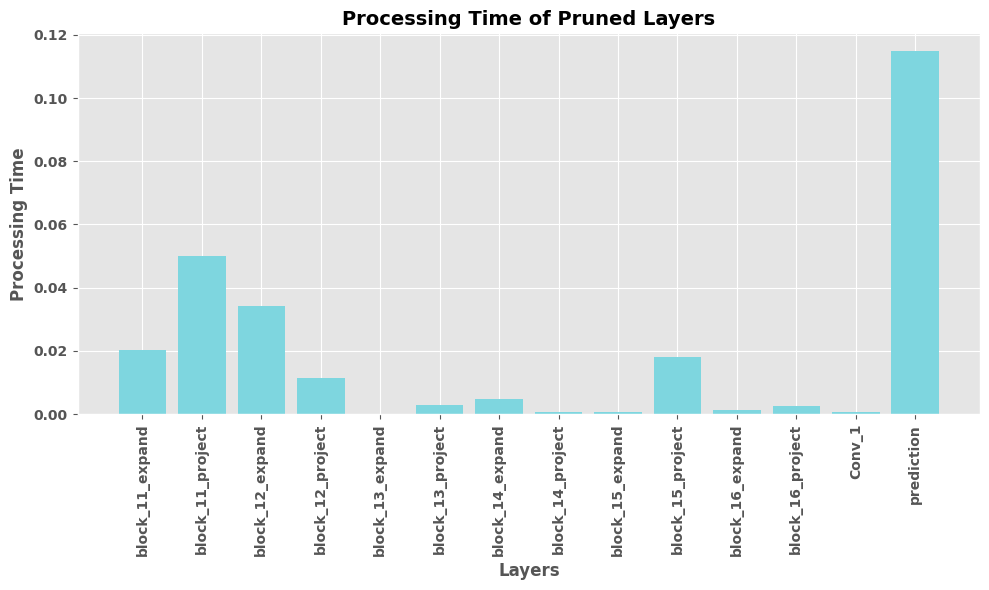

In [ ]:
visualize_processing_time_per_layer(model,times_fineTuned,pruning_last_layers)

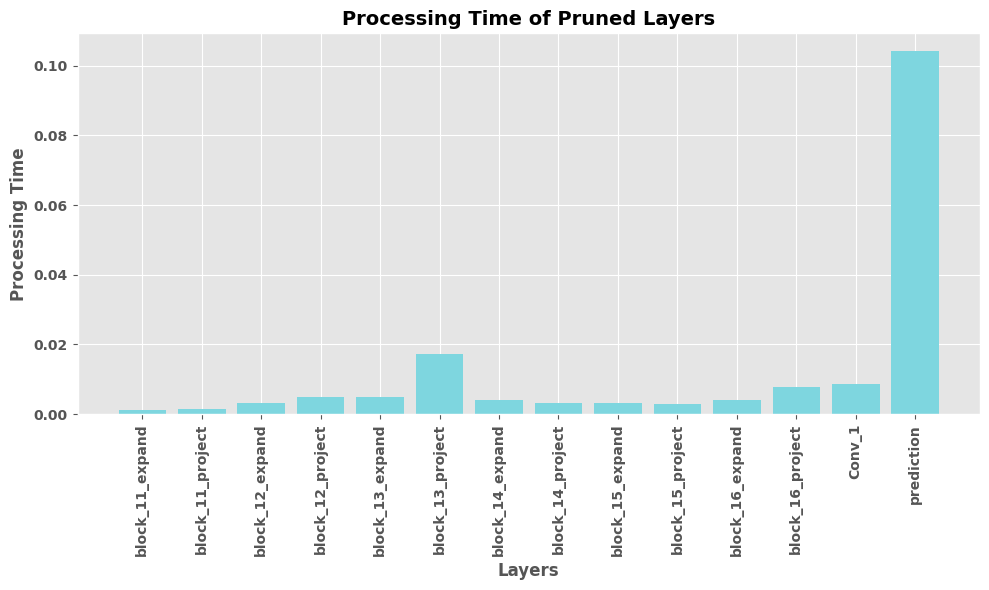

In [ ]:
visualize_processing_time_per_layer(model,times_fineTuned_pruned,pruning_last_layers)

## Apply sparsity preserving clustering and check its effect on model sparsity in both cases

In [ ]:
import tensorflow as tf

# Assuming "./optimized_saved_models/Stripped_Pruned_Model" is the correct path to your saved model
model_path = "./optimized_saved_models/Stripped_Pruned_Model"

# Load the model
try:
    stripped_pruned_model = tf.keras.models.load_model(model_path)
    print("Model loaded successfully.")
except Exception as e:
    print("Error loading the model:", str(e))

Model loaded successfully.


Next, apply sparsity preserving clustering on the pruned model and observe the number of clusters and check that the sparsity is preserved.

In [ ]:
def layer_has_enough_weights_to_cluster(layer, number_of_clusters):
    if not layer.trainable_weights:
        return False

    total_weights = sum(w.numpy().size for w in layer.trainable_weights)
    return total_weights >= number_of_clusters

### Novelties:

Combined Layer Metrics:
It calculates parameter density, filter similarity (average cosine similarity), and activation sparsity, providing a richer picture of potential redundancy within layers.

Ensemble-Based Selection (Implicit):
While not explicitly calculating an ensemble score, the `select_clustering_layers` function implicitly considers all metrics by returning the complete `layer_metrics` list. This allows for further analysis and filtering based on your specific needs (discussed later).

Visualization Function:
The `visualize_layer_metrics` function offers a clear visual representation of the layer metrics, aiding in understanding layer properties.

Mechanism and Improvement:

Layer Metric Calculation (Preserved):
The `compute_layer_metrics` function remains unchanged, accurately calculating the chosen metrics.

Layer Selection (Flexibility):
Instead of returning only top-ranked layers based on an ensemble score, `select_clustering_layers` returns all metrics for all layers that meet the pruning criteria (`pruning_last_layers`). This provides more flexibility for the experimental process.

Visualization and Selection Refinement (Opportunity):

Filtering Based on Visualizations:
Analyze the visualizations to identify layers with high parameter density, high filter similarity, or high activation sparsity (your criteria might differ depending on your model and goals).

Custom Scoring:
If you prefer a numerical score, consider assigning weights to each metric based on your priorities and calculate a weighted average score for each layer. Then, select layers based on this score.



Experimental Process:

1. Train the DCNN model.
2. Use `select_clustering_layers` to get all layer metrics.
3. Analyze the visualizations in `visualize_layer_metrics` to identify candidate layers for clustering.
4. Optionally, define custom scoring based on weighted averages of metrics if you prefer a numerical selection method.


Overall, this code provides a solid foundation for selecting layers for clustering in DCNNs. By leveraging the combined layer metrics, flexible selection approach, and visualization tools, you can effectively conduct an experimental process to identify the most suitable layers for clustering in your deep learning project.


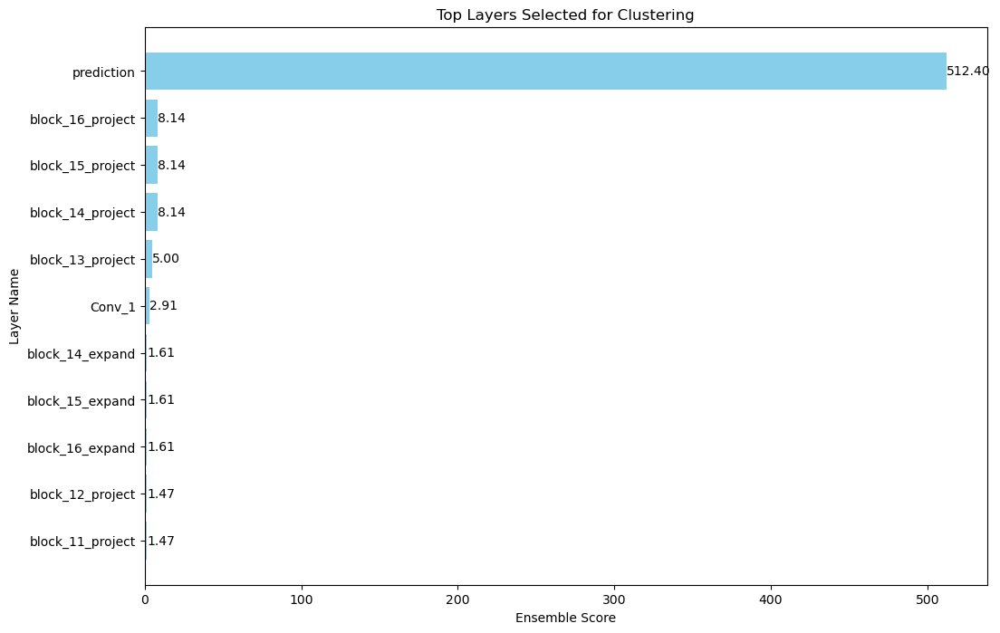

clustering prioritize : ['prediction', 'block_16_project', 'block_15_project', 'block_14_project', 'block_13_project', 'Conv_1', 'block_14_expand', 'block_15_expand', 'block_16_expand', 'block_12_project', 'block_11_project']


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.python.keras.utils import layer_utils
selected_last_layers=[
    "block_8_expand",
    "block_8_project",
    "block_9_expand",
    "block_9_project",
    "block_10_expand",
    "block_10_project",
    "block_11_expand",
    "block_11_project",
    "block_12_expand",
    "block_12_project",
    "block_13_expand",
    "block_13_project",
    "block_14_expand",
    "block_14_project",
    "block_15_expand",
    "block_15_project",
    "block_16_expand",
    "block_16_project",
    "Conv_1",
    "prediction"]

def compute_layer_metrics(layer):
    """Calculates parameter density, filter similarity, and activation sparsity.

    Handles cases where layers have no weights or the TensorFlow Profiler is unavailable.

    Args:
        layer: A Keras layer object.

    Returns:
        A tuple of (density, avg_similarity, sparsity).
    """

    try:
        total_parameters = np.sum([np.prod(w.shape) for w in layer.get_weights()])
    except ValueError:
        total_parameters = 0  # Handle case where layer has no weights

    layer_size = np.prod(layer.output_shape[1:])
    density = total_parameters / layer_size if layer_size else 0  # Avoid division by zero

    # Filter similarity (handle layers with no weights)
    if len(layer.get_weights()) > 0:
        try:
            filters = layer.get_weights()[0]
            num_filters = filters.shape[3]
            similarities = np.zeros((num_filters, num_filters))
            for i in range(num_filters):
                for j in range(i + 1, num_filters):
                    similarities[i, j] = np.mean(np.cos(filters[:, :, :, i].flatten() - filters[:, :, :, j].flatten()))
            avg_similarity = np.mean(similarities[np.triu_indices(num_filters, k=1)])
        except (IndexError, ValueError):
            # Handle potential shape issues or other errors
            avg_similarity = 0.0  # Assign a default value

    else:
        avg_similarity = 0.0  # Assign a default value for layers without weights

    # Activation sparsity (alternative method if TensorFlow Profiler unavailable)
    sparsity = 0.0  # Assume zero sparsity initially
    try:
        from tensorflow.profiler import Profiler
        run_meta = Profiler.run(model=model, options=["flops", "trainable_variables"])
        activations = run_meta.summary.trainable_variables[layer.name]
        sparsity = 1 - np.count_nonzero(activations) / activations.size
    except ImportError:
        # Consider alternative methods for sparsity estimation (e.g., sampling)
        pass  # Maintain the sparsity value at 0.0

    return density, avg_similarity, sparsity


def select_clustering_layers(model, selected_last_layers, weights=(0.4, 0.3, 0.3)):
    """Selects layers for clustering based on multiple criteria.

    This function now iterates through the model layers and checks if their names
    are present in the `selected_last_layers` list.

    Args:
        model: A Keras model object.
        selected_last_layers: A list of layer names (strings) to prioritize for clustering.
        weights: A tuple of weights for the ensemble score (density, similarity, sparsity).

    Returns:
        A list of layer names selected for clustering.
    """

    layer_metrics = []
    for layer in model.layers:
        if layer.name in selected_last_layers:  # Check layer name directly
            density, similarity, sparsity = compute_layer_metrics(layer)
            layer_metrics.append((layer.name, layer.__class__.__name__, density, similarity, sparsity))

    # **Improved section:**
    if layer_metrics:
        # Extract numerical metrics from layer_metrics
        numerical_metrics = np.array([metric[2:] for metric in layer_metrics], dtype=np.float64)
        
        ensemble_scores = np.average(numerical_metrics, axis=1, weights=weights)
        sorted_indices = np.argsort(ensemble_scores)[::-1]

        # Select top K layers (adjustable)
        top_layers = [(layer_metrics[i][0], ensemble_scores[i]) for i in sorted_indices[:11]]
        
        # Count number of top layers with values greater than 1.4
        t = sum(1 for score in ensemble_scores if score > 1.4)
        
        visualize_metrics(top_layers)
        return [layer_metrics[i][0] for i in sorted_indices[:t]]
    else:
        return []  # Handle case where no layers match criteria

def visualize_metrics(top_layers):
    """Visualize metrics of top layers."""
    names = [layer[0] for layer in top_layers]
    scores = [layer[1] for layer in top_layers]

    plt.figure(figsize=(12, 8))
    bars = plt.barh(names, scores, color='skyblue')
    plt.xlabel('Ensemble Score')
    plt.ylabel('Layer Name')
    plt.title('Top Layers Selected for Clustering')
    plt.gca().invert_yaxis()  # Invert y-axis for better readability

    # Add scores to each bar
    for bar, score in zip(bars, scores):
        plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2, f'{score:.2f}', ha='left', va='center')

    plt.show()
# Assuming you have your pre-defined model (stripped_pruned_model)
clustering_layers = select_clustering_layers(stripped_pruned_model,selected_last_layers, weights=(0.4, 0.3, 0.3))
print(f"clustering prioritize : {clustering_layers}")


In [ ]:
print(clustering_layers)

['prediction', 'block_16_project', 'block_15_project', 'block_14_project', 'block_13_project', 'Conv_1', 'block_14_expand', 'block_15_expand', 'block_16_expand', 'block_12_project', 'block_11_project']


In [ ]:
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score
# import os



# def find_optimal_clusters(layers, model):
  
#   """
#   This function finds the optimal number of clusters for each layer in a list using the elbow method with K-Means++ initialization.

#   Args:
#       layers (list): A list of layer names (strings) for which to find optimal clusters.
#       model (keras.Model): The Keras model containing the layers.

#   Returns:
#       dict: A dictionary where keys are layer names and values are the optimal number of clusters for that layer.
#   """

#   optimal_clusters = {}
#   for layer_name in layers:
#     layer = model.get_layer(layer_name)
#     if layer is None:
#       print(f"Layer not found: {layer_name}")
#       continue

#     weights = None
#     if isinstance(layer, tf.keras.layers.Layer):
#       print("Convo2D", layer.name)
#       weights = layer.get_weights()[0]

#       # Reshape for individual filters
#       num_filters = weights.shape[-1]
#       weights_reshaped = weights.reshape(num_filters, -1)

#     elif isinstance(layer, tf.keras.layers.Wrapper):
#       weights = layer.trainable_weights

#     # Handle missing weights or non-supported layers
#     if weights is None:
#       print(f"Skipping layer '{layer_name}': unsupported layer type or no weights")
#       continue

#     # Elbow method implementation
#     wcss_list = []
#     for num_clusters in range(1, 20):  # Adjust range as needed
#       kmeans = KMeans(n_clusters=num_clusters, init='k-means++')
#       kmeans.fit(weights_reshaped)
#       wcss_list.append(kmeans.inertia_)  # WCSS for current num_clusters

#     # **Optional: Comment out if you don't want plots**
#     plt.figure(figsize=(8, 6))
#     plt.plot(range(1, len(wcss_list) + 1), wcss_list)  # Use list index for x-axis
#     plt.xlabel('Number of Clusters')
#     plt.ylabel('WCSS')
#     plt.title(f'Elbow Method for Layer: {layer_name}')
#     plt.show()

#     # Identify elbow point (consider visual inspection and silhouette score)
#     min_index = np.argmin(wcss_list)
#     optimal_clusters[layer_name] = min_index + 1  # Actual number of clusters

#     # Optional: Evaluate using silhouette score
#     silhouette_scores = []
#     for num_clusters in range(2, 20):  # Adjust range as needed (skip first cluster)
#       kmeans = KMeans(n_clusters=num_clusters, init='k-means++')
#       kmeans.fit(weights_reshaped)
#       silhouette_scores.append(silhouette_score(weights_reshaped, kmeans.labels_))

#     best_silhouette_index = np.argmax(silhouette_scores) + 2  # Actual number of clusters
#     print(f"Layer: {layer_name} - Elbow suggests: {optimal_clusters[layer_name]} clusters, Silhouette Score suggests: {best_silhouette_index} clusters")

#   return optimal_clusters


# optimal_clusters_per_layer = find_optimal_clusters(clustering_layers, stripped_pruned_model)
# print(f"Optimal clusters for each layer: {optimal_clusters_per_layer}")


Layer: prediction


c:\Users\Dinuka Thathsara\anaconda3\envs\tfKernal\Lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Dinuka Thathsara\anaconda3\envs\tfKernal\Lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Dinuka Thathsara\anaconda3\envs\tfKernal\Lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Dinuka Thathsara\anaconda3\envs\tfKernal\Lib\site-pa

ValueError: Number of labels is 6. Valid values are 2 to n_samples - 1 (inclusive)

: 

In [ ]:
import tensorflow_model_optimization as tfmot
from tensorflow_model_optimization.python.core.clustering.keras.experimental import (
    cluster,
)

cluster_weights = tfmot.clustering.keras.cluster_weights
CentroidInitialization = tfmot.clustering.keras.CentroidInitialization
cluster_weights = cluster.cluster_weights

#
clustering_params = {
    'number_of_clusters': 256,
    'cluster_centroids_init': CentroidInitialization.KMEANS_PLUS_PLUS,
    'preserve_sparsity': True
}

def apply_clustering(layer):
    # Iterate through layers and cluster only layers with sufficient weights
    if layer_has_enough_weights_to_cluster(layer, clustering_params['number_of_clusters']):
        if layer.name in clustering_layers :
            print("Clust",layer.name)
            return cluster_weights(layer, **clustering_params)
        # You may want to do something with the clustered layer here 
    print("Not Clust",layer.name)
    return layer             # Skip clustering if the layer has insufficient weights
sparsity_clustered_model = tf.keras.models.clone_model(
    stripped_pruned_model,
    clone_function=apply_clustering,
)

Not Clust Conv1
Not Clust bn_Conv1
Not Clust Conv1_relu
Not Clust expanded_conv_depthwise
Not Clust expanded_conv_depthwise_BN
Not Clust expanded_conv_depthwise_relu
Not Clust expanded_conv_project
Not Clust expanded_conv_project_BN
Not Clust block_1_expand
Not Clust block_1_expand_BN
Not Clust block_1_expand_relu
Not Clust block_1_pad
Not Clust block_1_depthwise
Not Clust block_1_depthwise_BN
Not Clust block_1_depthwise_relu
Not Clust block_1_project
Not Clust block_1_project_BN
Not Clust block_2_expand
Not Clust block_2_expand_BN
Not Clust block_2_expand_relu
Not Clust block_2_depthwise
Not Clust block_2_depthwise_BN
Not Clust block_2_depthwise_relu
Not Clust block_2_project
Not Clust block_2_project_BN
Not Clust block_2_add
Not Clust block_3_expand
Not Clust block_3_expand_BN
Not Clust block_3_expand_relu
Not Clust block_3_pad
Not Clust block_3_depthwise
Not Clust block_3_depthwise_BN
Not Clust block_3_depthwise_relu
Not Clust block_3_project
Not Clust block_3_project_BN
Not Clust b

In [ ]:
sparsity_clustered_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[3][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[3][0]']        

In [ ]:
sparsity_clustered_model.compile(loss='sparse_categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
              metrics=['accuracy', 'top_k_categorical_accuracy'])

In [ ]:
fine_tune_sparcity_clusturing_epochs = 8
total_epochs =  initial_epochs + fine_tune_epochs+fine_tune_pruning_epochs+fine_tune_sparcity_clusturing_epochs

history_fine_tune_sparcity_clusturing = sparsity_clustered_model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch= history_fine_tune_pruning_.epoch[-1],
                         validation_data=validation_dataset)

Epoch 38/46
1375/1375 [==============================] - 1163s 840ms/step - loss: 0.0998 - accuracy: 0.9802 - top_k_categorical_accuracy: 0.8563 - val_loss: 0.1208 - val_accuracy: 0.9742 - val_top_k_categorical_accuracy: 0.5242
Epoch 39/46
1375/1375 [==============================] - 1141s 829ms/step - loss: 0.0844 - accuracy: 0.9834 - top_k_categorical_accuracy: 0.8528 - val_loss: 0.0895 - val_accuracy: 0.9791 - val_top_k_categorical_accuracy: 0.8931
Epoch 40/46
1375/1375 [==============================] - 1152s 837ms/step - loss: 0.0761 - accuracy: 0.9850 - top_k_categorical_accuracy: 0.9319 - val_loss: 0.0969 - val_accuracy: 0.9762 - val_top_k_categorical_accuracy: 0.9738
Epoch 41/46
1375/1375 [==============================] - 1145s 831ms/step - loss: 0.0735 - accuracy: 0.9867 - top_k_categorical_accuracy: 0.9540 - val_loss: 0.0694 - val_accuracy: 0.9848 - val_top_k_categorical_accuracy: 0.9762
Epoch 42/46
1375/1375 [==============================] - 1171s 850ms/step - loss: 0.0786

In [ ]:
accuracy = sparsity_clustered_model.evaluate(test_dataset)
print('Test accuracy :', accuracy[1])

38/38 [==============================] - 16s 396ms/step - loss: 0.8178 - accuracy: 0.7083 - top_k_categorical_accuracy: 0.9600
Test accuracy : 0.7083333134651184


In [ ]:
accuracy =sparsity_clustered_model.evaluate(validation_dataset)

153/153 [==============================] - 67s 430ms/step - loss: 0.0933 - accuracy: 0.9828 - top_k_categorical_accuracy: 0.9386


In [ ]:
print("initial accuracy: {:.2f}".format(accuracy[1]))

initial accuracy: 0.98


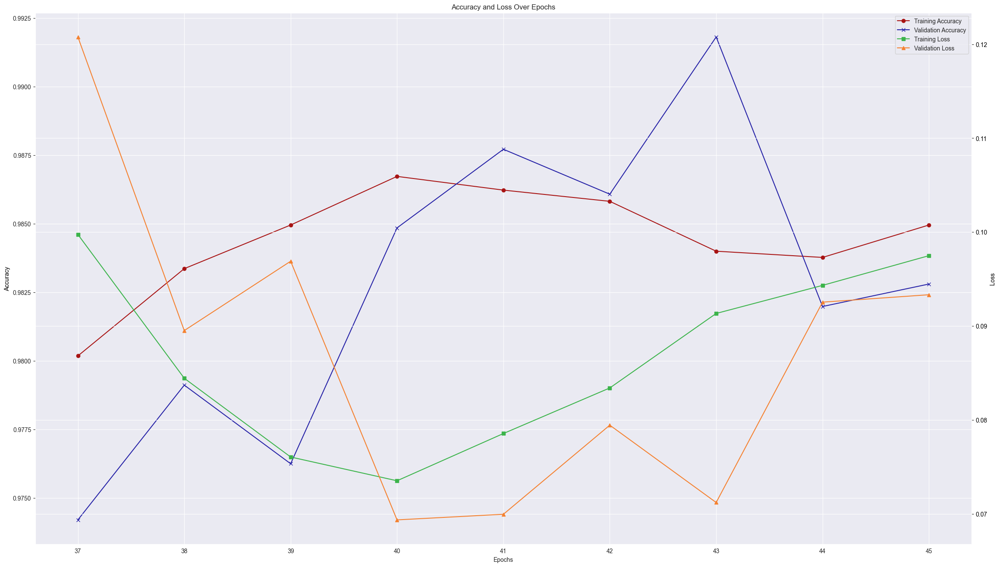

In [ ]:
accuracy_loss_plot(history_fine_tune_sparcity_clusturing, 'fine_tune_sparcity_clusturing')

In [ ]:
stripped_clustered_model = tfmot.clustering.keras.strip_clustering(sparsity_clustered_model)

print("Model sparsity:\n")
print_model_weights_sparsity(stripped_clustered_model)

print("\nModel clusters:\n")
print_model_weight_clusters(stripped_clustered_model)

Model sparsity:

Conv1/kernel:0: 0.00% sparsity  (0/864)
expanded_conv_depthwise/depthwise_kernel:0: 0.00% sparsity  (0/288)
expanded_conv_project/kernel:0: 0.00% sparsity  (0/512)
block_1_expand/kernel:0: 0.00% sparsity  (0/1536)
block_1_depthwise/depthwise_kernel:0: 0.00% sparsity  (0/864)
block_1_project/kernel:0: 0.00% sparsity  (0/2304)
block_2_expand/kernel:0: 0.00% sparsity  (0/3456)
block_2_depthwise/depthwise_kernel:0: 0.00% sparsity  (0/1296)
block_2_project/kernel:0: 0.00% sparsity  (0/3456)
block_3_expand/kernel:0: 0.00% sparsity  (0/3456)
block_3_depthwise/depthwise_kernel:0: 0.00% sparsity  (0/1296)
block_3_project/kernel:0: 0.00% sparsity  (0/4608)
block_4_expand/kernel:0: 0.00% sparsity  (0/6144)
block_4_depthwise/depthwise_kernel:0: 0.00% sparsity  (0/1728)
block_4_project/kernel:0: 0.00% sparsity  (0/6144)
block_5_expand/kernel:0: 0.00% sparsity  (0/6144)
block_5_depthwise/depthwise_kernel:0: 0.00% sparsity  (0/1728)
block_5_project/kernel:0: 0.00% sparsity  (0/6144)


In [ ]:
model_name="stripped_clustered_model"
def save_model(model,model_name):
    # Create a directory for optimized saved models if it doesn't exist
    os.makedirs("optimized_saved_models", exist_ok=True)
    
    # Save the entire model as a SavedModel with the specified name
    model.save(f'optimized_saved_models/{model_name}')

save_model(stripped_clustered_model, model_name)

INFO:tensorflow:Assets written to: optimized_saved_models/stripped_clustered_model\assets


INFO:tensorflow:Assets written to: optimized_saved_models/stripped_clustered_model\assets


In [ ]:
#save weights of the trained model to the specified folder


models_dir = os.path.join( f'./Saved_OPTIMIZED_MODELS/{base_model_name}')
model_dir = os.path.join(models_dir, model_name)
model_save_dir = os.path.join(model_dir, model_name)
model_save_path = os.path.join(model_save_dir, model_name + "_base.h5")


if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)
stripped_clustered_model.save_weights(os.path.join(model_save_dir, model_name + "_weights.h5"))

In [ ]:
#save model to the specified folder
model_file_path = os.path.join(model_save_dir, model_name + ".h5")
stripped_clustered_model.save(model_file_path)
model_size_bytes = os.path.getsize(model_file_path)
model_size_megabytes = model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes

print("Model size: {:.2f} megabytes".format(model_size_megabytes))

D:\FYP\CODE\Animal-Classification-at-Edge\venv\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model size: 9.10 megabytes


Evaluation and Prediction

In [ ]:
model_name="sparcity_clustered_model"


In [ ]:
accuracy =sparsity_clustered_model.evaluate(test_dataset)
print('Test accuracy :', accuracy[1])

38/38 [==============================] - 17s 424ms/step - loss: 0.8178 - accuracy: 0.7083 - top_k_categorical_accuracy: 0.9600
Test accuracy : 0.7083333134651184


In [ ]:
predictions = sparsity_clustered_model.predict(test_dataset)

38/38 [==============================] - 17s 391ms/step


## Apply QAT and PCQAT and check effect on model clusters and sparsity

## QAT

In [ ]:
# import tensorflow_model_optimization as tfmot

# # Helper function uses `quantize_annotate_layer` to annotate that only the 



# def apply_quantization_to_conv(layer):
#     if isinstance(layer, (tf.keras.layers.Conv2D, tf.keras.layers.DepthwiseConv2D)):
#       print(layer.name)
#       return tfmot.quantization.keras.quantize_annotate_layer(layer)
#     return layer
# def apply_quantization_to_last_conv(layer):
#     if layer.name in last_conv_layers :
#       print(layer.name)
#       return tfmot.quantization.keras.quantize_annotate_layer(layer)
#     return layer

In [ ]:
import tensorflow_model_optimization as tfmot


def get_model(stripped_clustered_model, qatBaseFull=True, pcqatBaseFull=True):
    #QAT for Full Model
    if qatBaseFull:
        qat_full_model = tfmot.quantization.keras.quantize_model(stripped_clustered_model)
        return qat_full_model
    
    #PCQAT for Full Model
    if pcqatBaseFull:
        quant_aware_annotate_model = tfmot.quantization.keras.quantize_annotate_model(
                    stripped_clustered_model)
        pcqat_model = tfmot.quantization.keras.quantize_apply(
                    quant_aware_annotate_model,
                    tfmot.experimental.combine.Default8BitClusterPreserveQuantizeScheme(preserve_sparsity=True))
        return pcqat_model
    
    # if qatConv:
    #     # Use `keras.models.clone_model` to apply `apply_quantization_to_dense` 
    #     # to the layers of the model.
    #     annotated_model = tf.keras.models.clone_model(
    #         clustered_model,
    #         clone_function=apply_quantization_to_last_conv,
    #     )
    #     annotated_model.summary()
    #     qat_model = tfmot.quantization.keras.quantize_apply(annotated_model)
    #     return qat_model
    
    # if pcqatConv:
    #     # Use `keras.models.clone_model` to apply `apply_quantization_to_dense` 
    #     # to the layers of the model.
    #     annotated_model = tf.keras.models.clone_model(
    #         clustered_model,
    #         clone_function=apply_quantization_to_last_conv,
    #     )
    #     pcqat_model = tfmot.quantization.keras.quantize_apply(annotated_model,tfmot.experimental.combine.Default8BitClusterPreserveQuantizeScheme(preserve_sparsity=True))
    #     return pcqat_model


In [ ]:
qat_full_model = get_model(stripped_clustered_model,qatBaseFull=True,pcqatBaseFull=False)

In [ ]:
pcqat_full_model = get_model(stripped_clustered_model,qatBaseFull=False,pcqatBaseFull=True)

In [ ]:
# QAT
qat_full_model.compile(loss='sparse_categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
              metrics=['accuracy', 'top_k_categorical_accuracy'])


print('Train qat model:')

Train qat model:


In [ ]:
fine_tune_sparcity_clusturing_qat_epochs = 8
total_epochs =  initial_epochs + fine_tune_epochs+fine_tune_pruning_epochs+fine_tune_sparcity_clusturing_epochs+fine_tune_sparcity_clusturing_qat_epochs

history_fine_tune_sparcity_clusturing_qat = qat_full_model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch= history_fine_tune_sparcity_clusturing.epoch[-1],
                         validation_data=validation_dataset)

Epoch 46/54
1375/1375 [==============================] - 2557s 2s/step - loss: 0.1342 - accuracy: 0.9699 - top_k_categorical_accuracy: 0.8784 - val_loss: 0.0760 - val_accuracy: 0.9885 - val_top_k_categorical_accuracy: 0.8616
Epoch 47/54
1375/1375 [==============================] - 2557s 2s/step - loss: 0.0851 - accuracy: 0.9848 - top_k_categorical_accuracy: 0.8721 - val_loss: 0.0567 - val_accuracy: 0.9926 - val_top_k_categorical_accuracy: 0.8800
Epoch 48/54
1375/1375 [==============================] - 2554s 2s/step - loss: 0.0755 - accuracy: 0.9873 - top_k_categorical_accuracy: 0.8751 - val_loss: 0.0483 - val_accuracy: 0.9955 - val_top_k_categorical_accuracy: 0.8550
Epoch 49/54
1375/1375 [==============================] - 2544s 2s/step - loss: 0.0676 - accuracy: 0.9888 - top_k_categorical_accuracy: 0.8744 - val_loss: 0.0620 - val_accuracy: 0.9914 - val_top_k_categorical_accuracy: 0.8722
Epoch 50/54
1375/1375 [==============================] - 2562s 2s/step - loss: 0.0651 - accuracy: 0.

In [ ]:
model_name="sparcity_clusturing_qat"

In [ ]:
accuracy = qat_full_model.evaluate(test_dataset)
print('Test accuracy :', accuracy[1])

38/38 [==============================] - 18s 468ms/step - loss: 1.0216 - accuracy: 0.6967 - top_k_categorical_accuracy: 0.8833
Test accuracy : 0.6966666579246521


In [ ]:
accuracy =qat_full_model.evaluate(validation_dataset)

153/153 [==============================] - 81s 520ms/step - loss: 0.0437 - accuracy: 0.9943 - top_k_categorical_accuracy: 0.8292


In [ ]:
print("initial accuracy: {:.2f}".format(accuracy[1]))

initial accuracy: 0.99


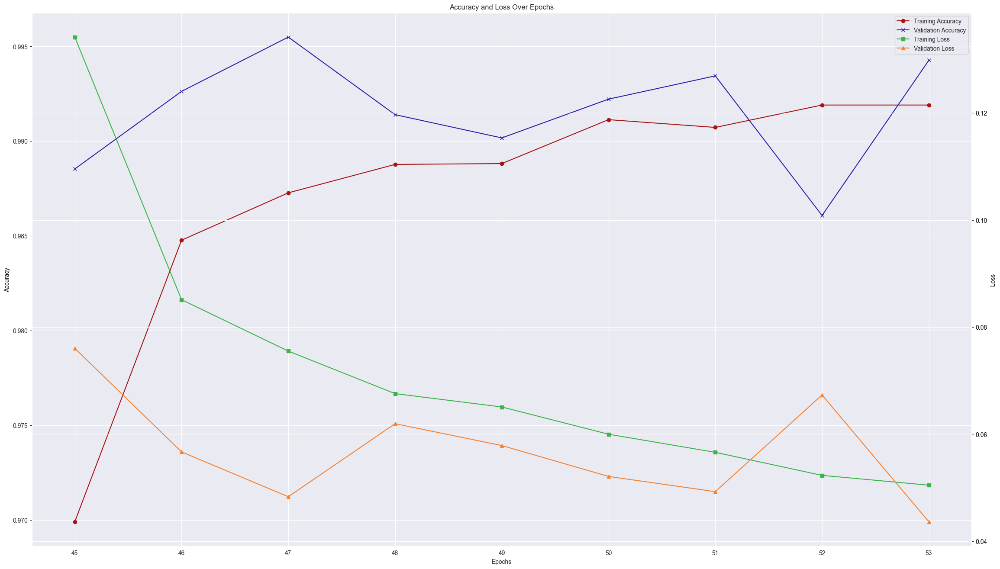

In [ ]:
accuracy_loss_plot(history_fine_tune_sparcity_clusturing_qat, 'fine_tune_sparcity_clusturing_QAT')

In [ ]:
#save weights of the trained model to the specified folder


models_dir = os.path.join( f'./Saved_OPTIMIZED_MODELS/{base_model_name}')
model_dir = os.path.join(models_dir, model_name)
model_save_dir = os.path.join(model_dir, model_name)
model_save_path = os.path.join(model_save_dir, model_name + "_base.h5")


if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)
qat_full_model.save_weights(os.path.join(model_save_dir, model_name + "_weights.h5"))

In [ ]:
#save model to the specified folder
model_file_path = os.path.join(model_save_dir, model_name + ".h5")
qat_full_model.save(model_file_path)
model_size_bytes = os.path.getsize(model_file_path)
model_size_megabytes = model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes

print("Model size: {:.2f} megabytes".format(model_size_megabytes))

D:\FYP\CODE\Animal-Classification-at-Edge\venv\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model size: 18.17 megabytes


In [ ]:
def save_model(model,model_name):
    # Create a directory for optimized saved models if it doesn't exist
    os.makedirs("optimized_saved_models", exist_ok=True)
    
    # Save the entire model as a SavedModel with the specified name
    model.save(f'optimized_saved_models/{model_name}')

save_model(qat_full_model, model_name)

INFO:tensorflow:Assets written to: optimized_saved_models/sparcity_clusturing_qat\assets


INFO:tensorflow:Assets written to: optimized_saved_models/sparcity_clusturing_qat\assets


    Evaluation and Prediction

In [ ]:
accuracy =qat_full_model.evaluate(test_dataset)
print('Test accuracy :', accuracy[1])

38/38 [==============================] - 19s 489ms/step - loss: 1.0216 - accuracy: 0.6967 - top_k_categorical_accuracy: 0.8833
Test accuracy : 0.6966666579246521


In [ ]:
predictions = qat_full_model.predict(test_dataset)

38/38 [==============================] - 20s 468ms/step


## PCQAT

In [ ]:
pcqat_full_model.compile(loss='sparse_categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
              metrics=['accuracy', 'top_k_categorical_accuracy'])

In [ ]:
fine_tune_sparcity_clusturing_pcqat_epochs = 8
total_epochs =  initial_epochs + fine_tune_epochs+fine_tune_pruning_epochs+fine_tune_sparcity_clusturing_epochs+fine_tune_sparcity_clusturing_pcqat_epochs

history_fine_tune_sparcity_clusturing_pcqat = pcqat_full_model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch= history_fine_tune_sparcity_clusturing.epoch[-1],
                         validation_data=validation_dataset)

Epoch 46/54


1375/1375 [==============================] - 5486s 4s/step - loss: 0.1418 - accuracy: 0.9687 - top_k_categorical_accuracy: 0.9022 - val_loss: 0.1822 - val_accuracy: 0.9550 - val_top_k_categorical_accuracy: 0.9267
Epoch 47/54
1375/1375 [==============================] - 5202s 4s/step - loss: 0.1004 - accuracy: 0.9846 - top_k_categorical_accuracy: 0.9084 - val_loss: 0.2151 - val_accuracy: 0.9414 - val_top_k_categorical_accuracy: 0.9275
Epoch 48/54
1375/1375 [==============================] - 5149s 4s/step - loss: 0.1008 - accuracy: 0.9854 - top_k_categorical_accuracy: 0.9119 - val_loss: 0.1212 - val_accuracy: 0.9836 - val_top_k_categorical_accuracy: 0.7985
Epoch 49/54
1375/1375 [==============================] - 5390s 4s/step - loss: 0.1088 - accuracy: 0.9862 - top_k_categorical_accuracy: 0.9171 - val_loss: 0.1289 - val_accuracy: 0.9762 - val_top_k_categorical_accuracy: 0.9668
Epoch 50/54
1375/1375 [==============================] - 5747s 4s/step - loss: 0.1142 - accuracy: 0.9865 - top_k

In [ ]:
model_name="sparcity_clusturing_pcqat"

In [ ]:
accuracy = pcqat_full_model.evaluate(test_dataset)
print('Test accuracy :', accuracy[1])

38/38 [==============================] - 28s 705ms/step - loss: 2.4831 - accuracy: 0.5500 - top_k_categorical_accuracy: 0.9900
Test accuracy : 0.550000011920929


In [ ]:
accuracy =pcqat_full_model.evaluate(validation_dataset)

153/153 [==============================] - 114s 740ms/step - loss: 0.2316 - accuracy: 0.9431 - top_k_categorical_accuracy: 0.9767


In [ ]:
print("initial accuracy: {:.2f}".format(accuracy[1]))


initial accuracy: 0.94


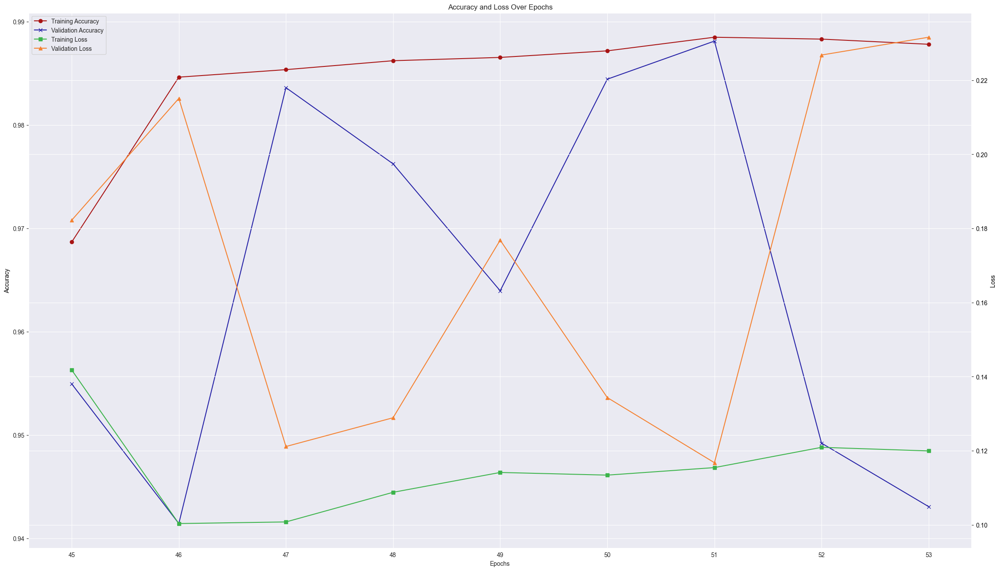

In [ ]:
accuracy_loss_plot(history_fine_tune_sparcity_clusturing_pcqat, 'fine_tune_sparcity_clusturing_PCQAT')

In [ ]:
#save weights of the trained model to the specified folder


models_dir = os.path.join( f'./Saved_OPTIMIZED_MODELS/{base_model_name}')
model_dir = os.path.join(models_dir, model_name)
model_save_dir = os.path.join(model_dir, model_name)
model_save_path = os.path.join(model_save_dir, model_name + "_base.h5")


if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)
pcqat_full_model.save_weights(os.path.join(model_save_dir, model_name + "_weights.h5"))

In [ ]:
#save model to the specified folder
model_file_path = os.path.join(model_save_dir, model_name + ".h5")
pcqat_full_model.save(model_file_path)
model_size_bytes = os.path.getsize(model_file_path)
model_size_megabytes = model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes

print("Model size: {:.2f} megabytes".format(model_size_megabytes))

Model size: 42.74 megabytes


In [ ]:
# from keras.models import load_model

# # Define custom objects dictionary
# custom_objects = {
#     'QuantizeLayer': tf.keras.layers.QuantizeLayer  # Replace 'QuantizeLayer' with the actual class name of your custom layer
# }

# # Load the model with custom objects
# model = load_model('./Saved_OPTIMIZED_MODELS/MobilenetV2/sparcity_clusturing_qat/sparcity_clusturing_qat/sparcity_clusturing_qat.h5', custom_objects=custom_objects)


In [ ]:
# qat_full_model = tf.keras.models.load_model('optimized_saved_models/sparcity_clusturing_qat')

# # Show the model architecture

# qat_full_model.summary()

In [ ]:
def save_model(model,model_name):
    # Create a directory for optimized saved models if it doesn't exist
    os.makedirs("optimized_saved_models", exist_ok=True)
    
    # Save the entire model as a SavedModel with the specified name
    model.save(f'optimized_saved_models/{model_name}')

save_model(pcqat_full_model, model_name)

INFO:tensorflow:Assets written to: optimized_saved_models/sparcity_clusturing_pcqat\assets


INFO:tensorflow:Assets written to: optimized_saved_models/sparcity_clusturing_pcqat\assets


In [ ]:
print("QAT Model clusters:")
print_model_weight_clusters(qat_full_model)
print("\nQAT Model sparsity:")
print_model_weights_sparsity(qat_full_model)
print("\nPCQAT Model clusters:")
print_model_weight_clusters(pcqat_full_model)
print("\nPCQAT Model sparsity:")
print_model_weights_sparsity(pcqat_full_model)

QAT Model clusters:
quant_Conv1/Conv1/kernel:0: 864 clusters 
quant_expanded_conv_depthwise/expanded_conv_depthwise/depthwise_kernel:0: 288 clusters 
quant_expanded_conv_project/expanded_conv_project/kernel:0: 512 clusters 
quant_block_1_expand/block_1_expand/kernel:0: 1536 clusters 
quant_block_1_depthwise/block_1_depthwise/depthwise_kernel:0: 864 clusters 
quant_block_1_project/block_1_project/kernel:0: 2304 clusters 
quant_block_2_expand/block_2_expand/kernel:0: 3456 clusters 
quant_block_2_depthwise/block_2_depthwise/depthwise_kernel:0: 1296 clusters 
quant_block_2_project/block_2_project/kernel:0: 3456 clusters 
quant_block_3_expand/block_3_expand/kernel:0: 3456 clusters 
quant_block_3_depthwise/block_3_depthwise/depthwise_kernel:0: 1296 clusters 
quant_block_3_project/block_3_project/kernel:0: 4608 clusters 
quant_block_4_expand/block_4_expand/kernel:0: 6144 clusters 
quant_block_4_depthwise/block_4_depthwise/depthwise_kernel:0: 1728 clusters 
quant_block_4_project/block_4_projec

Evaluation and Prediction

In [ ]:
accuracy =pcqat_full_model.evaluate(test_dataset)
print('Test accuracy :', accuracy[1])

38/38 [==============================] - 37s 920ms/step - loss: 2.4831 - accuracy: 0.5500 - top_k_categorical_accuracy: 0.9900
Test accuracy : 0.550000011920929


In [ ]:
predictions = pcqat_full_model.predict(test_dataset)

38/38 [==============================] - 39s 935ms/step


In [ ]:
breaakkkkkkkkk

## See compression benefits of PCQAT model


In [ ]:
# def get_gzipped_model_size(file):
#   # It returns the size of the gzipped model in kilobytes.

#   _, zipped_file = tempfile.mkstemp('.zip')
#   with zipfile.ZipFile(zipped_file, 'w', compression=zipfile.ZIP_DEFLATED) as f:
#     f.write(file)

#   return os.path.getsize(zipped_file)/1000

Observe that applying sparsity, clustering and PCQAT to a model yields significant compression benefits.


In [ ]:
# QAT model
converter = tf.lite.TFLiteConverter.from_keras_model(qat_full_model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
qat_tflite_model = converter.convert()


INFO:tensorflow:Assets written to: C:\Users\sumeela\AppData\Local\Temp\tmpmpssoi94\assets


INFO:tensorflow:Assets written to: C:\Users\sumeela\AppData\Local\Temp\tmpmpssoi94\assets
D:\FYP\CODE\Animal-Classification-at-Edge\venv\lib\site-packages\tensorflow\lite\python\convert.py:887: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(


In [ ]:
# PCQAT model
converter = tf.lite.TFLiteConverter.from_keras_model(pcqat_full_model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
pcqat_tflite_model = converter.convert()

INFO:tensorflow:Assets written to: C:\Users\sumeela\AppData\Local\Temp\tmpq_xd0lao\assets


INFO:tensorflow:Assets written to: C:\Users\sumeela\AppData\Local\Temp\tmpq_xd0lao\assets
D:\FYP\CODE\Animal-Classification-at-Edge\venv\lib\site-packages\tensorflow\lite\python\convert.py:887: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(


In [ ]:
# Save the QAT TFLite model to a file
optimized_model_name="MobilenetV2_QAT_FUll"
tflite_models_dir = os.path.join(os.getcwd(), 'tflite_optimized_models')
tflite_model_dir = os.path.join(tflite_models_dir, optimized_model_name)
if not os.path.exists(tflite_model_dir):
    os.makedirs(tflite_model_dir)

tflite_model_save_path = os.path.join(tflite_model_dir,optimized_model_name + ".tflite")
with open(tflite_model_save_path, 'wb') as f:
    f.write(qat_tflite_model)

In [ ]:
# Save the PCQAT TFLite model to a file
optimized_model_name="MobilenetV2_PCQAT_FUll"
tflite_models_dir = os.path.join(os.getcwd(), 'tflite_optimized_models')
tflite_model_dir = os.path.join(tflite_models_dir, optimized_model_name)
if not os.path.exists(tflite_model_dir):
    os.makedirs(tflite_model_dir)

tflite_model_save_path = os.path.join(tflite_model_dir,optimized_model_name + ".tflite")
with open(tflite_model_save_path, 'wb') as f:
    f.write(pcqat_tflite_model)

In [ ]:
# Get the size of the TFLite model in megabytes
tflite_model_size_bytes = len(qat_tflite_model)
tflite_model_size_mb = tflite_model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes
print("Size of the TFLite model:", tflite_model_size_mb, "MB")

Size of the TFLite model: 2.5899276733398438 MB


In [ ]:
# Get the size of the TFLite model in megabytes
tflite_model_size_bytes = len(pcqat_tflite_model)
tflite_model_size_mb = tflite_model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes
print("Size of the TFLite model:", tflite_model_size_mb, "MB")

Size of the TFLite model: 2.5899276733398438 MB


# Inference Process

In [ ]:
# import tensorflow as tf
# import numpy as np
# from tensorflow.keras.preprocessing import image

# # Open image and resize
# img_path = './Random_outside_predictions/malayan-porcupine_1497.jpg'
# img = image.load_img(img_path, target_size=(224, 224))
# img_array = image.img_to_array(img)
# img_array = np.expand_dims(img_array, axis=0)
# # img_array /= 255.0  # Normalize pixel values to be between 0 and 1

# # Load the model
# # general_model = tf.keras.models.load_model('models/MobileNetV2_updated/MobileNetV2_updated/MobileNetV2_QAT_FINAL_CONV.h5')
# interpreter = tf.lite.Interpreter(model_path='./MobilenetV2_QAT_FUll/MobilenetV2_QAT_FUll/MobileNetV2_sparcity_clustered_model.tflite')
# interpreter.allocate_tensors()  # Allocate tensors

# # # Make predictions
# # predictions = model.predict(img_array)
# # # pred_prob = model.predict_proba(test_dataset)
# # print(predictions)

# # # Get the index of the highest probability class
# # predicted_class_index = np.argmax(predictions, axis=1)
# # print("Predicted label from general model:",class_labels[predicted_class_index[0]])

# # Perform inference
# input_details = interpreter.get_input_details()
# output_details = interpreter.get_output_details()

# interpreter.set_tensor(input_details[0]['index'], img_array)
# interpreter.invoke()
# output_data = interpreter.get_tensor(output_details[0]['index'])

# # Post-process the output
# predicted_class_index = np.argmax(output_data)

# print("Predicted label from Tflite model:",class_labels[predicted_class_index])

In [ ]:
# print(predictions)

In [ ]:
# fpr, tpr, roc_auc = get_ROC_AUC(predicted_class_index, true_labels)
# save_ROC_AUC(fpr, tpr, roc_auc)

In [ ]:

from sklearn.metrics import classification_report


#load tf lite model and want to calculate accuracy of the compressed model
interpreter = tf.lite.Interpreter(model_path='./tflite_optimized_models/MobilenetV2_QAT_FUll/MobilenetV2_QAT_FUll.tflite')

true_labels = true_labels
predicted_labels = []

for images, labels in test_dataset:
    for image in images:
        image = tf.expand_dims(image, axis=0)
        interpreter.allocate_tensors()
        interpreter.set_tensor(interpreter.get_input_details()[0]['index'], image)
        interpreter.invoke()
        preds = interpreter.get_tensor(interpreter.get_output_details()[0]['index'])
        preds = np.argmax(preds, axis=1)
        predicted_labels.extend(preds)

print(classification_report(true_labels, predicted_labels, target_names=class_labels))




                precision    recall  f1-score   support

          dear       0.77      0.24      0.37       100
           fox       0.45      0.15      0.23       100
   leopard cat       0.88      0.80      0.84       100
     porcupine       0.93      1.00      0.97       100
sumatran serow       0.49      1.00      0.66       100
     wild boar       0.71      0.96      0.82       100

      accuracy                           0.69       600
     macro avg       0.71      0.69      0.65       600
  weighted avg       0.71      0.69      0.65       600



NameError: name 'model_name' is not defined

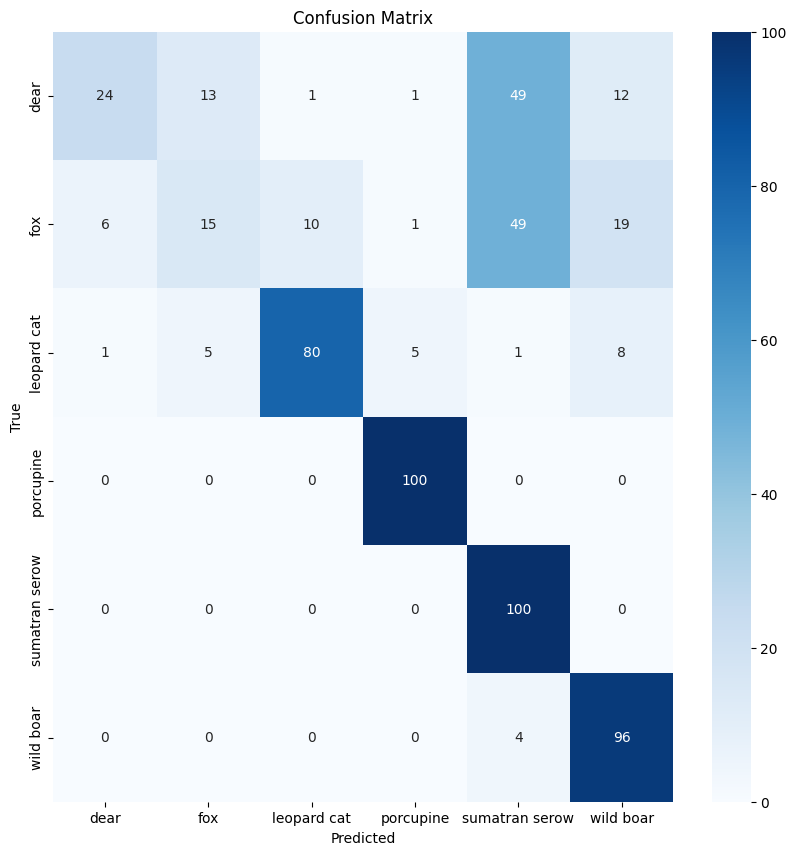

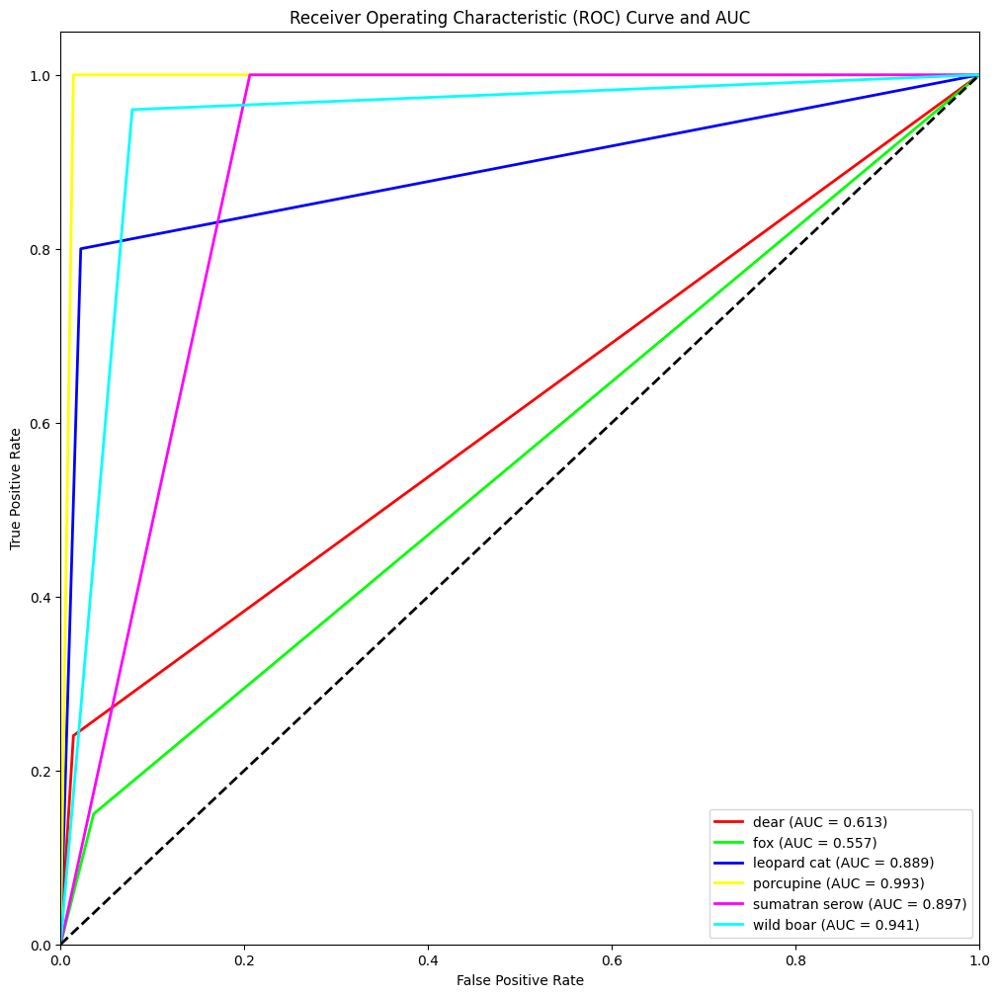

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
def getting_confusion_matrix(base_model_name,model_name):
    confusion_matrix_res = confusion_matrix(true_labels, predicted_labels)
    plt.figure(figsize=(10, 10))
    sns.heatmap(confusion_matrix_res, annot=True, fmt="d", cmap="Blues",xticklabels=class_labels, yticklabels=class_labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')

    confusion_matrix_path = os.path.join(os.getcwd(),  f'./confusion_matrices/{model_name}/{base_model_name}')
    curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
    filename = f'{model_name}-confusion_matrix-{format(curr_datetime)}.png'

    if not os.path.exists(confusion_matrix_path):
        os.makedirs(confusion_matrix_path)

    # Save the plot to the specified folder
    save_path = os.path.join(confusion_matrix_path, filename)
    plt.savefig(save_path, bbox_inches='tight')
base_model_name="MobilenetV2"
getting_confusion_matrix(base_model_name,"NPCQAT")
fpr, tpr, roc_auc = get_ROC_AUC(predicted_labels, true_labels)
save_ROC_AUC(fpr, tpr, roc_auc)

In [ ]:

from sklearn.metrics import classification_report


#load tf lite model and want to calculate accuracy of the compressed model
interpreter = tf.lite.Interpreter(model_path='./tflite_optimized_models/MobilenetV2_PCQAT_FUll/MobilenetV2_PCQAT_FUll.tflite')

true_labels = true_labels
predicted_labels = []

for images, labels in test_dataset:
    for image in images:
        image = tf.expand_dims(image, axis=0)
        interpreter.allocate_tensors()
        interpreter.set_tensor(interpreter.get_input_details()[0]['index'], image)
        interpreter.invoke()
        preds = interpreter.get_tensor(interpreter.get_output_details()[0]['index'])
        preds = np.argmax(preds, axis=1)
        predicted_labels.extend(preds)

print(classification_report(true_labels, predicted_labels, target_names=class_labels))




                precision    recall  f1-score   support

          dear       0.69      0.31      0.43       100
           fox       0.00      0.00      0.00       100
   leopard cat       0.97      0.36      0.53       100
     porcupine       0.82      1.00      0.90       100
sumatran serow       0.78      0.98      0.87       100
     wild boar       0.38      1.00      0.55       100

      accuracy                           0.61       600
     macro avg       0.61      0.61      0.54       600
  weighted avg       0.61      0.61      0.54       600



NameError: name 'model_name' is not defined

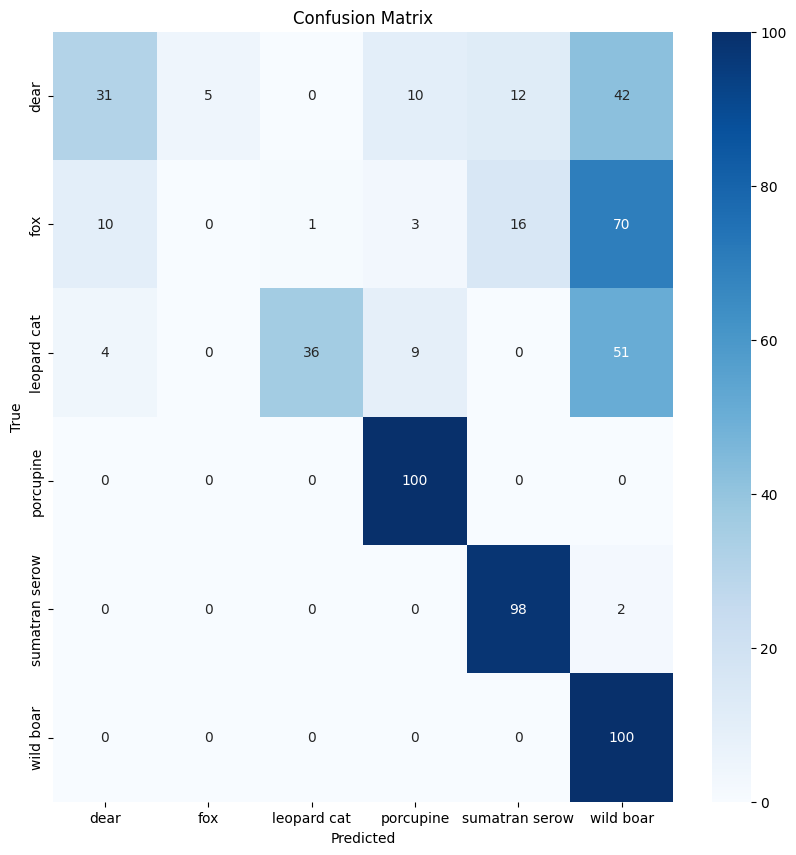

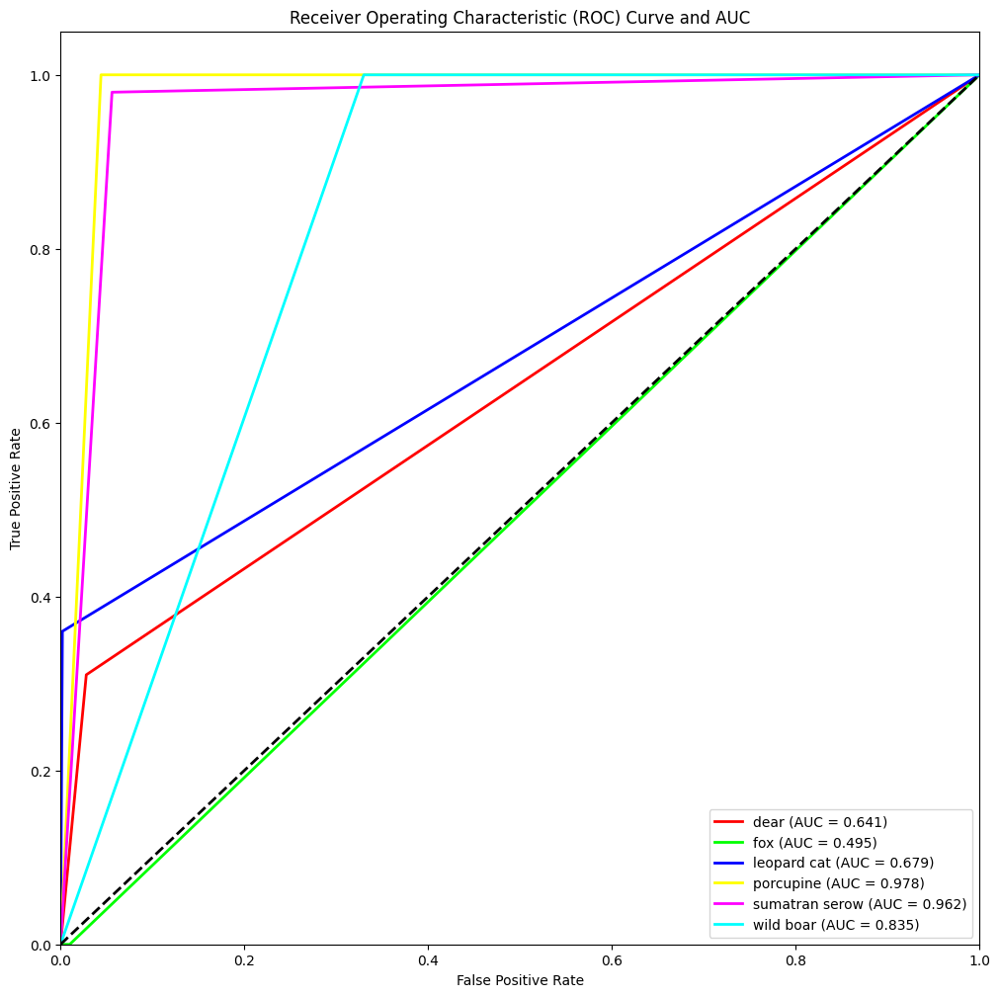

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
def getting_confusion_matrix(base_model_name,model_name):
    confusion_matrix_res = confusion_matrix(true_labels, predicted_labels)
    plt.figure(figsize=(10, 10))
    sns.heatmap(confusion_matrix_res, annot=True, fmt="d", cmap="Blues",xticklabels=class_labels, yticklabels=class_labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')

    confusion_matrix_path = os.path.join(os.getcwd(),  f'./confusion_matrices/{model_name}/{base_model_name}')
    curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
    filename = f'{model_name}-confusion_matrix-{format(curr_datetime)}.png'

    if not os.path.exists(confusion_matrix_path):
        os.makedirs(confusion_matrix_path)

    # Save the plot to the specified folder
    save_path = os.path.join(confusion_matrix_path, filename)
    plt.savefig(save_path, bbox_inches='tight')
base_model_name="MobilenetV2"
getting_confusion_matrix(base_model_name,"PCQAT")
fpr, tpr, roc_auc = get_ROC_AUC(predicted_labels, true_labels)
save_ROC_AUC(fpr, tpr, roc_auc)

In [ ]:
from datetime import datetime


Loading FIneTuned Pruned Model

Loading Stripped Pruned Model

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
def getting_confusion_matrix(base_model_name,model_name):
    confusion_matrix_res = confusion_matrix(true_labels, predicted_labels)
    plt.figure(figsize=(10, 10))
    sns.heatmap(confusion_matrix_res, annot=True, fmt="d", cmap="Blues",xticklabels=class_labels, yticklabels=class_labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')

    confusion_matrix_path = os.path.join(os.getcwd(),  f'./confusion_matrices/{model_name}/{base_model_name}')
    curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
    filename = f'{model_name}-confusion_matrix-{format(curr_datetime)}.png'

    if not os.path.exists(confusion_matrix_path):
        os.makedirs(confusion_matrix_path)

    # Save the plot to the specified folder
    save_path = os.path.join(confusion_matrix_path, filename)
    plt.savefig(save_path, bbox_inches='tight')

In [ ]:
from datetime import datetime
from itertools import cycle
from sklearn.calibration import label_binarize
from sklearn.metrics import auc, roc_curve

num_labels=6

def get_ROC_AUC(y_pred, y_target):
    # Binarize the labels
    n_classes = num_labels
    true_labels_bin = label_binarize(y_target, classes=range(n_classes))
    predicted_labels_bin = label_binarize(y_pred, classes=range(n_classes))

    # Compute ROC curve and AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(n_classes):
        print()
        fpr[i], tpr[i], _ = roc_curve(true_labels_bin[:, i], predicted_labels_bin[:, i],drop_intermediate=True)
        roc_auc[i] = auc(fpr[i], tpr[i])

    return fpr, tpr, roc_auc

def save_ROC_AUC(fpr, tpr, roc_auc):
    n_classes = num_labels

    # Plot ROC curves for each class
    plt.figure(figsize=(12, 12))

    hex_colors = [
        "#FF0000",  # Red
        "#00FF00",  # Green
        "#0000FF",  # Blue
        "#FFFF00",  # Yellow
        "#FF00FF",  # Magenta
        "#00FFFF",  # Cyan
        "#FFA500",  # Orange
        "#FF4500",  # OrangeRed
        "#FFD700",  # Gold
        "#8A2BE2",  # BlueViolet
        "#7FFF00",  # Chartreuse
        "#DC143C",  # Crimson
        "#48D1CC",  # MediumTurquoise
        "#2E8B57",  # SeaGreen
        "#800080",  # Purple
        "#ADFF2F",  # GreenYellow
        "#FF1493",  # DeepPink
        "#9370DB",  # MediumPurple
        "#8B4513",  # SaddleBrown
        "#20B2AA",  # LightSeaGreen
        "#8B008B",  # DarkMagenta
        "#FF6347",  # Tomato
        "#556B2F",  # DarkOliveGreen
        "#6B8E23",  # OliveDrab
        "#BDB76B",  # DarkKhaki
        "#808080",  # Gray
        "#DAA520",  # GoldenRod
    ]

    colors = cycle(hex_colors)  # Adjust as needed for your number of classes

    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                    label=f'{class_labels[i]} (AUC = {roc_auc[i]:.3f})')

    plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--')  # Diagonal line for reference
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve and AUC')
    plt.legend(loc='lower right')

    roc_auc_path = os.path.join(os.getcwd(),  f'./ROC_Curves/{base_model_name}')
    curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
    filename = f'{model_name.lower()}-roc_auc-{format(curr_datetime)}.png'

    if not os.path.exists(roc_auc_path):
        os.makedirs(roc_auc_path)

    # Save the plot to the specified folder
    save_path = os.path.join(roc_auc_path, filename)
    plt.savefig(save_path, bbox_inches='tight')

In [ ]:
import tensorflow as tf

# Assuming "./optimized_saved_models/Stripped_Pruned_Model" is the correct path to your saved model
model_path = "./optimized_saved_models/Stripped_Pruned_Model"

# Load the model
try:
    loaded_stripped_pruned_model = tf.keras.models.load_model(model_path)
    print("Model loaded successfully.")
except Exception as e:
    print("Error loading the model:", str(e))

Model loaded successfully.


In [ ]:
loaded_stripped_pruned_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

In [ ]:
# Stripped Pruned Model
converter = tf.lite.TFLiteConverter.from_keras_model(loaded_stripped_pruned_model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
stripped_pruned_tflite_model = converter.convert()


INFO:tensorflow:Assets written to: C:\Users\DINUKA~1\AppData\Local\Temp\tmp10fpk_as\assets


INFO:tensorflow:Assets written to: C:\Users\DINUKA~1\AppData\Local\Temp\tmp10fpk_as\assets


In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(loaded_stripped_pruned_model)
compressed_loaded_stripped_pruned_model_tflite_model = converter.convert()

INFO:tensorflow:Assets written to: C:\Users\DINUKA~1\AppData\Local\Temp\tmp0rbm0ykd\assets


INFO:tensorflow:Assets written to: C:\Users\DINUKA~1\AppData\Local\Temp\tmp0rbm0ykd\assets


In [ ]:
# Save the QAT TFLite model to a file
optimized_model_name="MobilenetV2_Stripped_Pruned_TFLITE"
tflite_models_dir = os.path.join(os.getcwd(), 'tflite_optimized_models')
tflite_model_dir = os.path.join(tflite_models_dir, optimized_model_name)
if not os.path.exists(tflite_model_dir):
    os.makedirs(tflite_model_dir)

tflite_model_save_path = os.path.join(tflite_model_dir,optimized_model_name + ".tflite")
with open(tflite_model_save_path, 'wb') as f:
    f.write(stripped_pruned_tflite_model)

NameError: name 'os' is not defined

In [ ]:
optimized_model_name="Compressed_MobilenetV2_Stripped_Pruned_TFLITE"
tflite_models_dir = os.path.join(os.getcwd(), 'tflite_optimized_models')
tflite_model_dir = os.path.join(tflite_models_dir, optimized_model_name)
if not os.path.exists(tflite_model_dir):
    os.makedirs(tflite_model_dir)

tflite_model_save_path = os.path.join(tflite_model_dir,optimized_model_name + ".tflite")
with open(tflite_model_save_path, 'wb') as f:
    f.write(compressed_loaded_stripped_pruned_model_tflite_model)

In [ ]:
# Get the size of the TFLite model in megabytes
tflite_model_size_bytes = len(stripped_pruned_tflite_model)
tflite_model_size_mb = tflite_model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes
print("Size of the TFLite model:", tflite_model_size_mb, "MB")

Size of the TFLite model: 2.391357421875 MB


In [ ]:
# Get the size of the TFLite model in megabytes
tflite_model_size_bytes = len(compressed_loaded_stripped_pruned_model_tflite_model)
tflite_model_size_mb = tflite_model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes
print("Size of the TFLite model:", tflite_model_size_mb, "MB")

Size of the TFLite model: 8.476730346679688 MB


In [ ]:

from sklearn.metrics import classification_report


#load tf lite model and want to calculate accuracy of the compressed model
interpreter = tf.lite.Interpreter(model_path='./tflite_optimized_models/MobilenetV2_Stripped_Pruned_TFLITE/MobilenetV2_Stripped_Pruned_TFLITE.tflite')

true_labels = true_labels
predicted_labels = []

for images, labels in test_dataset:
    for image in images:
        image = tf.expand_dims(image, axis=0)
        interpreter.allocate_tensors()
        interpreter.set_tensor(interpreter.get_input_details()[0]['index'], image)
        interpreter.invoke()
        preds = interpreter.get_tensor(interpreter.get_output_details()[0]['index'])
        preds = np.argmax(preds, axis=1)
        predicted_labels.extend(preds)

print(classification_report(true_labels, predicted_labels, target_names=class_labels))




                precision    recall  f1-score   support

          dear       0.63      0.38      0.47       100
           fox       0.57      0.21      0.31       100
   leopard cat       0.91      0.77      0.83       100
     porcupine       0.81      1.00      0.90       100
sumatran serow       0.53      1.00      0.69       100
     wild boar       0.82      0.88      0.85       100

      accuracy                           0.71       600
     macro avg       0.71      0.71      0.68       600
  weighted avg       0.71      0.71      0.68       600



NameError: name 'model_name' is not defined

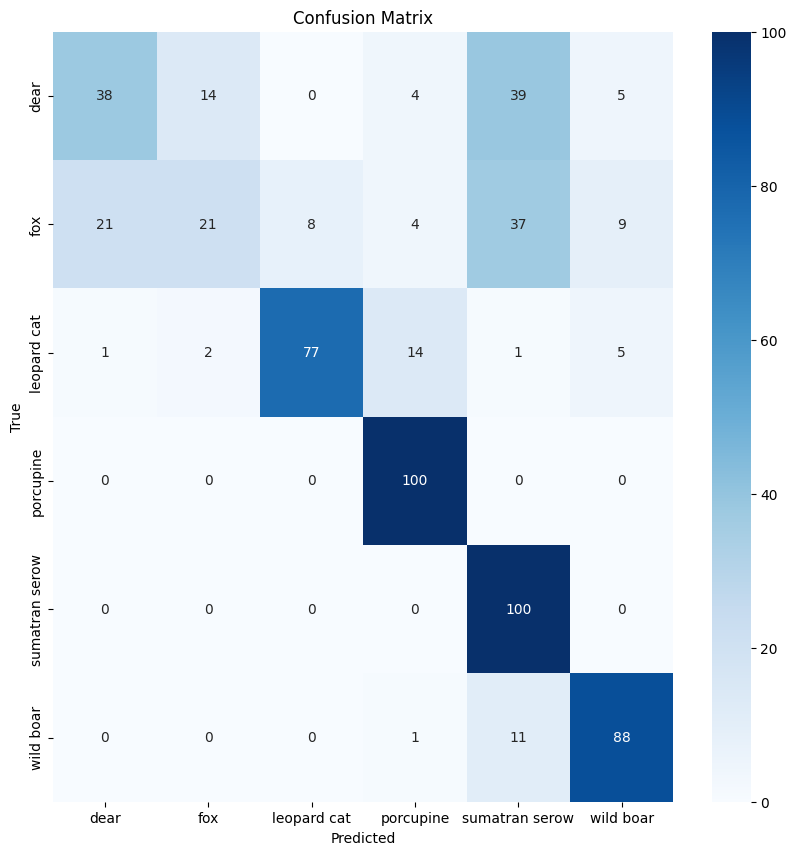

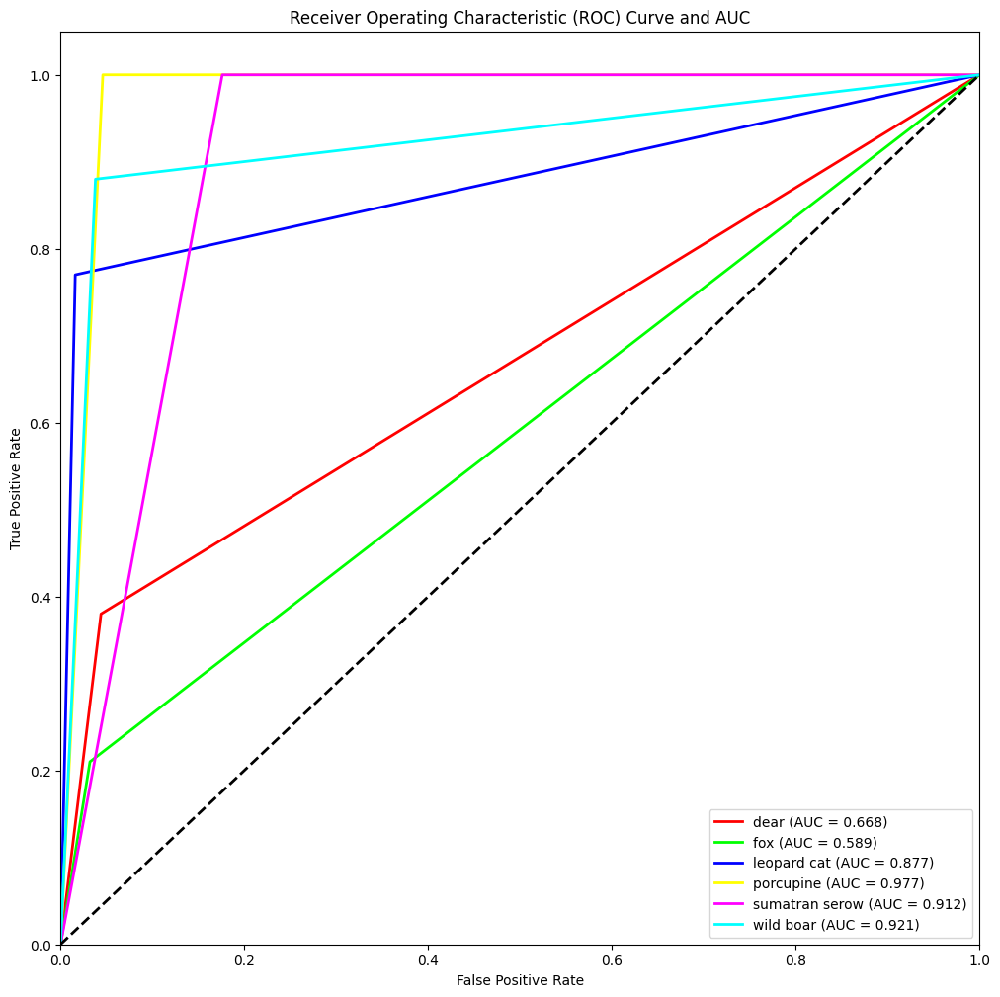

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
def getting_confusion_matrix(base_model_name,model_name):
    confusion_matrix_res = confusion_matrix(true_labels, predicted_labels)
    plt.figure(figsize=(10, 10))
    sns.heatmap(confusion_matrix_res, annot=True, fmt="d", cmap="Blues",xticklabels=class_labels, yticklabels=class_labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')

    confusion_matrix_path = os.path.join(os.getcwd(),  f'./confusion_matrices/{model_name}/{base_model_name}')
    curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
    filename = f'{model_name}-confusion_matrix-{format(curr_datetime)}.png'

    if not os.path.exists(confusion_matrix_path):
        os.makedirs(confusion_matrix_path)

    # Save the plot to the specified folder
    save_path = os.path.join(confusion_matrix_path, filename)
    plt.savefig(save_path, bbox_inches='tight')
base_model_name="MobilenetV2"
getting_confusion_matrix(base_model_name,"Optimized_Fine_Tuned_model")
fpr, tpr, roc_auc = get_ROC_AUC(predicted_labels, true_labels)
save_ROC_AUC(fpr, tpr, roc_auc)

In [ ]:

from sklearn.metrics import classification_report


#load tf lite model and want to calculate accuracy of the compressed model
interpreter = tf.lite.Interpreter(model_path='./tflite_optimized_models/Compressed_MobilenetV2_Stripped_Pruned_TFLITE/Compressed_MobilenetV2_Stripped_Pruned_TFLITE.tflite')

true_labels = true_labels
predicted_labels = []

for images, labels in test_dataset:
    for image in images:
        image = tf.expand_dims(image, axis=0)
        interpreter.allocate_tensors()
        interpreter.set_tensor(interpreter.get_input_details()[0]['index'], image)
        interpreter.invoke()
        preds = interpreter.get_tensor(interpreter.get_output_details()[0]['index'])
        preds = np.argmax(preds, axis=1)
        predicted_labels.extend(preds)

print(classification_report(true_labels, predicted_labels, target_names=class_labels))




                precision    recall  f1-score   support

          dear       0.54      0.31      0.39       100
           fox       0.48      0.14      0.22       100
   leopard cat       0.93      0.75      0.83       100
     porcupine       0.79      1.00      0.88       100
sumatran serow       0.50      1.00      0.67       100
     wild boar       0.80      0.86      0.83       100

      accuracy                           0.68       600
     macro avg       0.67      0.68      0.64       600
  weighted avg       0.67      0.68      0.64       600



NameError: name 'model_name' is not defined

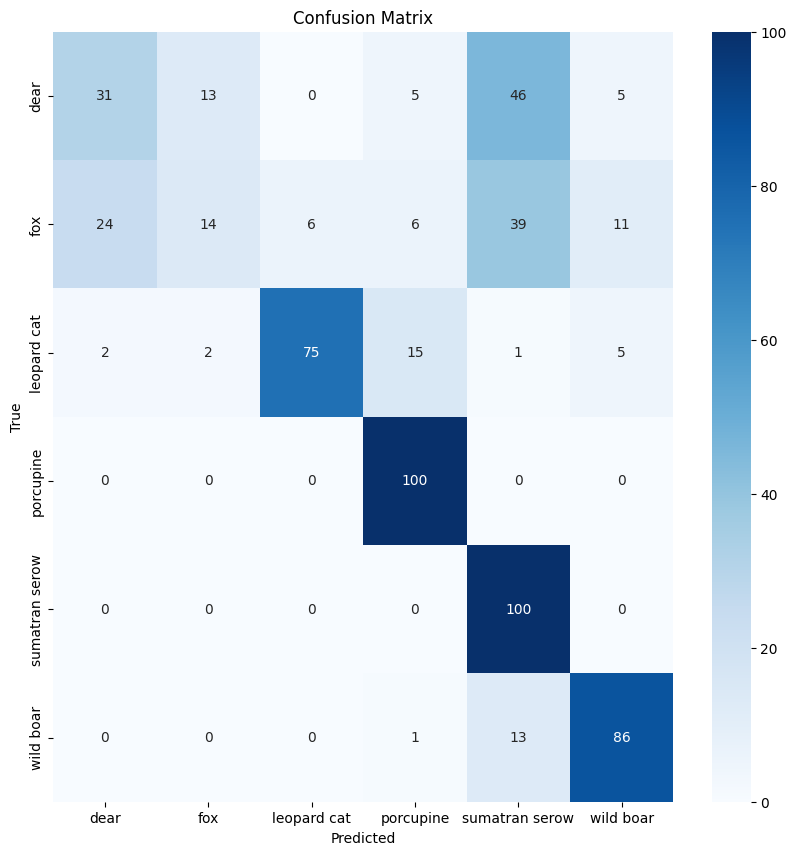

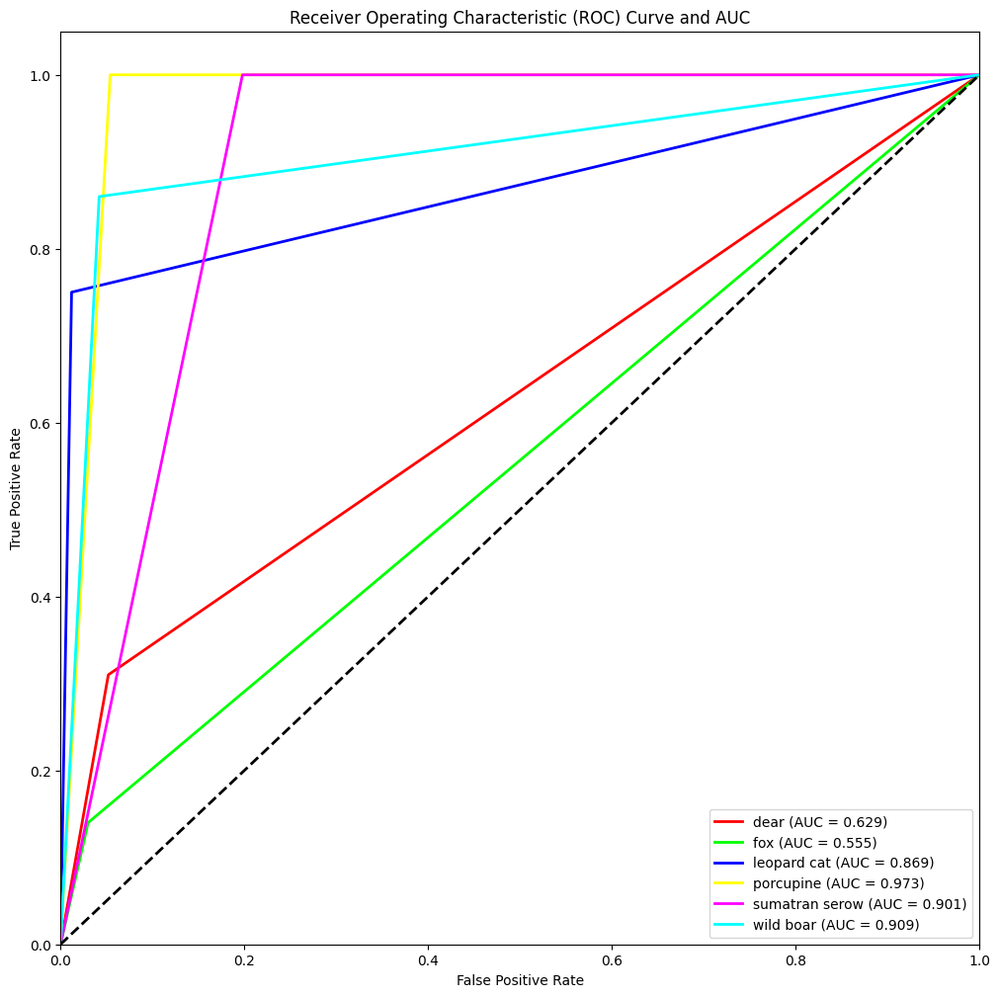

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
def getting_confusion_matrix(base_model_name,model_name):
    confusion_matrix_res = confusion_matrix(true_labels, predicted_labels)
    plt.figure(figsize=(10, 10))
    sns.heatmap(confusion_matrix_res, annot=True, fmt="d", cmap="Blues",xticklabels=class_labels, yticklabels=class_labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')

    confusion_matrix_path = os.path.join(os.getcwd(),  f'./confusion_matrices/{model_name}/{base_model_name}')
    curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
    filename = f'{model_name}-confusion_matrix-{format(curr_datetime)}.png'

    if not os.path.exists(confusion_matrix_path):
        os.makedirs(confusion_matrix_path)

    # Save the plot to the specified folder
    save_path = os.path.join(confusion_matrix_path, filename)
    plt.savefig(save_path, bbox_inches='tight')
base_model_name="MobilenetV2"
getting_confusion_matrix(base_model_name,"Optimized_Fine_Tuned_model")
fpr, tpr, roc_auc = get_ROC_AUC(predicted_labels, true_labels)
save_ROC_AUC(fpr, tpr, roc_auc)

Loading Sparsity Preserved Clustering-Stripped

In [ ]:
import tensorflow as tf

# Assuming "./optimized_saved_models/Stripped_Pruned_Model" is the correct path to your saved model
model_path = "./optimized_saved_models/stripped_clustered_model"

# Load the model
try:
    loaded_stripped_clustered_model = tf.keras.models.load_model(model_path)
    print("Model loaded successfully.")
except Exception as e:
    print("Error loading the model:", str(e))

Model loaded successfully.


In [ ]:
loaded_stripped_clustered_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

In [ ]:
# Stripped Pruned Model
converter = tf.lite.TFLiteConverter.from_keras_model(loaded_stripped_clustered_model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
stripped_clustered_model_tflite_model = converter.convert()


INFO:tensorflow:Assets written to: C:\Users\DINUKA~1\AppData\Local\Temp\tmpyo4ioctv\assets


INFO:tensorflow:Assets written to: C:\Users\DINUKA~1\AppData\Local\Temp\tmpyo4ioctv\assets


In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(loaded_stripped_clustered_model)
compressed_stripped_clustered_model_tflite_model = converter.convert()

INFO:tensorflow:Assets written to: C:\Users\DINUKA~1\AppData\Local\Temp\tmpwj98x5zt\assets


INFO:tensorflow:Assets written to: C:\Users\DINUKA~1\AppData\Local\Temp\tmpwj98x5zt\assets


In [ ]:
optimized_model_name="MobilenetV2_stripped_clustered_model"
tflite_models_dir = os.path.join(os.getcwd(), 'tflite_optimized_models')
tflite_model_dir = os.path.join(tflite_models_dir, optimized_model_name)
if not os.path.exists(tflite_model_dir):
    os.makedirs(tflite_model_dir)

tflite_model_save_path = os.path.join(tflite_model_dir,optimized_model_name + ".tflite")
with open(tflite_model_save_path, 'wb') as f:
    f.write(stripped_clustered_model_tflite_model)

In [ ]:
optimized_model_name="Compressed_MobilenetV2_stripped_clustered_model"
tflite_models_dir = os.path.join(os.getcwd(), 'tflite_optimized_models')
tflite_model_dir = os.path.join(tflite_models_dir, optimized_model_name)
if not os.path.exists(tflite_model_dir):
    os.makedirs(tflite_model_dir)

tflite_model_save_path = os.path.join(tflite_model_dir,optimized_model_name + ".tflite")
with open(tflite_model_save_path, 'wb') as f:
    f.write(compressed_stripped_clustered_model_tflite_model)

In [ ]:
# Get the size of the TFLite model in megabytes
tflite_model_size_bytes = len(stripped_clustered_model_tflite_model)
tflite_model_size_mb = tflite_model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes
print("Size of the TFLite model:", tflite_model_size_mb, "MB")

Size of the TFLite model: 2.391357421875 MB


In [ ]:
# Get the size of the TFLite model in megabytes
tflite_model_size_bytes = len(compressed_stripped_clustered_model_tflite_model)
tflite_model_size_mb = tflite_model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes
print("Size of the TFLite model:", tflite_model_size_mb, "MB")

Size of the TFLite model: 8.476730346679688 MB


In [ ]:

from sklearn.metrics import classification_report


#load tf lite model and want to calculate accuracy of the compressed model
interpreter = tf.lite.Interpreter(model_path='./tflite_optimized_models/MobilenetV2_stripped_clustered_model/MobilenetV2_stripped_clustered_model.tflite')

true_labels = true_labels
predicted_labels = []

for images, labels in test_dataset:
    for image in images:
        image = tf.expand_dims(image, axis=0)
        interpreter.allocate_tensors()
        interpreter.set_tensor(interpreter.get_input_details()[0]['index'], image)
        interpreter.invoke()
        preds = interpreter.get_tensor(interpreter.get_output_details()[0]['index'])
        preds = np.argmax(preds, axis=1)
        predicted_labels.extend(preds)

print(classification_report(true_labels, predicted_labels, target_names=class_labels))

                precision    recall  f1-score   support

          dear       0.58      0.47      0.52       100
           fox       0.50      0.10      0.17       100
   leopard cat       0.89      0.70      0.78       100
     porcupine       0.81      1.00      0.89       100
sumatran serow       0.57      0.99      0.73       100
     wild boar       0.77      0.95      0.85       100

      accuracy                           0.70       600
     macro avg       0.69      0.70      0.66       600
  weighted avg       0.69      0.70      0.66       600



NameError: name 'model_name' is not defined

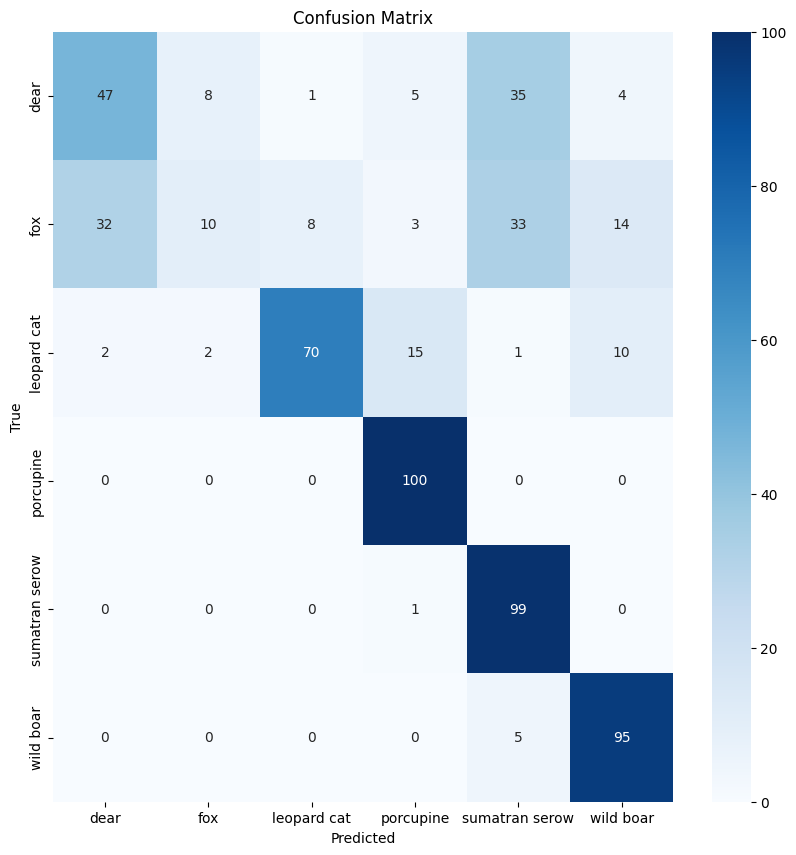

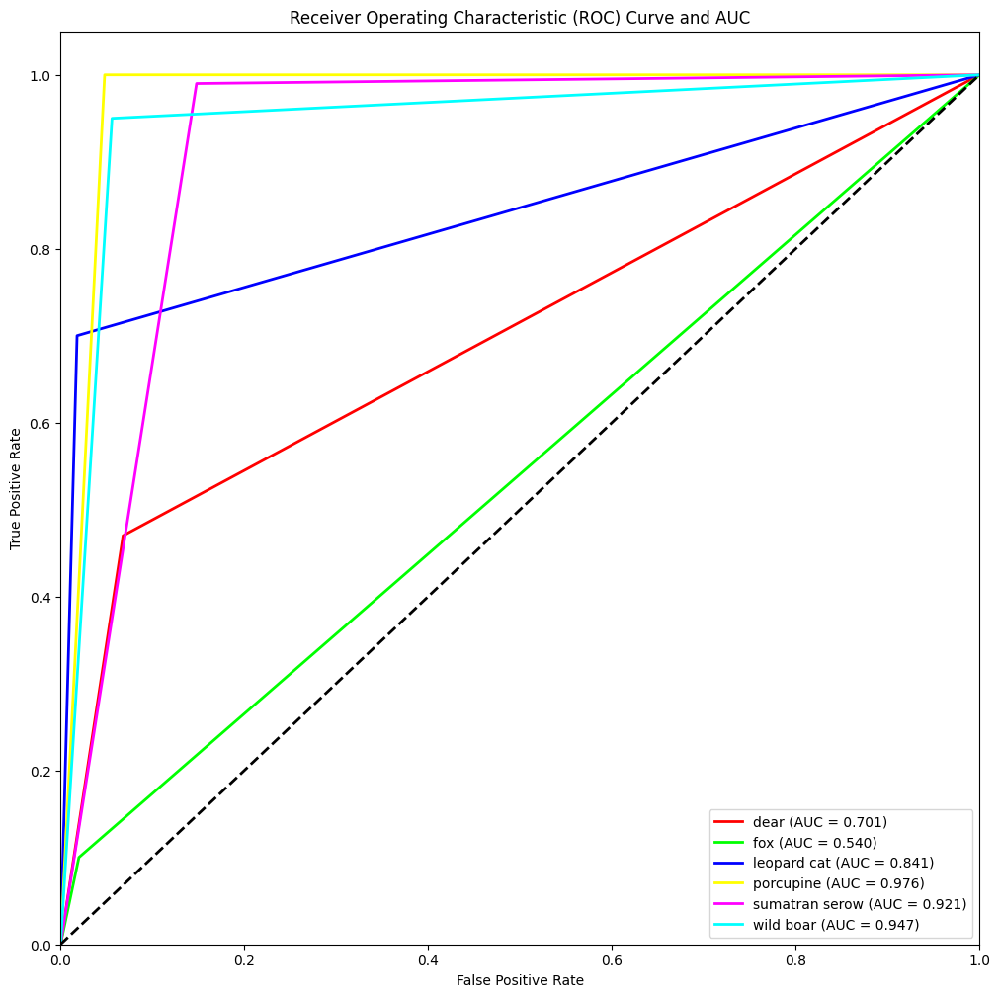

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
def getting_confusion_matrix(base_model_name,model_name):
    confusion_matrix_res = confusion_matrix(true_labels, predicted_labels)
    plt.figure(figsize=(10, 10))
    sns.heatmap(confusion_matrix_res, annot=True, fmt="d", cmap="Blues",xticklabels=class_labels, yticklabels=class_labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')

    confusion_matrix_path = os.path.join(os.getcwd(),  f'./confusion_matrices/{model_name}/{base_model_name}')
    curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
    filename = f'{model_name}-confusion_matrix-{format(curr_datetime)}.png'

    if not os.path.exists(confusion_matrix_path):
        os.makedirs(confusion_matrix_path)

    # Save the plot to the specified folder
    save_path = os.path.join(confusion_matrix_path, filename)
    plt.savefig(save_path, bbox_inches='tight')
base_model_name="MobilenetV2"
getting_confusion_matrix(base_model_name,"Optimized Sparsity Preserved Clustering")
fpr, tpr, roc_auc = get_ROC_AUC(predicted_labels, true_labels)
save_ROC_AUC(fpr, tpr, roc_auc)

In [ ]:

from sklearn.metrics import classification_report


#load tf lite model and want to calculate accuracy of the compressed model
interpreter = tf.lite.Interpreter(model_path='./tflite_optimized_models/Compressed_MobilenetV2_stripped_clustered_model/Compressed_MobilenetV2_stripped_clustered_model.tflite')

true_labels = true_labels
predicted_labels = []

for images, labels in test_dataset:
    for image in images:
        image = tf.expand_dims(image, axis=0)
        interpreter.allocate_tensors()
        interpreter.set_tensor(interpreter.get_input_details()[0]['index'], image)
        interpreter.invoke()
        preds = interpreter.get_tensor(interpreter.get_output_details()[0]['index'])
        preds = np.argmax(preds, axis=1)
        predicted_labels.extend(preds)

print(classification_report(true_labels, predicted_labels, target_names=class_labels))

                precision    recall  f1-score   support

          dear       0.59      0.47      0.52       100
           fox       0.50      0.09      0.15       100
   leopard cat       0.91      0.70      0.79       100
     porcupine       0.79      1.00      0.88       100
sumatran serow       0.55      0.99      0.70       100
     wild boar       0.78      0.92      0.84       100

      accuracy                           0.69       600
     macro avg       0.69      0.69      0.65       600
  weighted avg       0.69      0.69      0.65       600



NameError: name 'model_name' is not defined

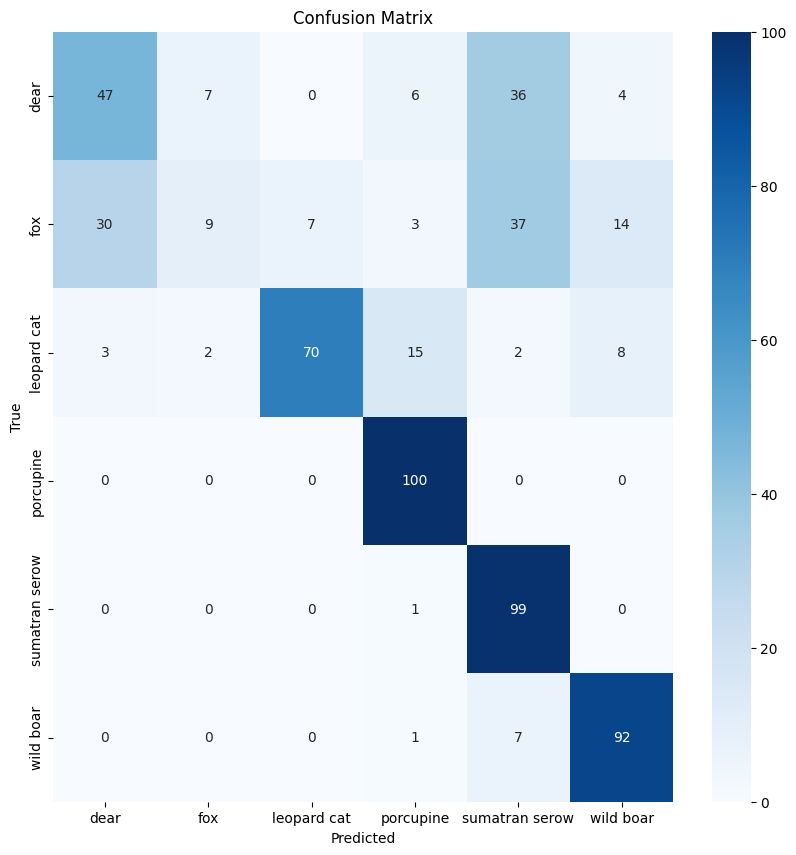

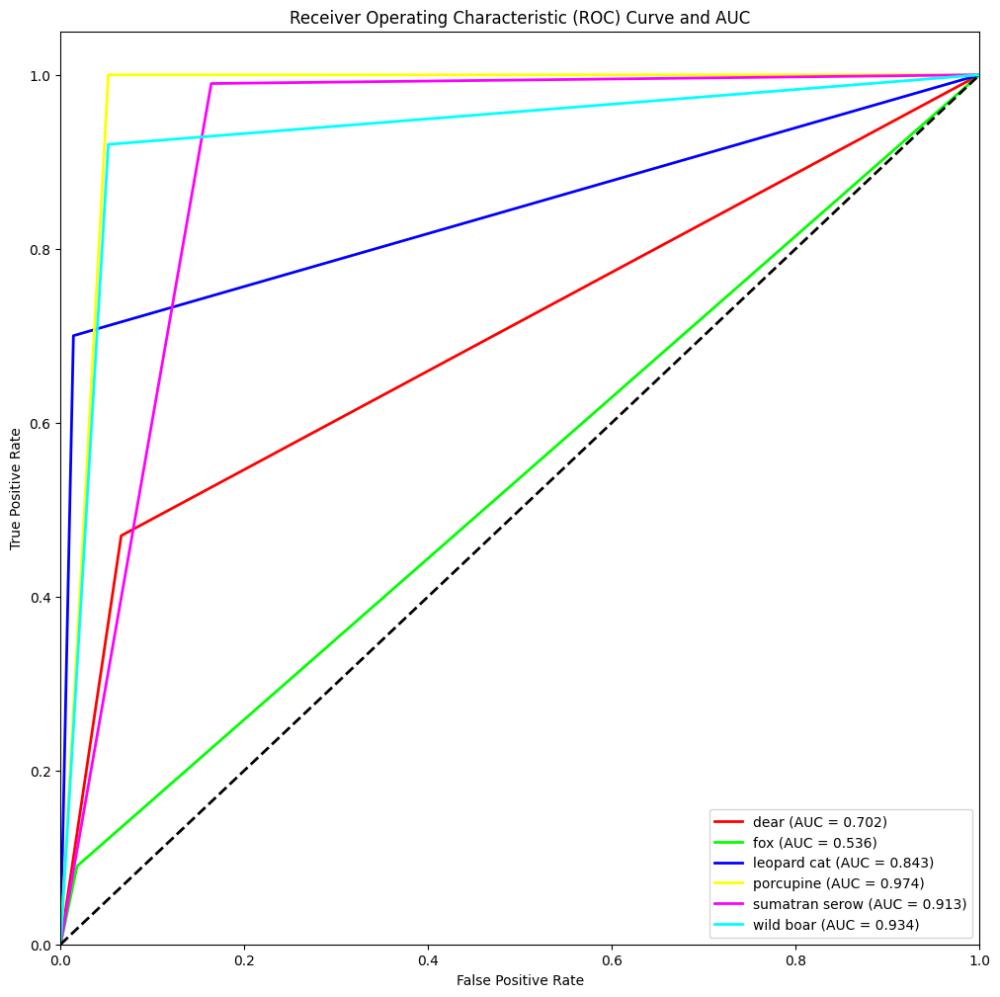

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
def getting_confusion_matrix(base_model_name,model_name):
    confusion_matrix_res = confusion_matrix(true_labels, predicted_labels)
    plt.figure(figsize=(10, 10))
    sns.heatmap(confusion_matrix_res, annot=True, fmt="d", cmap="Blues",xticklabels=class_labels, yticklabels=class_labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')

    confusion_matrix_path = os.path.join(os.getcwd(),  f'./confusion_matrices/{model_name}/{base_model_name}')
    curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
    filename = f'{model_name}-confusion_matrix-{format(curr_datetime)}.png'

    if not os.path.exists(confusion_matrix_path):
        os.makedirs(confusion_matrix_path)

    # Save the plot to the specified folder
    save_path = os.path.join(confusion_matrix_path, filename)
    plt.savefig(save_path, bbox_inches='tight')
base_model_name="MobilenetV2"
getting_confusion_matrix(base_model_name,"Compressed Sparsity Preserved Clustering")
fpr, tpr, roc_auc = get_ROC_AUC(predicted_labels, true_labels)
save_ROC_AUC(fpr, tpr, roc_auc)

Fine Tuned Model

In [25]:
import tensorflow as tf

# Assuming "./optimized_saved_models/Stripped_Pruned_Model" is the correct path to your saved model
model_path = "./optimized_saved_models/MobileNetV2_With_fineTune_Custom_Classification"

# Load the model
try:
    Fine_Tuned_model = tf.keras.models.load_model(model_path,compile=False)
    print("Model loaded successfully.")
except Exception as e:
    print("Error loading the model:", str(e))

Model loaded successfully.


In [26]:
base_learning_rate = 0.0001
Fine_Tuned_model.compile(loss='sparse_categorical_crossentropy',
              optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001/10),
              metrics=['accuracy', 'top_k_categorical_accuracy'])
Fine_Tuned_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']        

 block_8_depthwise (Depthwi  (None, 14, 14, 384)          3456      ['block_8_expand_relu[0][0]'] 
 seConv2D)                                                                                        
                                                                                                  
 block_8_depthwise_BN (Batc  (None, 14, 14, 384)          1536      ['block_8_depthwise[0][0]']   
 hNormalization)                                                                                  
                                                                                                  
 block_8_depthwise_relu (Re  (None, 14, 14, 384)          0         ['block_8_depthwise_BN[0][0]']
 LU)                                                                                              
                                                                                                  
 block_8_project (Conv2D)    (None, 14, 14, 64)           24576     ['block_8_depthwise_relu[0][0]
          

In [27]:
converter = tf.lite.TFLiteConverter.from_keras_model(Fine_Tuned_model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
Fine_Tuned_model_tflite_model = converter.convert()


INFO:tensorflow:Assets written to: C:\Users\DINUKA~1\AppData\Local\Temp\tmpm9bxw2oo\assets


INFO:tensorflow:Assets written to: C:\Users\DINUKA~1\AppData\Local\Temp\tmpm9bxw2oo\assets


In [28]:
converter = tf.lite.TFLiteConverter.from_keras_model(Fine_Tuned_model)
finetuned_compressed_tflite_model = converter.convert()


INFO:tensorflow:Assets written to: C:\Users\DINUKA~1\AppData\Local\Temp\tmpdw5ckf1t\assets


INFO:tensorflow:Assets written to: C:\Users\DINUKA~1\AppData\Local\Temp\tmpdw5ckf1t\assets


In [29]:
import os
optimized_model_name="MobilenetV2_Fine_Tuned_model"
tflite_models_dir = os.path.join(os.getcwd(), 'tflite_optimized_models')
tflite_model_dir = os.path.join(tflite_models_dir, optimized_model_name)
if not os.path.exists(tflite_model_dir):
    os.makedirs(tflite_model_dir)

tflite_model_save_path = os.path.join(tflite_model_dir,optimized_model_name + ".tflite")
with open(tflite_model_save_path, 'wb') as f:
    f.write(Fine_Tuned_model_tflite_model)

In [30]:

optimized_model_name="Compressed_MobilenetV2_Fine_Tuned"
tflite_models_dir = os.path.join(os.getcwd(), 'tflite_optimized_models')
tflite_model_dir = os.path.join(tflite_models_dir, optimized_model_name)
if not os.path.exists(tflite_model_dir):
    os.makedirs(tflite_model_dir)

tflite_model_save_path = os.path.join(tflite_model_dir,optimized_model_name + ".tflite")
with open(tflite_model_save_path, 'wb') as f:
    f.write(finetuned_compressed_tflite_model)

In [31]:
# Get the size of the TFLite model in megabytes
tflite_model_size_bytes = len(Fine_Tuned_model_tflite_model)
tflite_model_size_mb = tflite_model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes
print("Size of the TFLite model:", tflite_model_size_mb, "MB")

Size of the TFLite model: 2.391357421875 MB


In [32]:
# Get the size of the TFLite model in megabytes
tflite_model_size_bytes = len(finetuned_compressed_tflite_model)
tflite_model_size_mb = tflite_model_size_bytes / (1024 * 1024)  # Convert bytes to megabytes
print("Size of the TFLite model:", tflite_model_size_mb, "MB")

Size of the TFLite model: 8.476730346679688 MB


In [33]:

from sklearn.metrics import classification_report


#load tf lite model and want to calculate accuracy of the compressed model
interpreter = tf.lite.Interpreter(model_path='./tflite_optimized_models/MobilenetV2_Fine_Tuned_model/MobilenetV2_Fine_Tuned_model.tflite')

true_labels = true_labels
predicted_labels = []

for images, labels in test_dataset:
    for image in images:
        image = tf.expand_dims(image, axis=0)
        interpreter.allocate_tensors()
        interpreter.set_tensor(interpreter.get_input_details()[0]['index'], image)
        interpreter.invoke()
        preds = interpreter.get_tensor(interpreter.get_output_details()[0]['index'])
        preds = np.argmax(preds, axis=1)
        predicted_labels.extend(preds)

print(classification_report(true_labels, predicted_labels, target_names=class_labels))

                precision    recall  f1-score   support

          dear       1.00      0.15      0.26       600
           fox       0.00      0.00      0.00         0
   leopard cat       0.00      0.00      0.00         0
     porcupine       0.00      0.00      0.00         0
sumatran serow       0.00      0.00      0.00         0
     wild boar       0.00      0.00      0.00         0

      accuracy                           0.15       600
     macro avg       0.17      0.02      0.04       600
  weighted avg       1.00      0.15      0.26       600



c:\Users\Dinuka Thathsara\anaconda3\envs\tfKernal\Lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Dinuka Thathsara\anaconda3\envs\tfKernal\Lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Dinuka Thathsara\anaconda3\envs\tfKernal\Lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import classification_report


#load tf lite model and want to calculate accuracy of the compressed model
interpreter = tf.lite.Interpreter(model_path='./tflite_optimized_models/Compressed_MobilenetV2_Fine_Tuned/Compressed_MobilenetV2_Fine_Tuned.tflite')

true_labels = true_labels
predicted_labels = []

for images, labels in test_dataset:
    for image in images:
        image = tf.expand_dims(image, axis=0)
        interpreter.allocate_tensors()
        interpreter.set_tensor(interpreter.get_input_details()[0]['index'], image)
        interpreter.invoke()
        preds = interpreter.get_tensor(interpreter.get_output_details()[0]['index'])
        preds = np.argmax(preds, axis=1)
        predicted_labels.extend(preds)

print(classification_report(true_labels, predicted_labels, target_names=class_labels))

                precision    recall  f1-score   support

          dear       0.72      0.36      0.48       100
           fox       0.46      0.06      0.11       100
   leopard cat       0.95      0.70      0.80       100
     porcupine       0.79      1.00      0.88       100
sumatran serow       0.50      1.00      0.67       100
     wild boar       0.69      0.94      0.79       100

      accuracy                           0.68       600
     macro avg       0.68      0.68      0.62       600
  weighted avg       0.68      0.68      0.62       600



In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
def getting_confusion_matrix(base_model_name,model_name):
    confusion_matrix_res = confusion_matrix(true_labels, predicted_labels)
    plt.figure(figsize=(10, 10))
    sns.heatmap(confusion_matrix_res, annot=True, fmt="d", cmap="Blues",xticklabels=class_labels, yticklabels=class_labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')

    confusion_matrix_path = os.path.join(os.getcwd(),  f'./confusion_matrices/{model_name}/{base_model_name}')
    curr_datetime = datetime.now().strftime("%d-%m-%Y-%H-%M-%S")
    filename = f'{model_name}-confusion_matrix-{format(curr_datetime)}.png'

    if not os.path.exists(confusion_matrix_path):
        os.makedirs(confusion_matrix_path)

    # Save the plot to the specified folder
    save_path = os.path.join(confusion_matrix_path, filename)
    plt.savefig(save_path, bbox_inches='tight')

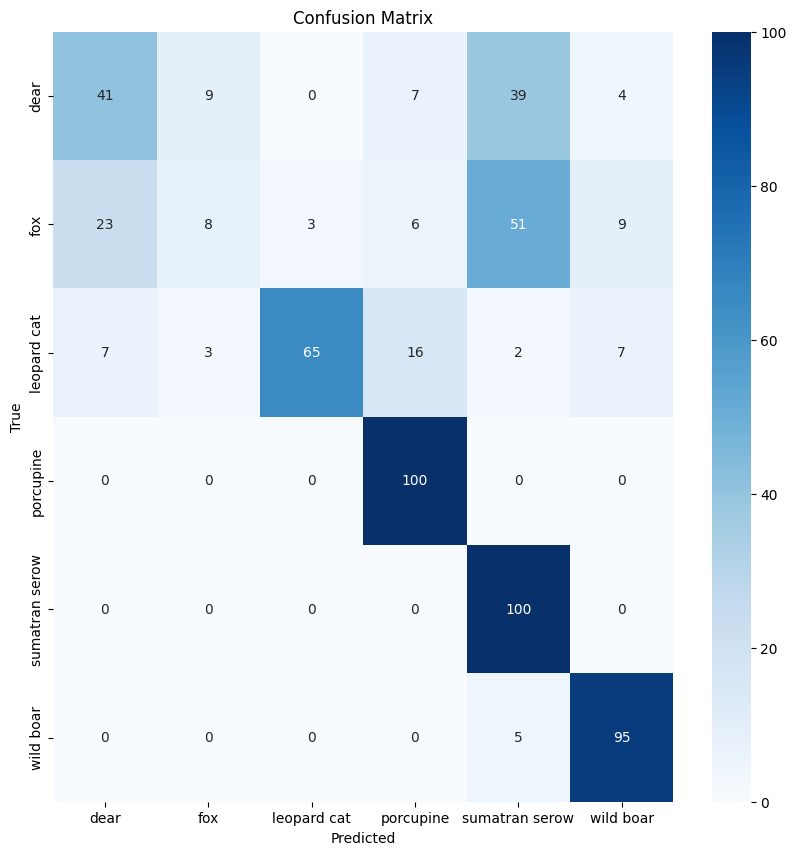

In [ ]:
base_model_name="MobilenetV2"
getting_confusion_matrix(base_model_name,"Optimized_Fine_Tuned_model")

NameError: name 'model_name' is not defined

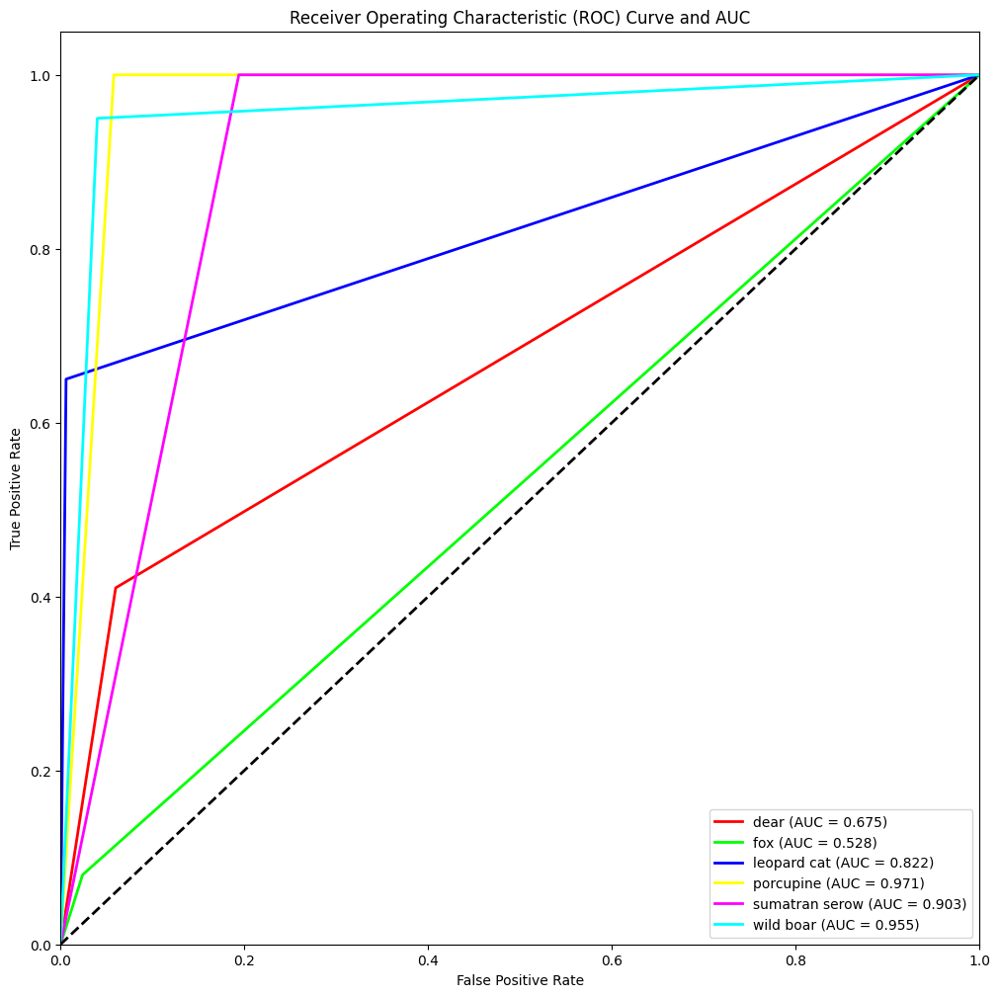

In [ ]:
fpr, tpr, roc_auc = get_ROC_AUC(predicted_labels, true_labels)
save_ROC_AUC(fpr, tpr, roc_auc)

# FLOPS

SyntaxError: invalid syntax (3691922547.py, line 1)

: 